In [804]:
import cospar as cs
import scanpy as sc
import pandas as pd
import scipy.sparse as ssp
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import os
adata_orig=cs.hf.read("/home/zhengtuo/songtao/DestinyNet/tissue_adata_refined_20221106_joint.h5ad")
adata_orig

AnnData object with n_obs × n_vars = 10802 × 21406
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'cell_type_colors', 'clonal_time_points', 'clone_id', 'data_des', 'library_colors', 'neighbors', 'scrublet', 'state_info_colors', 'time_ordering', 'tissue_colors', 'umap'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [792]:
# 检查最大值和最小值
max_value = np.max(adata_orig.X)
min_value = np.min(adata_orig.X)

print(f"Maximum value: {max_value}")
print(f"Minimum value: {min_value}")

Maximum value: 821.181884765625
Minimum value: 0.0


In [763]:
adata_orig=adata_orig[adata_orig.obs['tissue'].isin(['Skull'])]
adata_orig=adata_orig[adata_orig.obs['state_info']!='Dc']
adata_orig.uns['data_des']=['Skull']

adata_orig.obs['cell_type']=adata_orig.obs['cell_type'].astype(str)
adata_orig.obs['cell_type']=pd.Categorical(adata_orig.obs['cell_type']).set_categories(['HSC', 'MkP','Ery', 'Baso', 'Neu', 'Mon', 'LMPP'], ordered=True)
adata_orig.uns['cell_type_colors']=['#d62728','#ff7f0e', '#1f77b4', '#279e68',  '#aa40fc', '#8c564b', '#e377c2'] #,'#d9d9d9']
adata_orig.obs['state_info']=adata_orig.obs['cell_type'].astype(str)

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [764]:
time_map={'LMPP':'t0', 'HSC':'t0', 'NA':'t1','Baso':'t1', 'MkP':'t1', 'Mon':'t1',  'Ery':'t1','Neu':'t1', 'Dc':'t1'}
adata_orig.obs['time_info']=adata_orig.obs['cell_type'].map(time_map)
cs.pp.initialize_adata_object(adata_orig)

Clones without any cells are removed.
Time points with clonal info: ['t0' 't1']


AnnData object with n_obs × n_vars = 6094 × 21406
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'cell_type_colors', 'clonal_time_points', 'clone_id', 'data_des', 'library_colors', 'neighbors', 'scrublet', 'time_ordering', 'tissue_colors', 'umap'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [798]:
df_clone=cs.tl.clone_statistics(adata_orig,joint_variable='state_info');
cs.tl.add_clone_id_for_each_cell(adata_orig)


                  clone_N  clone_fraction
state_info                               
Baso                   22        0.022893
Baso,Ery                4        0.004162
Baso,Ery,Neu            3        0.003122
Baso,HSC                1        0.001041
Baso,HSC,Neu            1        0.001041
...                   ...             ...
Mon,MkP,HSC             2        0.002081
Mon,MkP,LMPP,HSC        1        0.001041
Mon,Neu                33        0.034339
Neu                   119        0.123829
Neu,Mon,HSC             2        0.002081

[97 rows x 2 columns]
-----------
            cell_N  clonal_cell_fraction
state_info                              
Baso            97              0.034336
Ery            459              0.162478
HSC            552              0.195398
LMPP           197              0.069735
MkP            215              0.076106
Mon            573              0.202832
Neu            732              0.259115
add information at obs['clone_id']


In [799]:
adata3=adata_orig[adata_orig.obs['state_info'].isin(['Neu','Ery','MkP','Mon',"HSC"])].copy()
adata3.obs

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


,library,batch,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,...,state_info_old,fate,fate_map_transition_map_MkP,fate_map_transition_map_Ery,fate_map_transition_map_Neu,fate_map_transition_map_Mon,Fate_bias,GT,clone,clone_id
0,LL837_skull,1,2182,10000.000000,2182,8330.0,566.0,6.794718,0.043403,0,...,Mon,2,NaN,NaN,NaN,NaN,NaN,nan,0,
1,LL837_skull,1,2247,10000.000000,2247,10328.0,128.0,1.239349,0.048237,0,...,Ery,2,NaN,NaN,NaN,NaN,NaN,nan,0,
2,LL837_skull,1,4151,9999.999023,4150,29156.0,420.0,1.440527,0.012388,0,...,Mon,2,NaN,NaN,NaN,NaN,NaN,nan,0,
3,LL837_skull,1,1515,10000.000000,1515,6034.0,146.0,2.419622,0.146524,0,...,Meg,2,NaN,NaN,NaN,NaN,NaN,nan,0,
4,LL837_skull,1,1782,10000.000000,1782,6942.0,108.0,1.555748,0.022658,0,...,Meg,2,NaN,NaN,NaN,NaN,NaN,nan,0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5480,LL837_skull,1,4018,9999.999023,4018,28538.0,532.0,1.864181,0.019007,0,...,Ery,2,NaN,NaN,NaN,NaN,NaN,nan,0,
5481,LL837_skull,1,3561,10000.000000,3561,22548.0,534.0,2.368281,0.015441,0,...,Mon,2,NaN,NaN,NaN,NaN,NaN,nan,73,73
5482,LL837_skull,1,4073,9999.999023,4073,29120.0,474.0,1.627747,0.019994,0,...,Ery,2,NaN,NaN,NaN,NaN,NaN,nan,0,
5483,LL837_skull,1,3697,10000.000977,3697,26760.0,632.0,2.361734,0.016280,0,...,Neu,2,NaN,NaN,NaN,NaN,NaN,nan,412,412


In [768]:
np.sum((adata3.obsm['X_clone'].sum(0)>0).A.flatten())


878

In [745]:
adata_orig.obs['state_info'].value_counts()#1179

HSC     2594
Ery     2035
Neu     1510
LMPP    1179
Mon     1087
Meg      618
Dc       390
Baso     334
Lym       43
Name: state_info, dtype: int64

In [731]:
adata.obs['state_info'].unique()

['Mon', 'Ery', 'MkP', 'HSC', 'Neu', 'LMPP', 'Baso']
Categories (7, object): ['Baso', 'Ery', 'HSC', 'LMPP', 'MkP', 'Mon', 'Neu']

In [800]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from colour import Color
from matplotlib.colors import LinearSegmentedColormap
def make_colormap( colors, show_palette = False ): 
    color_ramp = LinearSegmentedColormap.from_list( 'my_list', [ Color( c1 ).rgb for c1 in colors ] )
    if show_palette:
        plt.figure( figsize = (15,3))
        plt.imshow( [list(np.arange(0, len( colors ) , 0.1)) ] , interpolation='nearest', origin='lower', cmap= color_ramp )
        plt.xticks([])
        plt.yticks([])
    return color_ramp

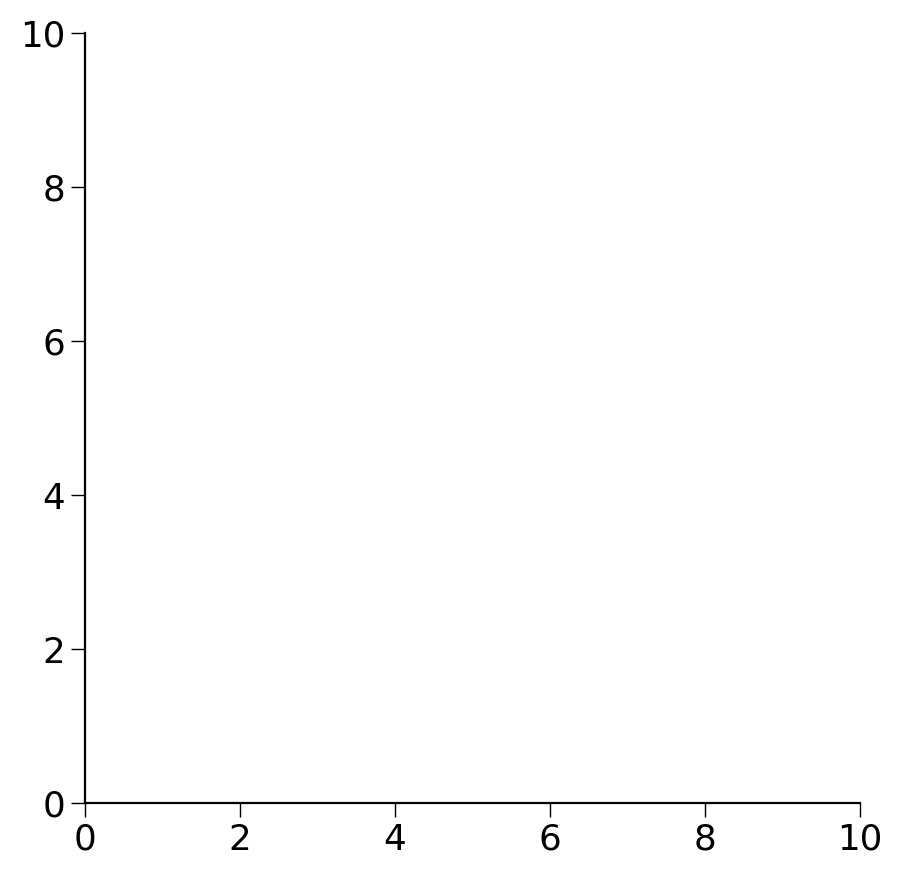

In [801]:
import scanpy as sc
import numpy as np
import operator
import pandas as pd
import torch.nn.functional as F
import torch.nn as nn
import scanpy as sc
import matplotlib.pyplot as plt
import torch
import os
#setPltLinewidth(0)
# os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,6,7"

from torch.nn import DataParallel
import os
import anndata as ad
import cospar as cs
import scanpy as sc
def createFig(figsize=(8, 4)):
    fig,ax=plt.subplots()           
    ax.spines['right'].set_color('none')     
    ax.spines['top'].set_color('none')
    #ax.spines['bottom'].set_color('none')     
    #ax.spines['left'].set_color('none')
    for line in ax.yaxis.get_ticklines():
        line.set_markersize(5)
        line.set_color("#585958")
        line.set_markeredgewidth(0.5)
    for line in ax.xaxis.get_ticklines():
        line.set_markersize(5)
        line.set_markeredgewidth(0.5)
        line.set_color("#585958")
    ax.set_xbound(0,10)
    ax.set_ybound(0,10)
    fig.set_size_inches(figsize)
    return fig,ax
def setPltLinewidth(linewidth:float):
    mpl.rcParams['axes.linewidth'] = linewidth
import matplotlib as mpl
fig,ax=createFig()
fig.set_size_inches(5,5)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
setPltLinewidth(1)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 1


In [805]:
exclude_prefixes = ['MT', 'RP', 'HSP', 'DNAJ']
exclude_condition = ~adata_orig.var_names.str.lower().str.startswith(tuple([prefix.lower() for prefix in exclude_prefixes]))

# 应用过滤条件
adata_orig = adata_orig[:, exclude_condition]
adata_orig

View of AnnData object with n_obs × n_vars = 10802 × 21114
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'cell_type_colors', 'clonal_time_points', 'clone_id', 'data_des', 'library_colors', 'neighbors', 'scrublet', 'time_ordering', 'tissue_colors', 'umap'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [806]:
adata_orig=adata_orig[adata_orig.obs['tissue'].isin(['Skull'])]
adata_orig=adata_orig[adata_orig.obs['state_info']!='Dc']
adata_orig.uns['data_des']=['Skull']

adata_orig.obs['cell_type']=adata_orig.obs['cell_type'].astype(str)
adata_orig.obs['cell_type']=pd.Categorical(adata_orig.obs['cell_type']).set_categories(['HSC', 'MkP','Ery', 'Baso', 'Neu', 'Mon', 'LMPP'], ordered=True)
adata_orig.uns['cell_type_colors']=['#d62728','#ff7f0e', '#1f77b4', '#279e68',  '#aa40fc', '#8c564b', '#e377c2'] #,'#d9d9d9']
adata_orig.obs['state_info']=adata_orig.obs['cell_type'].astype(str)

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [807]:
time_map={'LMPP':'t0', 'HSC':'t0', 'NA':'t1','Baso':'t1', 'MkP':'t1', 'Mon':'t1',  'Ery':'t1','Neu':'t1', 'Dc':'t1'}
adata_orig.obs['time_info']=adata_orig.obs['cell_type'].map(time_map)
cs.pp.initialize_adata_object(adata_orig)

Clones without any cells are removed.
Time points with clonal info: ['t0' 't1']


AnnData object with n_obs × n_vars = 6094 × 21114
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'cell_type_colors', 'clonal_time_points', 'clone_id', 'data_des', 'library_colors', 'neighbors', 'scrublet', 'time_ordering', 'tissue_colors', 'umap'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


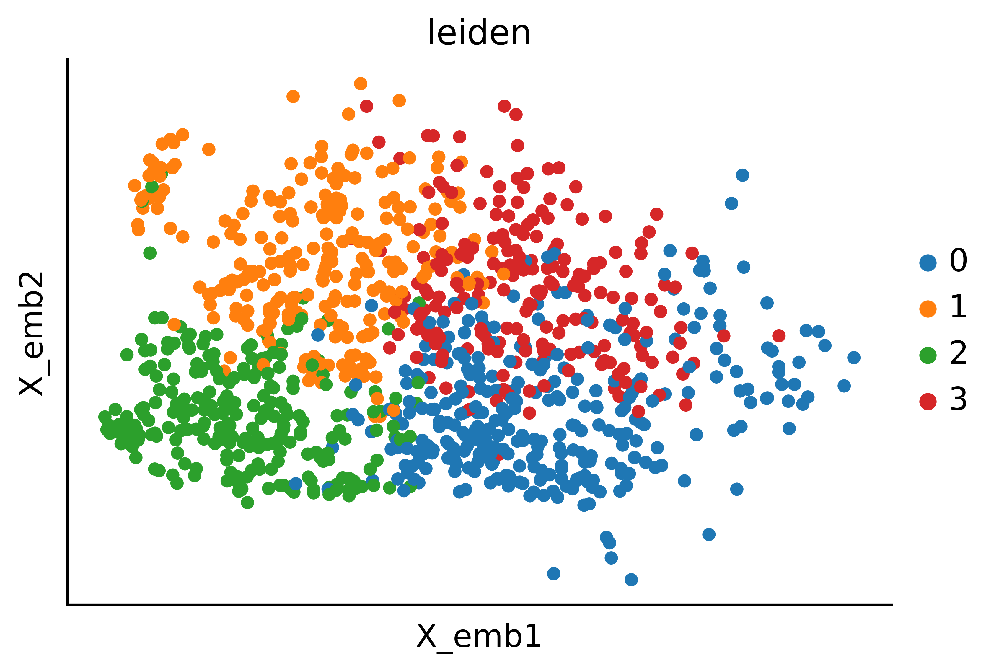

In [808]:
cs.pp.refine_state_info_by_leiden_clustering(adata_orig,selected_key='state_info',selected_values='HSC')


In [809]:
df_clone=cs.tl.clone_statistics(adata_orig,joint_variable='state_info');


                     clone_N  clone_fraction
state_info                                  
Baso                      18        0.017408
Baso,Ery                   4        0.003868
Baso,Ery,Neu               2        0.001934
Baso,HSC                   1        0.000967
Baso,HSC,Neu               1        0.000967
...                      ...             ...
nan,MkP,Ery,Neu,Mon        3        0.002901
nan,Mon                    6        0.005803
nan,Mon,Neu                3        0.002901
nan,Neu                    5        0.004836
nan,Neu,Mon,HSC            1        0.000967

[136 rows x 2 columns]
-----------
            cell_N  clonal_cell_fraction
state_info                              
Baso            97              0.030667
Ery            459              0.145115
HSC            552              0.174518
LMPP           197              0.062283
MkP            215              0.067973
Mon            573              0.181157
Neu            732              0.231426
nan       

In [810]:
df_clone

,clone_id,clone_size,state_info,state_info_N
0,0,2,"Ery,Neu",2
1,1,2,"nan,HSC",2
2,2,2,"MkP,nan",2
3,3,5,"Ery,Mon,Neu",3
4,4,1,nan,1
...,...,...,...,...
1029,1029,1,MkP,1
1030,1030,2,"Ery,Neu",2
1031,1031,2,Ery,1
1032,1032,1,LMPP,1


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


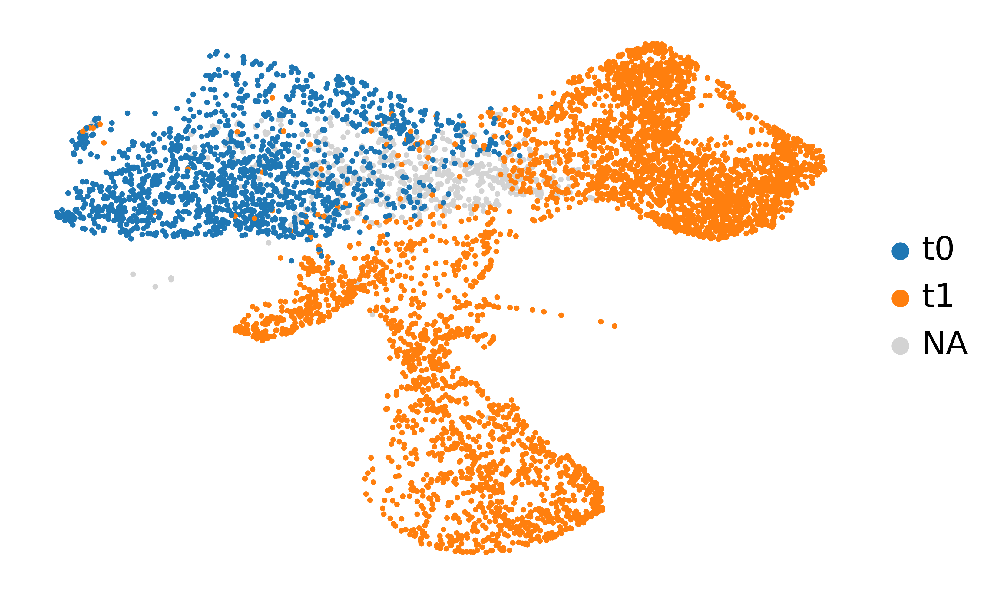

In [811]:
sc.pl.embedding(adata_orig,color='time_info',basis='X_umap',frameon=False,title='',
               save='_time_info')

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


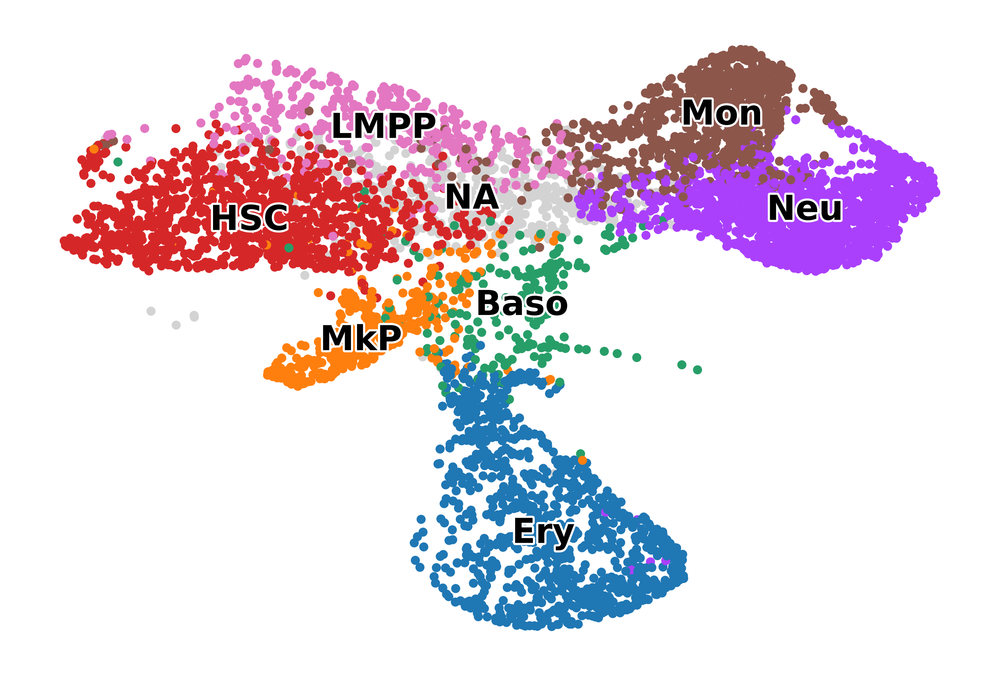

In [812]:
sc.pl.embedding(adata_orig,color='cell_type',basis='X_umap',frameon=False,title='',legend_loc='on data',
           legend_fontsize=12, legend_fontoutline=1.5,s=40,
               save='_skull_celltypes')

[0 0 0 ... 0 0 0]


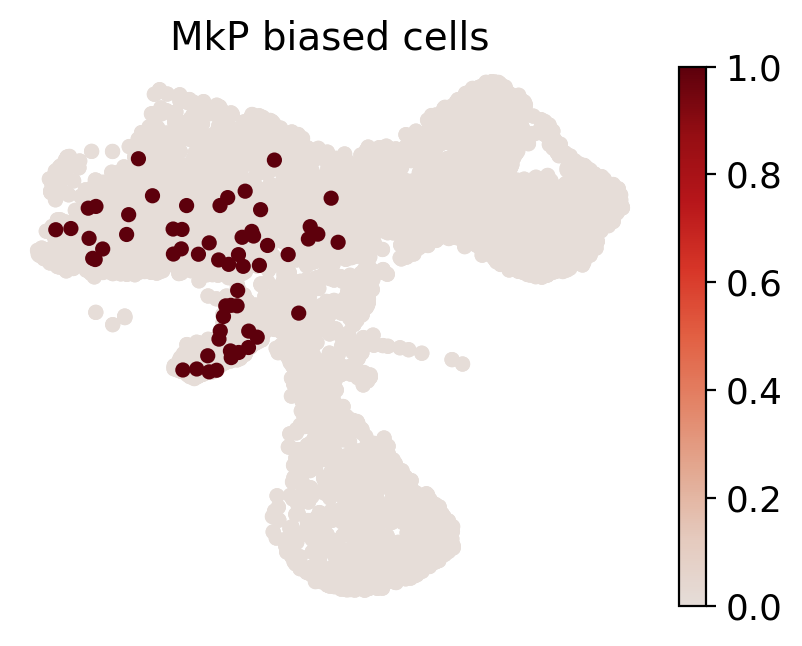

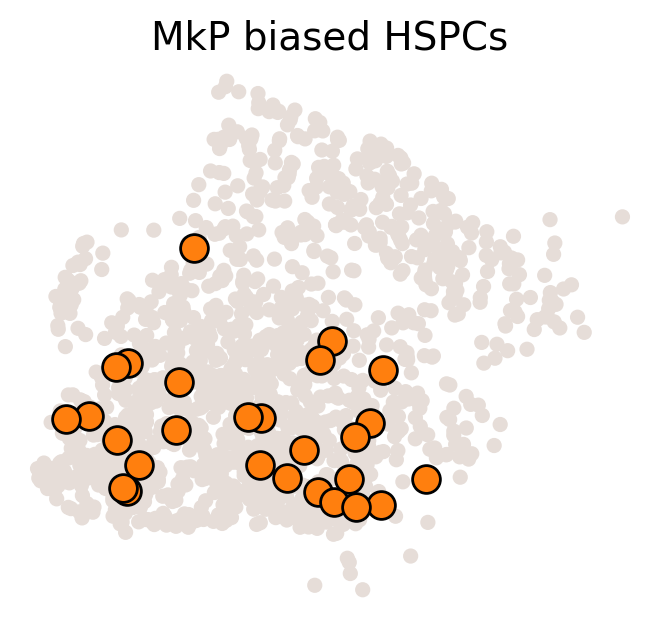

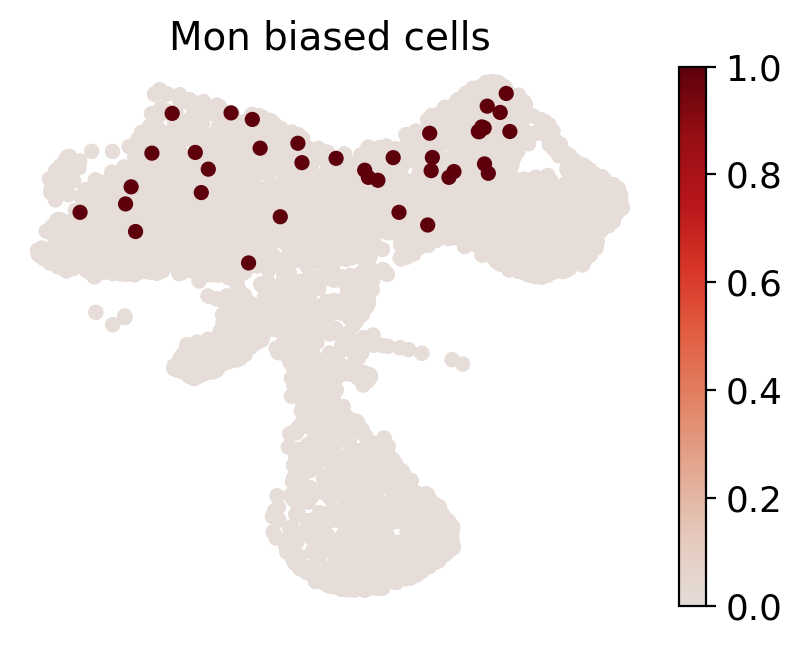

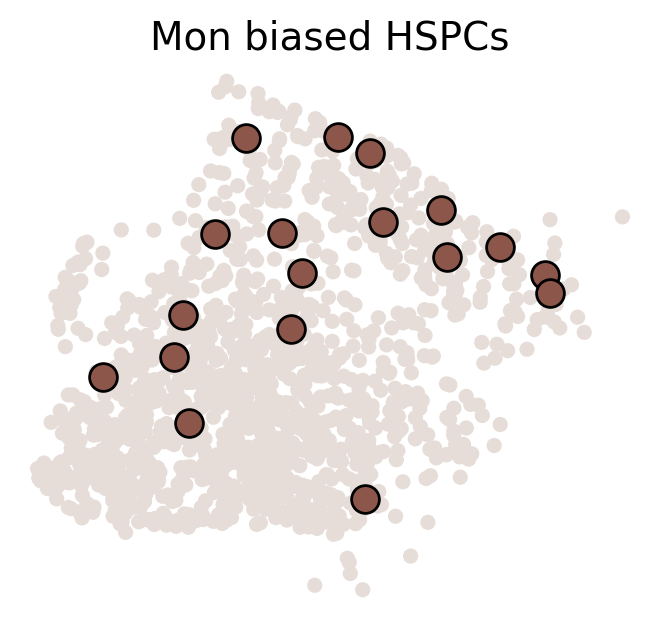

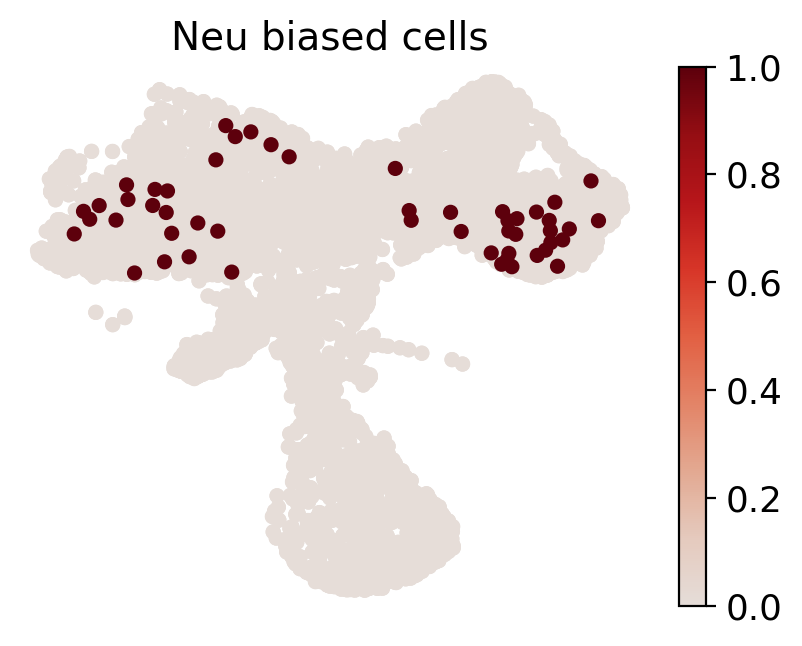

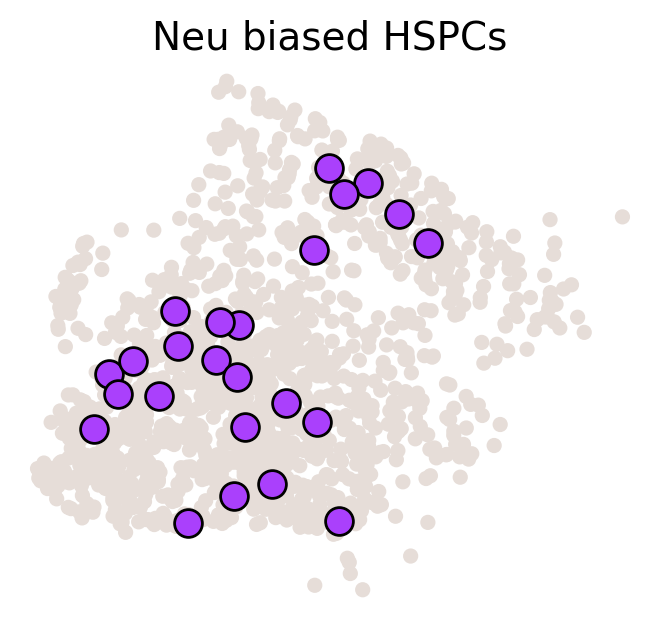

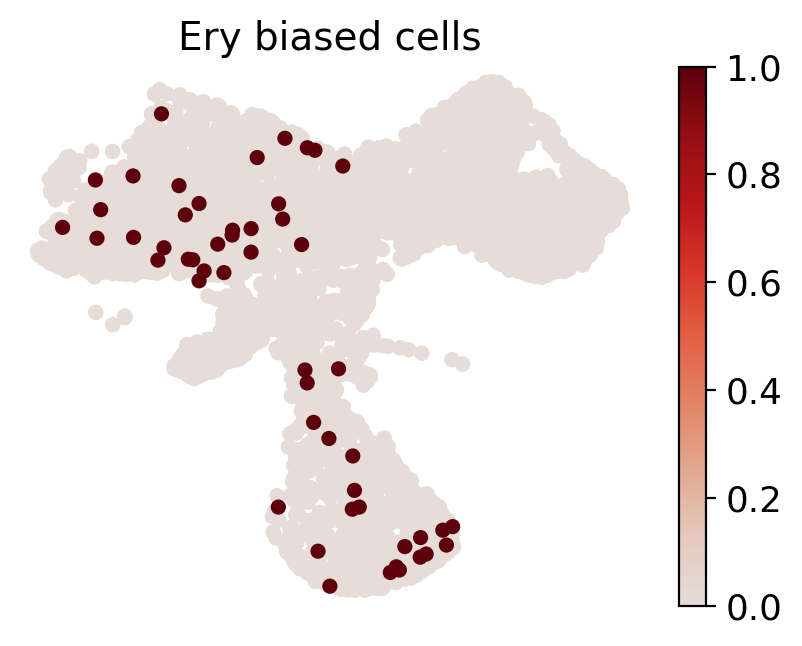

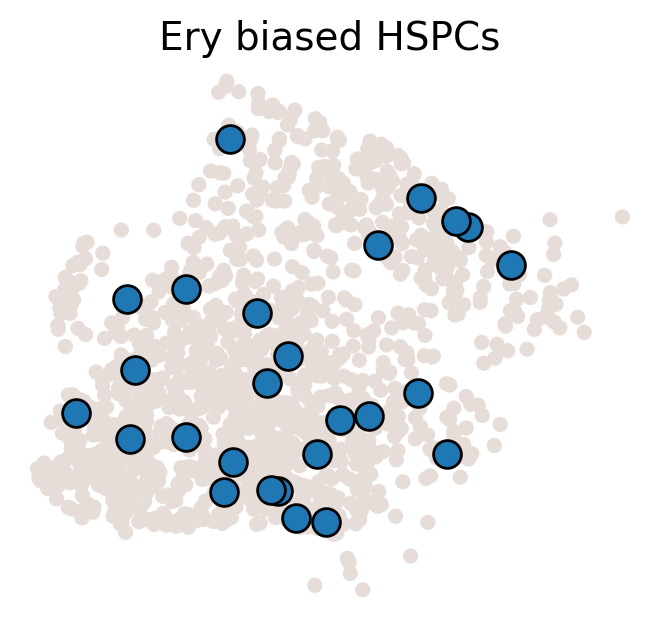

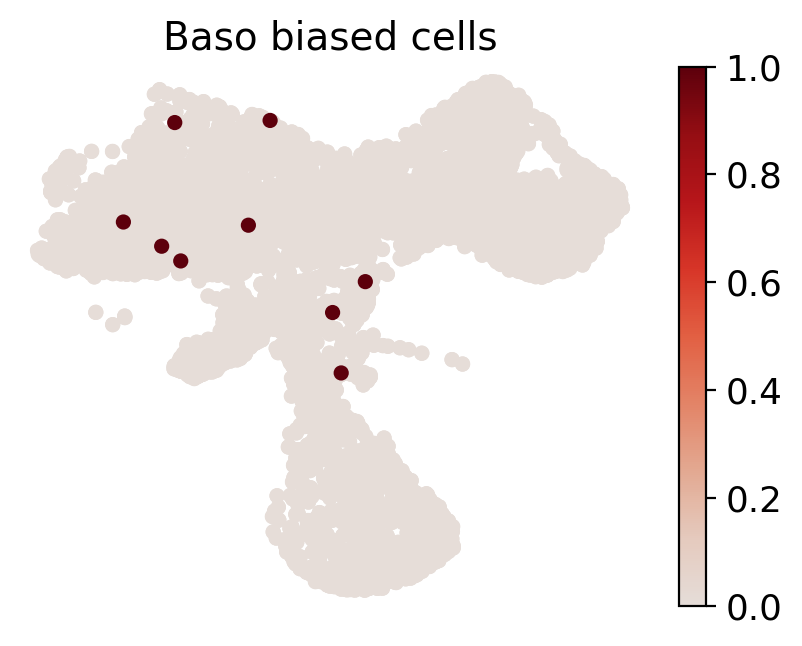

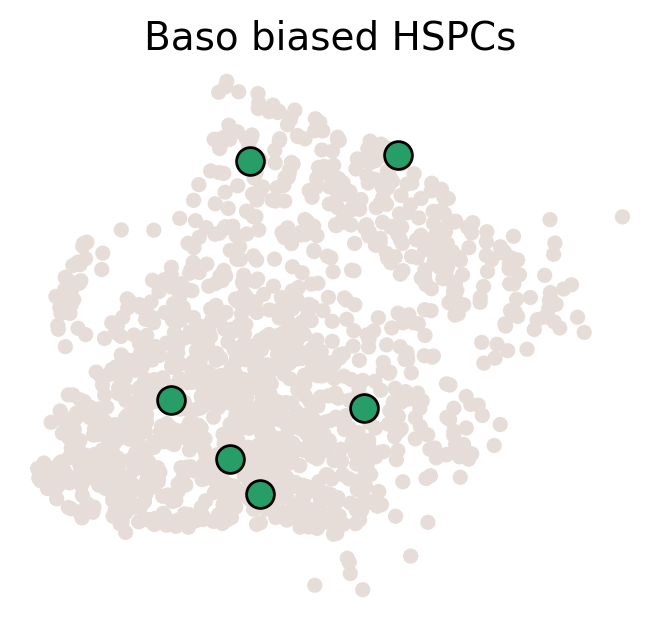

In [813]:
import numpy as np
import scipy.sparse as ssp

# 假设 df_clone 和 adata_orig 已经定义好了
ref_fates = ['MkP', 'Mon', 'Neu', 'Ery', 'Baso']
celltype_colors = dict(zip(adata_orig.obs['cell_type'].cat.categories, adata_orig.uns['cell_type_colors']))

# 设置figure参数
cs.settings.set_figure_params(pointsize=20)

# 处理df_clone的state_info
df_clone['state_info'] = df_clone['state_info'].str.split(',').apply(lambda x: sorted(x)).apply(lambda x: ','.join(x))

# 遍历每个fate
for fate_tmp in ref_fates:
    all_fates_tmp = ref_fates.copy()
    all_fates_tmp.remove(fate_tmp)
    
    # 筛选符合条件的df_clone子集
    df_clone_sub = df_clone[df_clone['state_info'].apply(lambda x: (fate_tmp in x) & (('HSC' in x)  or ('LMPP' in x)) & (np.sum([__ in x for __ in all_fates_tmp]) == 0))]
    
    # 计算MkP_bias
    MkP_bias = (adata_orig.obsm['X_clone'][:, df_clone_sub['clone_id'].to_numpy()].sum(1).A.flatten() > 0).astype(int)
    if(fate_tmp=='MkP'):
        print(MkP_bias)
    # 创建一个新的列在obs中以记录MkP_bias
    adata_orig.obs[f'{fate_tmp}_biased'] = MkP_bias
    
    # 设置cell_id_t1和sp_idx
    cell_id_t1 = np.ones(len(MkP_bias)).astype(bool)
    sp_idx = np.arange(np.sum(cell_id_t1))
    
    # 生成fate map embedding图
    cs.pl.fate_map_embedding(adata_orig, MkP_bias, cell_id_t1=cell_id_t1, sp_idx=sp_idx, figure_title=f'{fate_tmp} biased cells')
    
    # 设置颜色和临时adata
    color_tmp = celltype_colors[fate_tmp]
    adata_tmp = adata_orig.copy()
    adata_tmp.uns['data_des'] = ['all_bias_clones']
    adata_tmp.obsm['X_clone'] = ssp.csr_matrix(np.array([(MkP_bias > 0).astype(int)])).T
    
    # 绘制克隆在流形上的图
    ax = cs.pl.clones_on_manifold(adata_tmp, selected_clone_list=[0], color_list=[color_tmp, color_tmp, color_tmp], clone_markersize=20, selected_times='t0')
    ax.set_title(f'{fate_tmp} biased HSPCs')

# 最终结果中可以通过 adata_orig.obs 查看每个fate的biased cells信息


In [814]:
# 假设 ref_fates 和 adata_orig 已经定义好
ref_fates = ['MkP', 'Mon', 'Neu', 'Ery', 'Baso']

# 创建一个新的列来存储fate信息
adata_orig.obs['fate'] = 2  # 默认值为2

# 设置每个fate的biased信息
for fate_tmp in ref_fates:
    all_fates_tmp = ref_fates.copy()
    all_fates_tmp.remove(fate_tmp)
    
    df_clone_sub = df_clone[df_clone['state_info'].apply(lambda x: (fate_tmp in x) & (('HSC' in x)  or ('LMPP' in x)) & (np.sum([__ in x for __ in all_fates_tmp]) == 0))]
    
    MkP_bias = (adata_orig.obsm['X_clone'][:, df_clone_sub['clone_id'].to_numpy()].sum(1).A.flatten() > 0).astype(int)
    
    adata_orig.obs[f'{fate_tmp}_biased'] = MkP_bias

# 更新fate列的值
adata_orig.obs.loc[adata_orig.obs['MkP_biased'] == 1, 'fate'] = 1

# 如果有一个为1且不是MkP
adata_orig.obs.loc[(adata_orig.obs[['Mon_biased', 'Neu_biased', 'Ery_biased']].sum(axis=1) > 0) & (adata_orig.obs['MkP_biased'] != 1), 'fate'] = 0

# 其余的保持为2
adata_orig.obs.loc[(adata_orig.obs[['MkP_biased', 'Mon_biased', 'Neu_biased', 'Ery_biased']].sum(axis=1) == 0), 'fate'] = 2

# 删除临时的biased列
for fate_tmp in ref_fates:
    del adata_orig.obs[f'{fate_tmp}_biased']


In [815]:
adata_orig.obs['fate']=adata_orig.obs['fate'].astype(str)

In [816]:
adata_orig.uns['cell_type_colors']

['#d62728', '#ff7f0e', '#1f77b4', '#279e68', '#aa40fc', '#8c564b', '#e377c2']

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


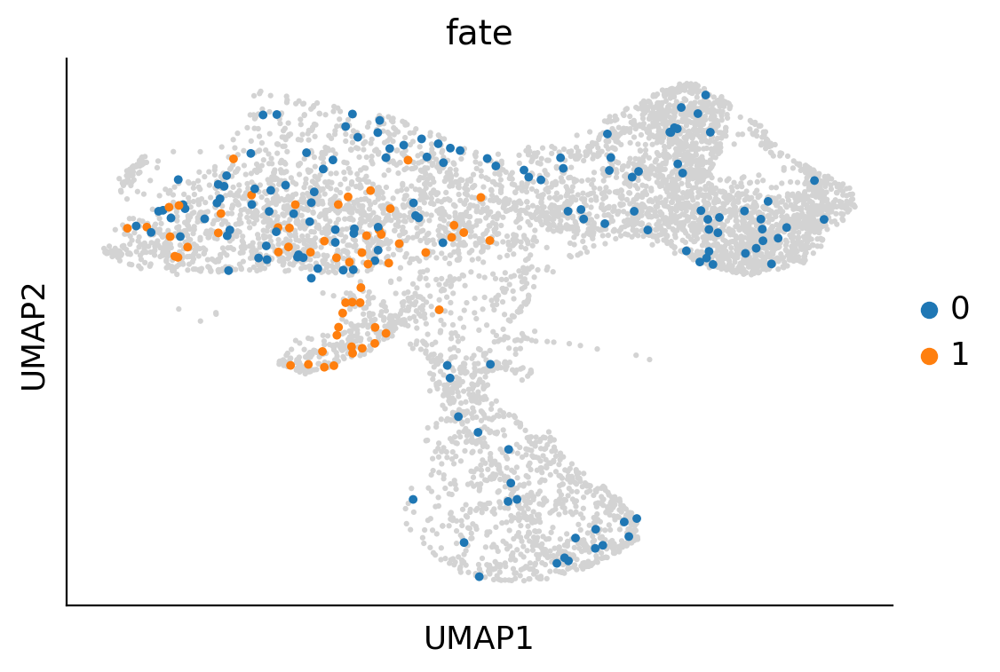

In [817]:
import matplotlib.pyplot as plt
import seaborn as sns

# 绘制整个adata_orig的UMAP背景
sc.pl.umap(adata_orig, s=20, show=False)
plt.gca().set_title('UMAP of all cells')

# 筛选出fate为0或1的细胞
adata_fate_0_or_1 = adata_orig[adata_orig.obs['fate'].isin(['0','1'])]

# 绘制fate为0或1的细胞，叠加在整体UMAP上
sc.pl.umap(adata_fate_0_or_1, color='fate', s=50, ax=plt.gca(), show=False)

# 显示图形
plt.show()


------Compute the full Similarity matrix if necessary------
------Infer transition map between initial time points and the later time one------
--------Current initial time point: t0--------
Step 1: Select time points
--> Clonal cell fraction (day t0-t1): 0.32155731795241527
--> Clonal cell fraction (day t1-t0): 0.25951219512195123
--> Numer of cells that are clonally related -- day t0: 446  and day t1: 1064
Number of multi-time clones post selection: 143


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Cell number=5487, Clone number=143
--> clonal_cell_id_t1: 446
--> Tmap_cell_id_t1: 1387
Step 2: Optimize the transition map recursively
Load pre-computed similarity matrix
--> Load from hard disk--------
--> Compute similarity matrix: load existing data
--> Time elapsed:  0.00816798210144043
--> Time elapsed:  0.04114341735839844
--> Time elapsed:  0.019692659378051758
--> Time elapsed:  0.06539463996887207
--> Compute similarity matrix: load existing data
--> Time elapsed:  0.00664210319519043
--> Time elapsed:  0.041623592376708984
--> Time elapsed:  0.019869565963745117
--> Time elapsed:  0.06673765182495117
--> Compute similarity matrix: load existing data
--> Time elapsed:  0.004523754119873047
--> Time elapsed:  0.02536463737487793
--> Time elapsed:  0.012595415115356445
--> Time elapsed:  0.04546666145324707
Iteration 1, Use smooth_round=10
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time e

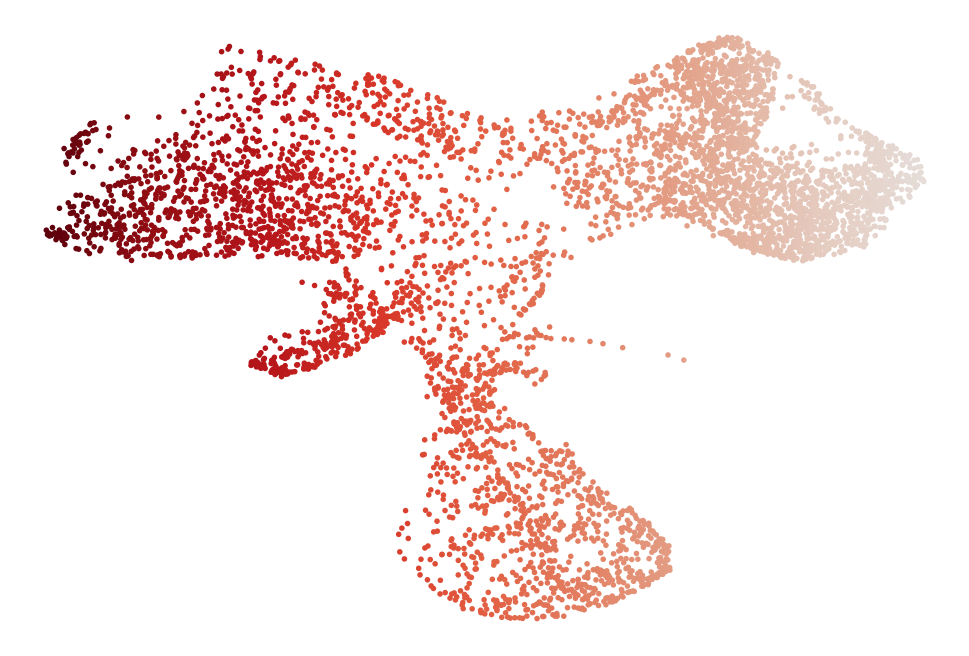

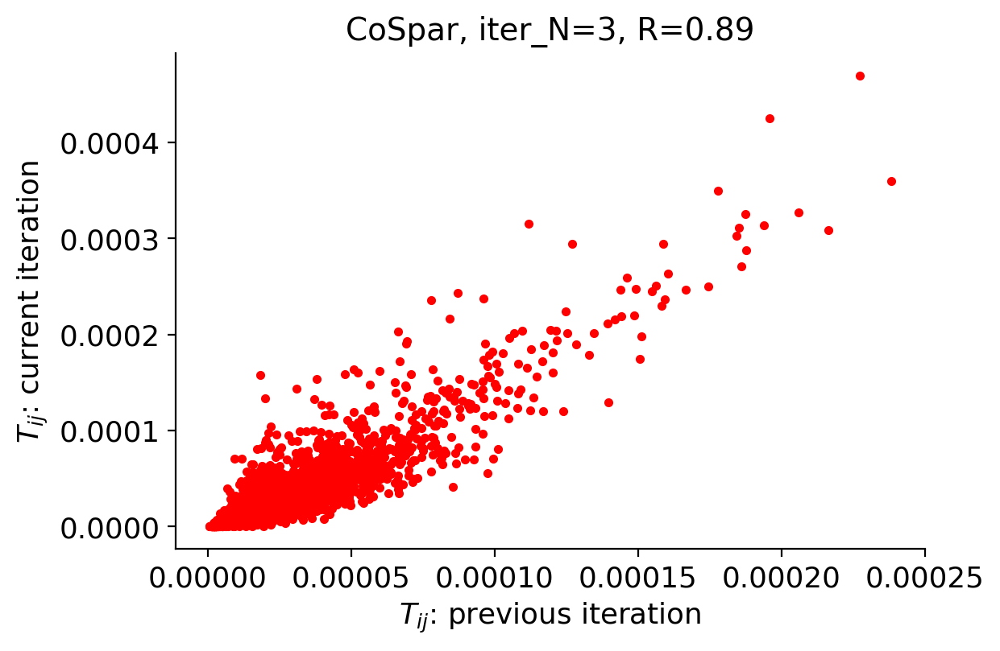

Iteration 4, Use smooth_round=5
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time elapsed --  0.0070858001708984375
--> Phase II: time elapsed --  0.014077425003051758


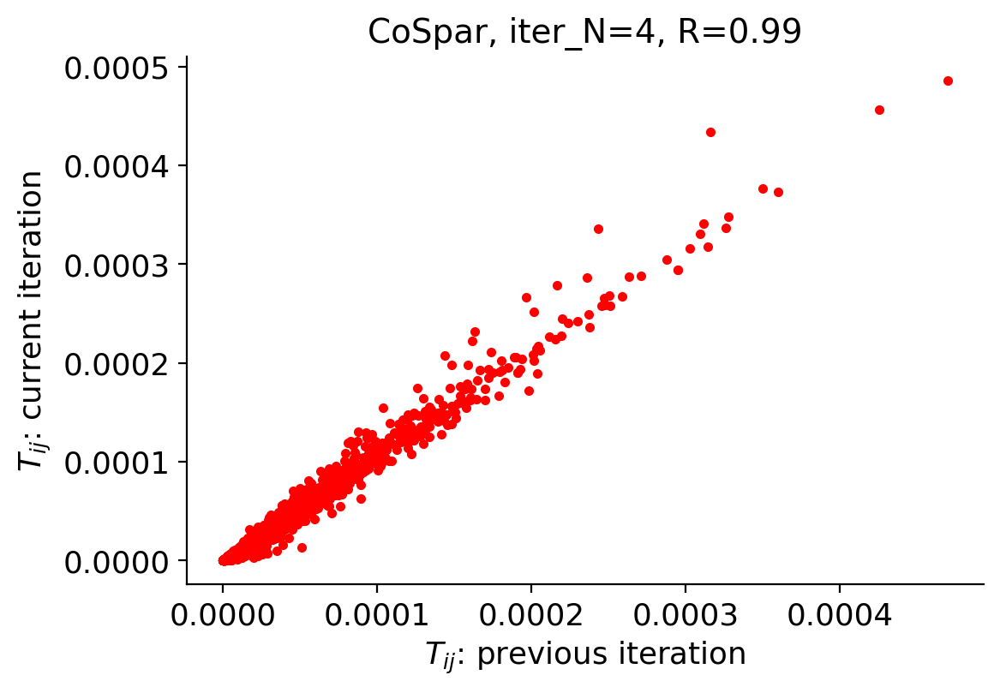

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  0.05958151817321777
--> Phase II: time elapsed --  0.1544644832611084
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
-----------Total used time: 5.106891393661499 s ------------


In [818]:
adata = cs.tmap.infer_Tmap_from_multitime_clones(
    adata_orig,
    clonal_time_points=["t0"],
    later_time_point="t1",
    smooth_array=[10,10,5],
    sparsity_threshold=0.1,
    intraclone_threshold=0.2,
    max_iter_N=10,
    epsilon_converge=0.01,
)

In [820]:
adata.X[0].toarray()

array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        4.8019204]], dtype=float32)

Results saved at adata.obs['fate_map_transition_map_MkP']
Results saved at adata.obs['fate_map_transition_map_Ery']
Results saved at adata.obs['fate_map_transition_map_Neu']
Results saved at adata.obs['fate_map_transition_map_Mon']


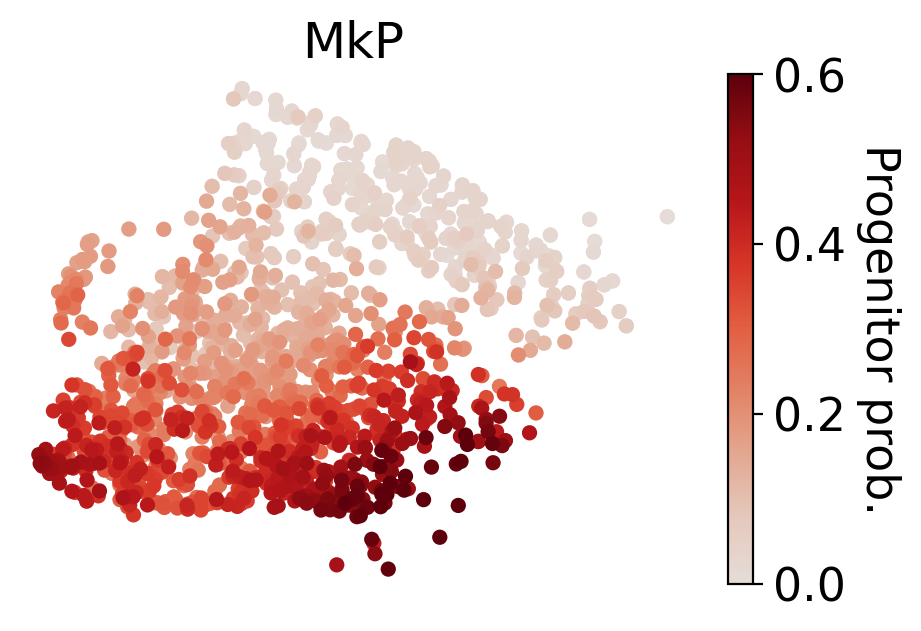

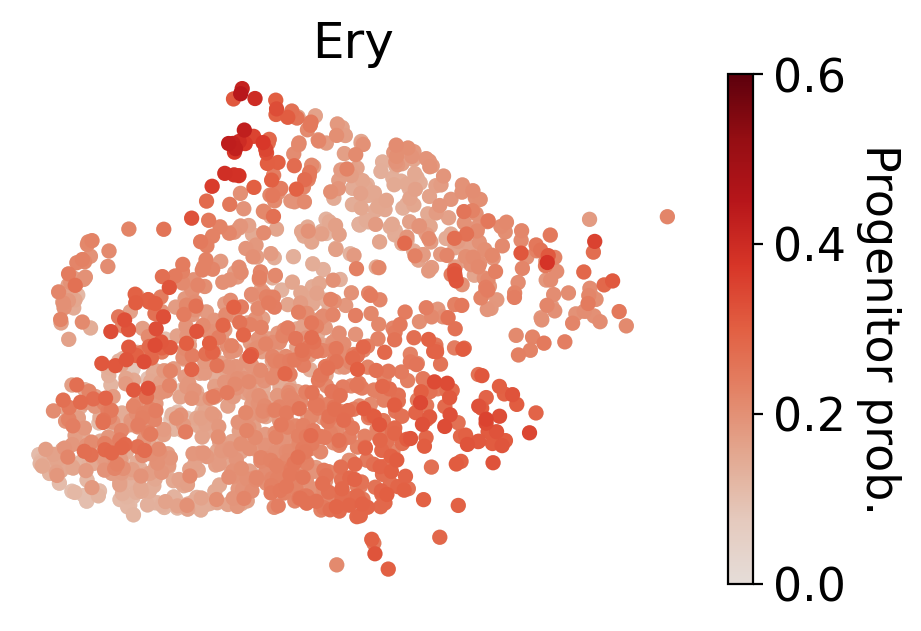

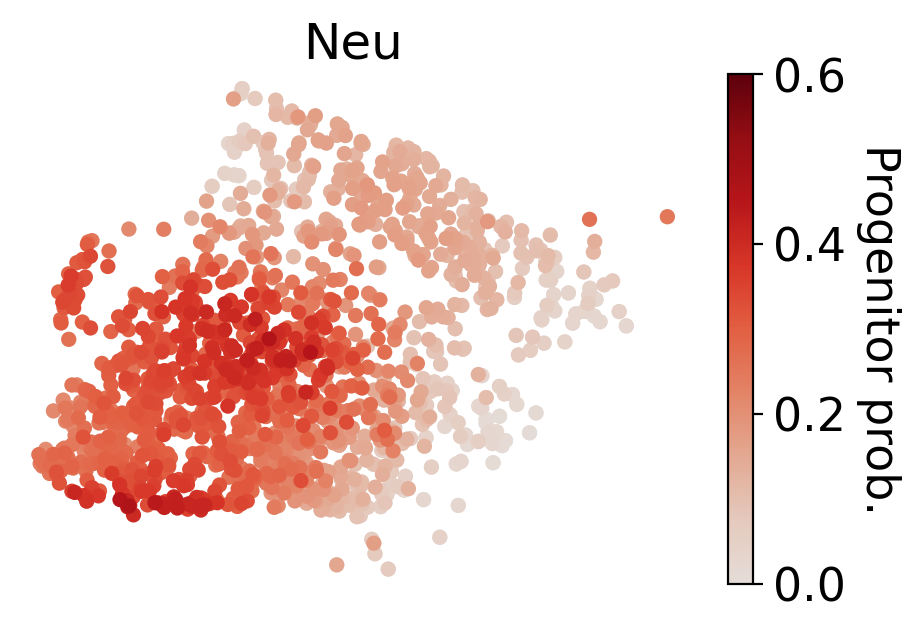

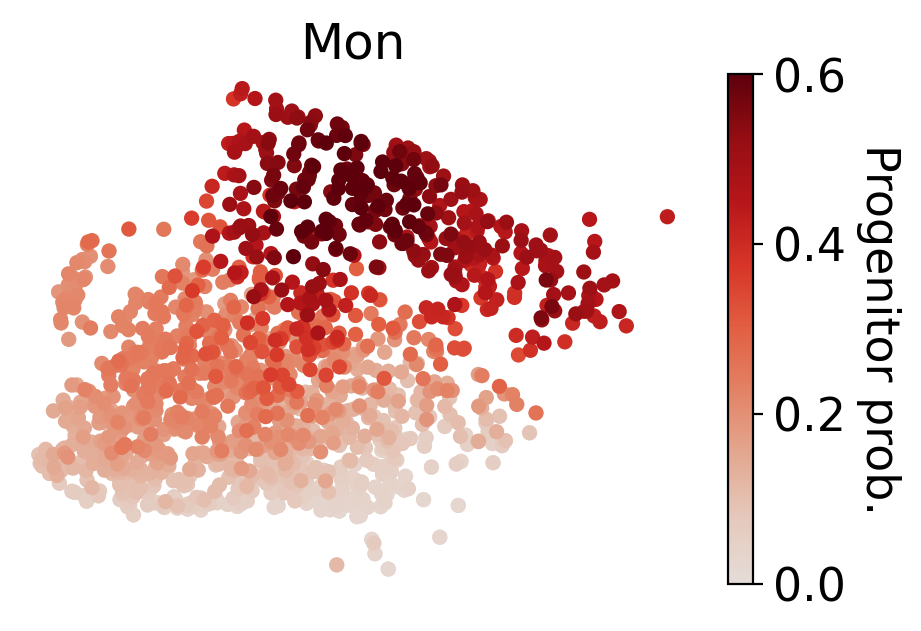

In [36]:
cs.settings.set_figure_params(pointsize=20,fontsize=18)
for selected_fates in [['MkP'],['Ery'],['Neu'],['Mon']]:
    cs.tl.fate_map(
        adata,
        selected_fates=selected_fates,
        source="transition_map",
        map_backward=True,
    )
    cs.pl.fate_map(
        adata,
        selected_fates=selected_fates,
        selected_times='t0',
        source="transition_map",
        plot_target_state=False,
        background=False,
        show_histogram=False,
        auto_color_scale=False,
        vmax=0.6,

    )

In [643]:
adata.obs['Fate_bias']=np.nan
# sel_idx_1=((adata.obs['fate_map_transition_map_MkP']>0.25) & (adata.obsm['X_emb'][:,0]<4))
# adata.obs.loc[sel_idx_1,'Fate_bias']='Early MkP bias'
# sel_idx_2=((adata.obs['fate_map_transition_map_MkP']>0.25) & (adata.obsm['X_emb'][:,0]>=4))
# adata.obs.loc[sel_idx_2,'Fate_bias']='Late MkP bias'
sel_idx_1=((adata.obs['fate_map_transition_map_MkP']>0.25))
adata.obs.loc[sel_idx_1,'Fate_bias']='MkP bias'
sel_idx_3=((adata.obs['fate_map_transition_map_MkP']<=0.25)) & (adata.obs['state_info']=='HSC')
adata.obs.loc[sel_idx_3,'Fate_bias']='No MkP bias'
# sel_idx_4=(adata.obs['state_info']=='LMPP')
# adata.obs.loc[sel_idx_4,'Fate_bias']='LMPP'
adata_sub=adata[adata.obs['time_info']=='t0']

<AxesSubplot: xlabel='x', ylabel='y'>

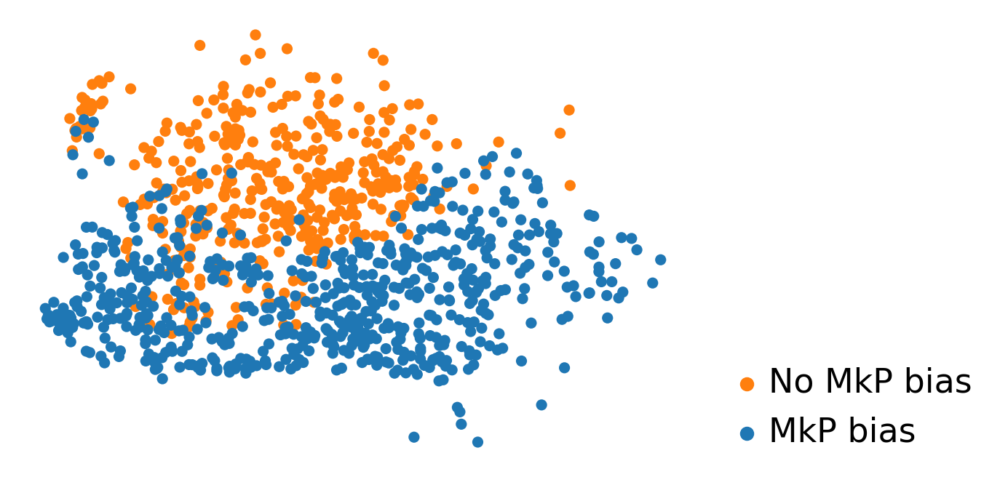

In [644]:
cs.pl.plot_adata_with_prefered_order(adata,'Fate_bias',plot_order=['LMPP','No MkP bias','MkP bias'],
                              palette={'LMPP':'#d9d9d9','No MkP bias':'#ff7f0e','MkP bias':'#1f77b4','Late MkP bias':'grey'},
                              linewidth = 0,s=30)

In [780]:
import pandas as pd
import numpy as np

# 假设 ref_fates 和 adata_orig 已经定义好
adata_orig = adata.copy()
ref_fates = ['MkP', 'Mon', 'Neu', 'Ery', 'Baso']

# 创建一个新的列来存储fate信息
adata_orig.obs['GT'] = np.nan  # 默认值为 NaN

# 设置每个fate的biased信息
for fate_tmp in ref_fates:
    all_fates_tmp = ref_fates.copy()
    all_fates_tmp.remove(fate_tmp)
    
    df_clone_sub = df_clone[df_clone['state_info'].apply(lambda x: (fate_tmp in x) & (('HSC' in x)  or ('LMPP' in x)) & (np.sum([__ in x for __ in all_fates_tmp]) == 0))]
    
    MkP_bias = (adata_orig.obsm['X_clone'][:, df_clone_sub['clone_id'].to_numpy()].sum(1).A.flatten() > 0).astype(int)
    
    adata_orig.obs[f'{fate_tmp}_biased'] = MkP_bias

# 更新fate列的值
adata_orig.obs.loc[adata_orig.obs['MkP_biased'] == 1, 'GT'] = '1'

# 如果有一个为1且不是MkP
adata_orig.obs.loc[(adata_orig.obs[['Mon_biased', 'Neu_biased', 'Ery_biased']].sum(axis=1) > 0) & (adata_orig.obs['MkP_biased'] != 1), 'GT'] = '0'

# 其余的保持为 NaN
adata_orig.obs.loc[(adata_orig.obs[['MkP_biased', 'Mon_biased', 'Neu_biased', 'Ery_biased']].sum(axis=1) == 0), 'GT'] = np.nan

# 删除临时的 biased 列
for fate_tmp in ref_fates:
    del adata_orig.obs[f'{fate_tmp}_biased']

# 检查唯一值
print(adata_orig.obs['GT'].unique())

[nan '1' '0']


In [180]:
adata_orig.obs['GT'].unique()

array([nan, '1', '0'], dtype=object)

In [158]:
#sc.pl.umap(adata_orig, color='GT', s=50, ax=plt.gca(), show=False)
adata_orig

AnnData object with n_obs × n_vars = 5487 × 21114
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old', 'fate', 'fate_map_transition_map_MkP', 'fate_map_transition_map_Ery', 'fate_map_transition_map_Neu', 'fate_map_transition_map_Mon', 'Fate_bias', 'GT'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'cell_type_colors', 'clonal_time_points', 'clone_id', 'data_des', 'library_colors', 'neighbors', 'scrublet', 'time_ordering', 'tissue_colors', 'umap', 'time_info_colors', 'Tmap_cell_id_t1', 'Tmap_cell_id_t2', 'clonal_cell_id_t1', 'clonal_cell_id_t2', 'sp_idx', 'transition_map', 'intraclone_transition_map', 'available_map', 'fate_map_params', 'fate_potency_tmp'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    obsp: 'connectivities', 

In [172]:
adata_orig.obs['index']=range(len(adata_orig))


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<AxesSubplot: title={'center': 'GT'}, xlabel='UMAP1', ylabel='UMAP2'>

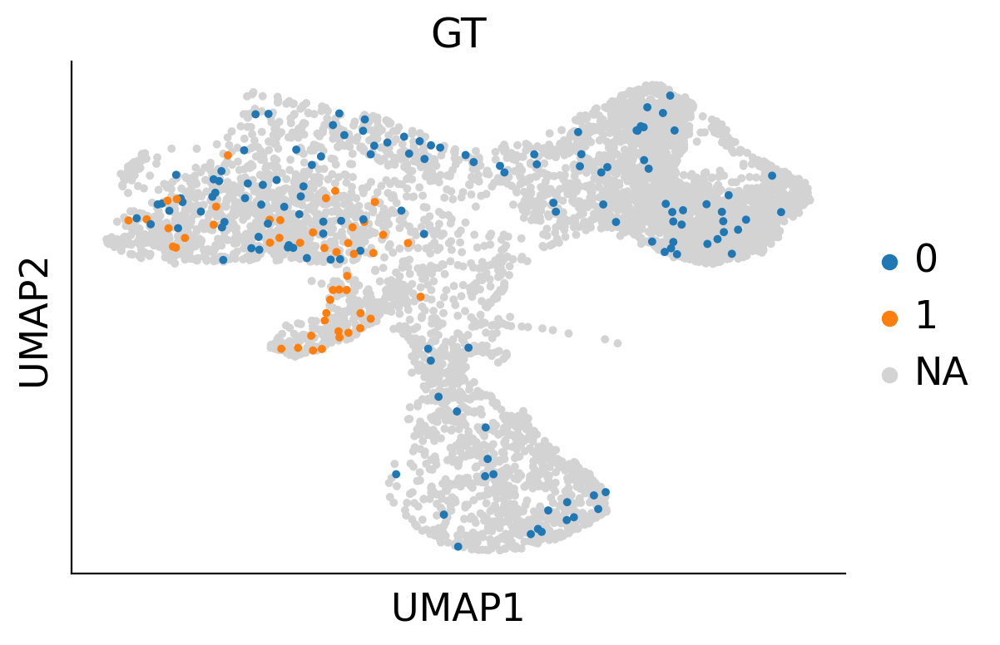

In [182]:
# adata_fate_0_or_1.obs['GT']
GT_colors= {
    '1': '#1f77b4',   # 
    '0': '#2ca02c'  # 绿色橙色
}
adata_orig.obs['GT'].unique()
sc.pl.umap(adata_orig, color='GT', s=50, ax=plt.gca(), show=False)


In [183]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# GT_colors= {
#     'HSC': '#ff7f0e',   # 蓝色
#     'mkp_bias': '#1f77b4',   # 
#     'no mkp_bias': '#2ca02c'  # 绿色橙色
# }
# # 绘制整个adata_orig的UMAP背景
# sc.pl.umap(adata_orig, s=20, show=False)
# plt.gca().set_title('UMAP of all cells')

# # 筛选出fate为0或1的细胞
# adata_fate_0_or_1 = adata_orig[adata_orig.obs['GT'].isin(['0','1'])]
# adata_fate_0_or_1=adata_fate_0_or_1[adata_fate_0_or_1.obs['state_info']=='HSC']
# # 绘制fate为0或1的细胞，叠加在整体UMAP上

# dic1={'0':'no mkp_bias','1':'mkp_bias'}
# #dic1={0:'multilineage',1:'myelo-erythroid restricted'}

# #adata_fate_0_or_1.obs['Fate_bias']=None
# #adata_fate_0_or_1.obs['Fate_bias']=adata_fate_0_or_1.obs['GT'].map(dic1)
# #adata_fate_0_or_1.obs['GT']=adata_fate_0_or_1.obs['Fate_bias']
# sc.pl.umap(adata_fate_0_or_1, color='GT', s=50, ax=plt.gca(), show=False,  palette=GT_colors)
# ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_GT.pdf', bbox_inches='tight') 
# # 显示图形
# plt.show()


In [174]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # 绘制整个adata_orig的UMAP背景
# sc.pl.umap(adata_orig, s=20, color="GT")
# plt.gca().set_title('UMAP of all cells')

# # 筛选出fate为0或1的细胞
# adata_fate_0_or_1 = adata_orig[adata_orig.obs['GT'].isin(['0','1'])]
# adata_fate_0_or_1=adata_fate_0_or_1[adata_fate_0_or_1.obs['state_info']=='HSC']
# # 绘制fate为0或1的细胞，叠加在整体UMAP上

# dic1={'0':'no mkp_bias','1':'mkp_bias',2:None}
# #dic1={0:'multilineage',1:'myelo-erythroid restricted'}

# adata_fate_0_or_1.obs['Fate_bias']=None
# adata_fate_0_or_1.obs['Fate_bias']=adata_fate_0_or_1.obs['GT'].map(dic1)
# adata_fate_0_or_1.obs['GT']=adata_fate_0_or_1.obs['Fate_bias']
# sc.pl.umap(adata_fate_0_or_1, color='GT', s=50, ax=plt.gca(), show=False,  palette=GT_colors)
# ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_GT.pdf', bbox_inches='tight') 
# # 显示图形
# plt.show()


In [219]:
adata_orig.obs

,library,batch,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,...,tissue,state_info_old,fate,fate_map_transition_map_MkP,fate_map_transition_map_Ery,fate_map_transition_map_Neu,fate_map_transition_map_Mon,Fate_bias,GT,index
LL837_skull_AAACCCAAGAGTCACG,LL837_skull,1,2182,10000.000000,2182,8330.0,566.0,6.794718,0.043403,0,...,Skull,Mon,2,NaN,NaN,NaN,NaN,NaN,NaN,0
LL837_skull_AAACCCAAGTGAACAT,LL837_skull,1,2247,10000.000000,2247,10328.0,128.0,1.239349,0.048237,0,...,Skull,Ery,2,NaN,NaN,NaN,NaN,NaN,NaN,1
LL837_skull_AAACCCACATCCGTTC,LL837_skull,1,4151,9999.999023,4150,29156.0,420.0,1.440527,0.012388,0,...,Skull,Mon,2,NaN,NaN,NaN,NaN,NaN,NaN,2
LL837_skull_AAACCCAGTCCACATA,LL837_skull,1,1515,10000.000000,1515,6034.0,146.0,2.419622,0.146524,0,...,Skull,Meg,2,NaN,NaN,NaN,NaN,NaN,NaN,3
LL837_skull_AAACCCAGTGAACGGT,LL837_skull,1,1782,10000.000000,1782,6942.0,108.0,1.555748,0.022658,0,...,Skull,Meg,2,NaN,NaN,NaN,NaN,NaN,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LL837_skull_TTTGGTTTCATGCCCT,LL837_skull,1,4073,9999.999023,4073,29120.0,474.0,1.627747,0.019994,0,...,Skull,Ery,2,NaN,NaN,NaN,NaN,NaN,NaN,5482
LL837_skull_TTTGGTTTCGACGTCG,LL837_skull,1,3697,10000.000977,3697,26760.0,632.0,2.361734,0.016280,0,...,Skull,Neu,2,NaN,NaN,NaN,NaN,NaN,NaN,5483
LL837_skull_TTTGTTGAGCGTTACT,LL837_skull,1,1476,10000.000000,1476,6594.0,286.0,4.337276,0.079240,0,...,Skull,LMPP,2,0.074549,0.185234,0.142106,0.400063,NaN,NaN,5484
LL837_skull_TTTGTTGAGTGATCGG,LL837_skull,1,3283,9999.999023,3283,21940.0,274.0,1.248861,0.023810,0,...,Skull,Neu,2,NaN,NaN,NaN,NaN,NaN,NaN,5485


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


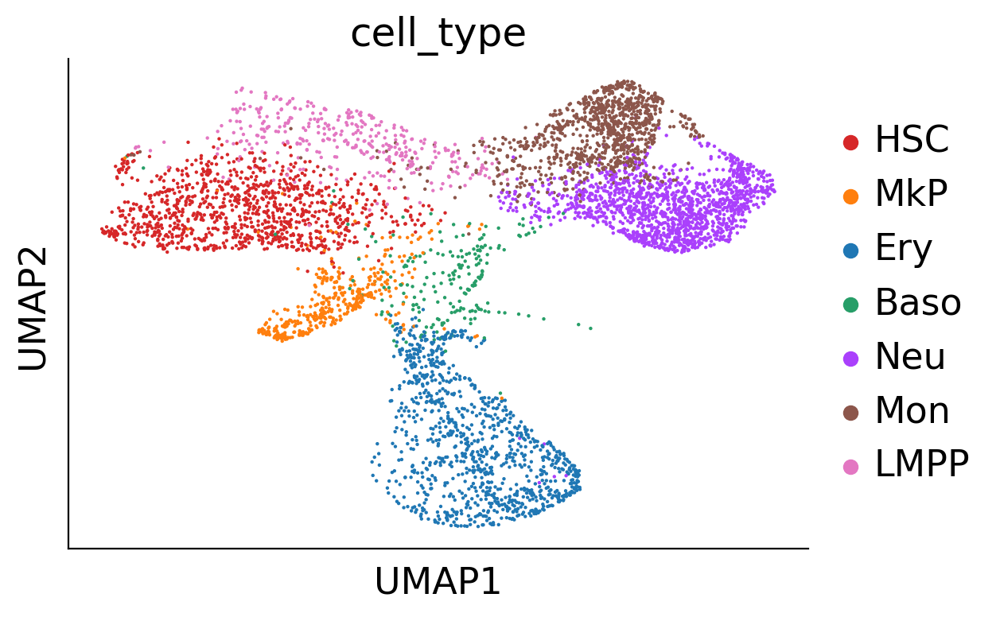

In [175]:
sc.pl.umap(adata_orig, color='cell_type', s=10)


In [1100]:
adata_orig.obs['time_info']

LL837_skull_AAACCCAAGAGTCACG    t1
LL837_skull_AAACCCAAGTGAACAT    t1
LL837_skull_AAACCCACATCCGTTC    t1
LL837_skull_AAACCCAGTCCACATA    t1
LL837_skull_AAACCCAGTGAACGGT    t1
                                ..
LL837_skull_TTTGGTTTCATGCCCT    t1
LL837_skull_TTTGGTTTCGACGTCG    t1
LL837_skull_TTTGTTGAGCGTTACT    t0
LL837_skull_TTTGTTGAGTGATCGG    t1
LL837_skull_TTTGTTGGTTACAGCT    t0
Name: time_info, Length: 5487, dtype: category
Categories (2, object): ['t0', 't1']

KeyError: 0

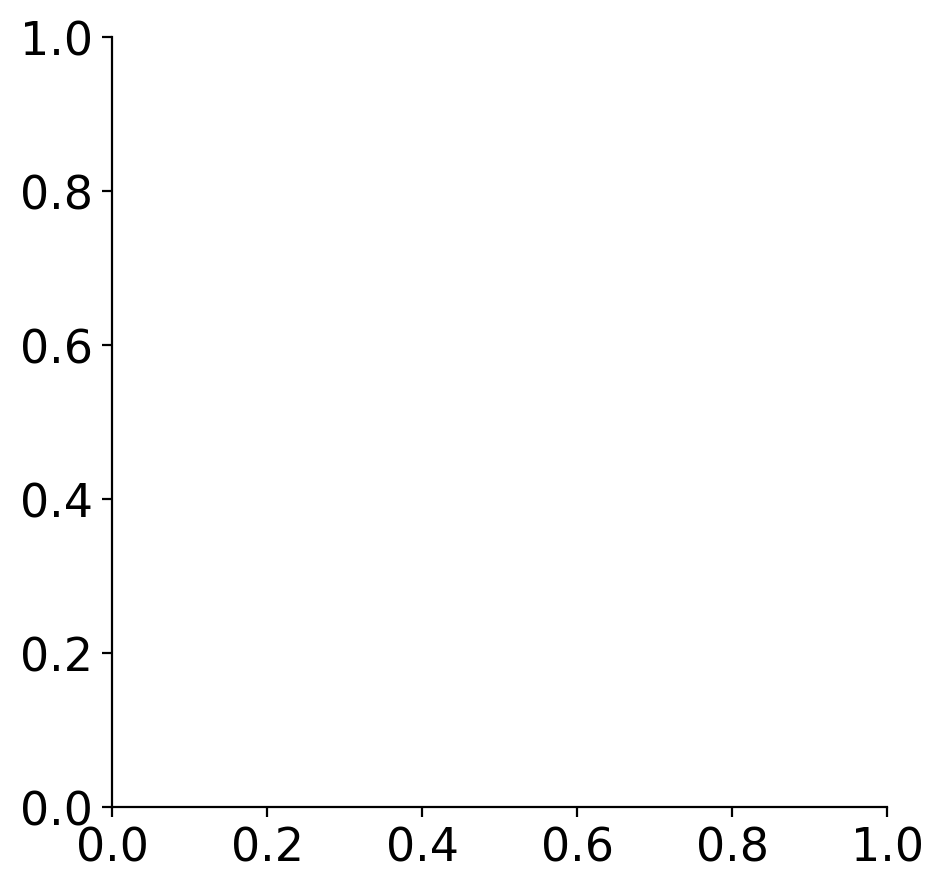

In [220]:
# 映射 'GT' 列
#adata_orig.obs['GT'] = adata_orig.obs['GT'].map(dic1)

# 将不等于 'HSC' 的 'cell_type' 对应的 'GT' 列设为 None
adata_orig.obs.loc[adata_orig.obs['cell_type'] != 'HSC', 'GT'] = None

# 将不等于 't0' 的 'time_info' 对应的 'GT' 列设为 None
adata_orig.obs.loc[adata_orig.obs['time_info'] != 't0', 'GT'] = None

# 绘制 UMAP
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)
sc.pl.umap(adata_orig, color='GT', s=100, ax=ax,palette=GT_colors)


In [1124]:
ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_GT.pdf', bbox_inches='tight') 


In [186]:
import sklearn
sklearn.metrics.silhouette_score(
    adata_orig[adata_orig.obs['GT'].isin(['no mkp_bias', 'mkp_bias'])].obsm["X_umap"],
    adata_orig[adata_orig.obs['GT'].isin(['no mkp_bias', 'mkp_bias'])].obs['GT']
)

In [1073]:
adata_orig

AnnData object with n_obs × n_vars = 5487 × 21114
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old', 'fate', 'fate_map_transition_map_MkP', 'fate_map_transition_map_Ery', 'fate_map_transition_map_Neu', 'fate_map_transition_map_Mon', 'Fate_bias', 'GT', 'index'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'cell_type_colors', 'clonal_time_points', 'clone_id', 'data_des', 'library_colors', 'neighbors', 'scrublet', 'time_ordering', 'tissue_colors', 'umap', 'Tmap_cell_id_t1', 'Tmap_cell_id_t2', 'clonal_cell_id_t1', 'clonal_cell_id_t2', 'sp_idx', 'transition_map', 'intraclone_transition_map', 'available_map', 'fate_map_params', 'fate_potency_tmp'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<AxesSubplot: title={'center': 'cell_type'}, xlabel='UMAP1', ylabel='UMAP2'>

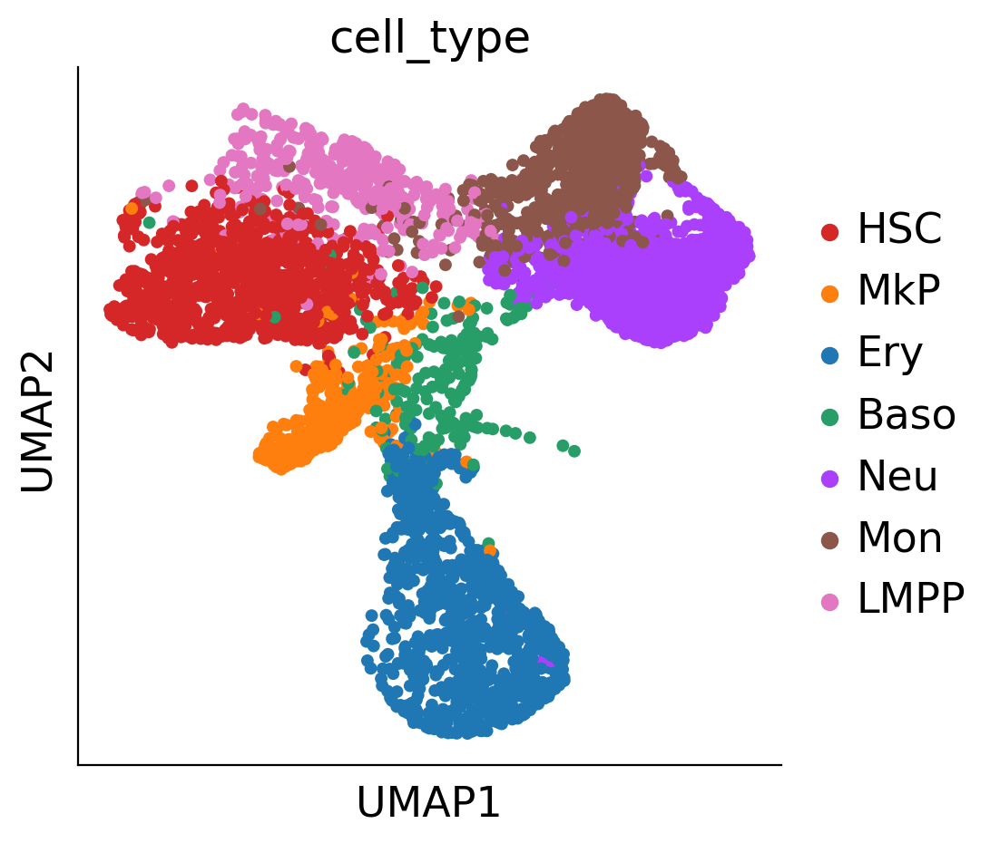

In [221]:
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)

# 绘制UMAP图
sc.pl.umap(adata_orig, color='cell_type', s=100, show=False, ax=ax)
#ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_prd.pdf', bbox_inches='tight') 



In [1128]:
adata_orig.obs['cell_type']

LL837_skull_AAACCCAAGAGTCACG     Mon
LL837_skull_AAACCCAAGTGAACAT     Ery
LL837_skull_AAACCCACATCCGTTC     Mon
LL837_skull_AAACCCAGTCCACATA     MkP
LL837_skull_AAACCCAGTGAACGGT     MkP
                                ... 
LL837_skull_TTTGGTTTCATGCCCT     Ery
LL837_skull_TTTGGTTTCGACGTCG     Neu
LL837_skull_TTTGTTGAGCGTTACT    LMPP
LL837_skull_TTTGTTGAGTGATCGG     Neu
LL837_skull_TTTGTTGGTTACAGCT    LMPP
Name: cell_type, Length: 5487, dtype: category
Categories (7, object): ['HSC' < 'MkP' < 'Ery' < 'Baso' < 'Neu' < 'Mon' < 'LMPP']

KeyError: 'mkp_bias'

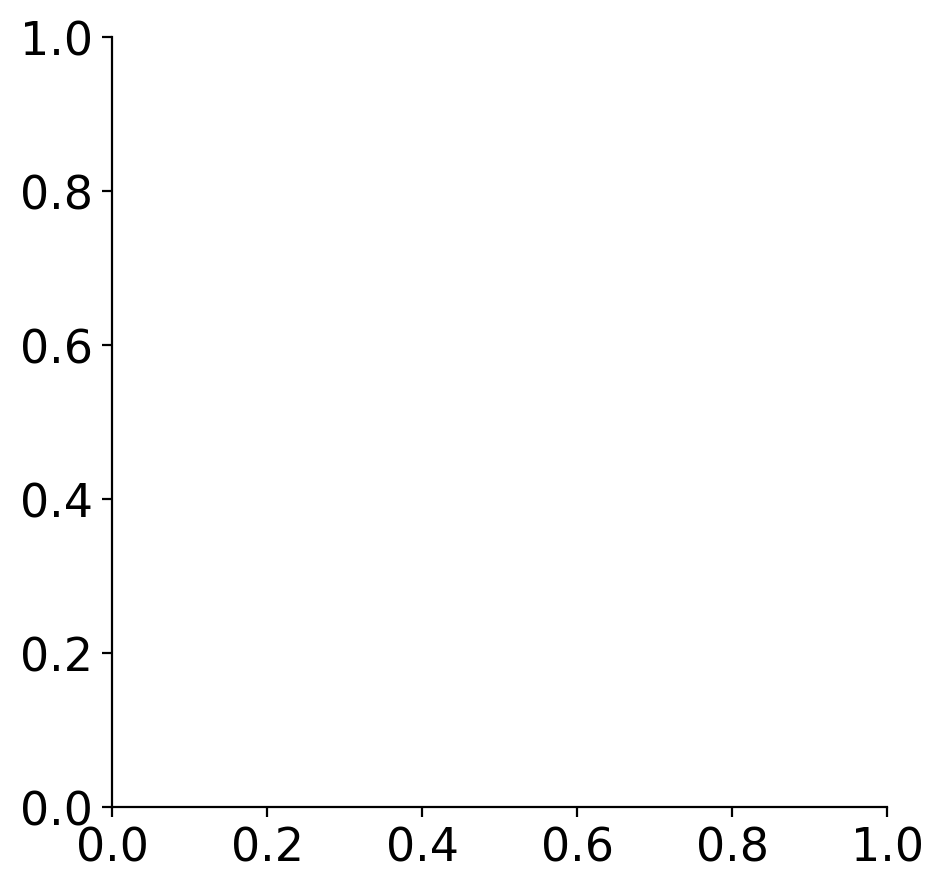

In [222]:
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)

# 绘制UMAP图
sc.pl.umap(adata3, color='GT', s=100, show=False, ax=ax, palette=GT_colors)
#ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_prd.pdf', bbox_inches='tight') 



/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


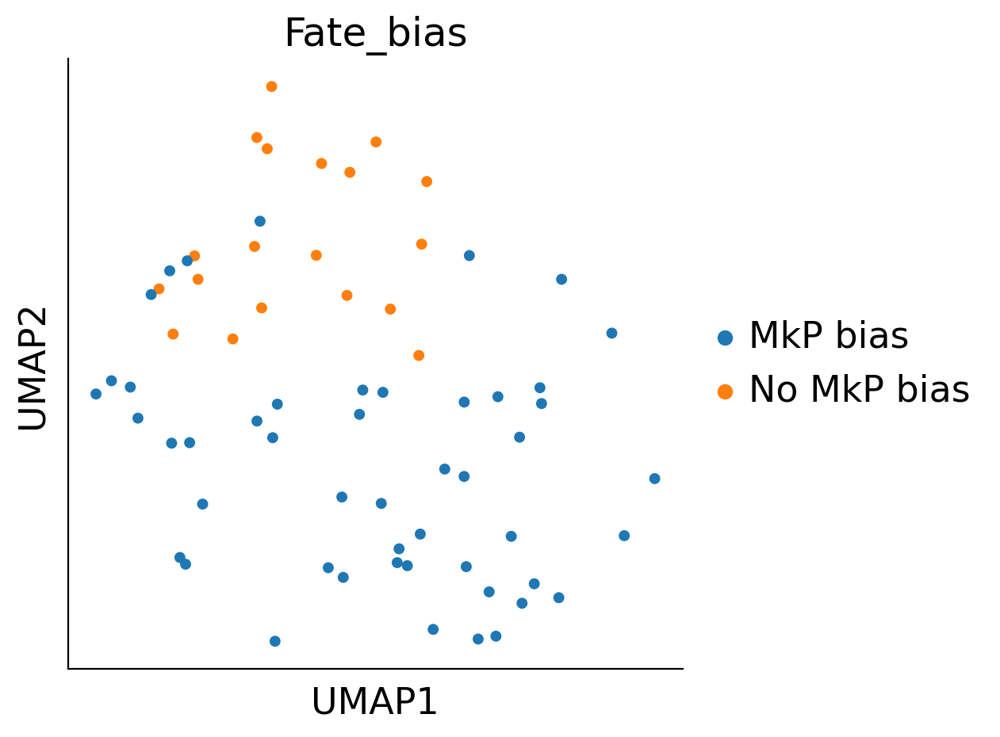

In [187]:
fig,ax=createFig()
fig.set_size_inches(5,5)

sc.pl.umap(adata_fate_0_or_1, color='Fate_bias', s=100,ax=ax,)
ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_cospar.pdf', bbox_inches='tight') 


In [196]:
adata_orig[(adata_orig.obs['GT'].isin(['0','1']))].obs


,library,batch,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,...,state_info_old,fate,fate_map_transition_map_MkP,fate_map_transition_map_Ery,fate_map_transition_map_Neu,fate_map_transition_map_Mon,Fate_bias,GT,Fate_binary,clone
13,LL837_skull,1,2411,10000.000000,2411,10746.0,218.0,2.028662,0.053785,0,...,HSC,1,0.219269,0.158679,0.367359,0.216678,No MkP bias,1,0,988
90,LL837_skull,1,2774,10000.000000,2774,12630.0,222.0,1.757720,0.063830,0,...,HSC,1,0.488377,0.248923,0.097766,0.118884,MkP bias,1,1,805
112,LL837_skull,1,2341,10000.000000,2341,9946.0,192.0,1.930424,0.046968,0,...,HSC,0,0.128018,0.192091,0.386379,0.256319,No MkP bias,0,0,635
138,LL837_skull,1,2176,9999.999023,2176,9826.0,188.0,1.913291,0.052323,0,...,HSC,0,0.539199,0.286691,0.107701,0.036490,MkP bias,0,1,8
264,LL837_skull,1,2155,10000.000000,2155,8708.0,198.0,2.273771,0.038168,0,...,HSC,1,0.360206,0.175236,0.265452,0.174175,MkP bias,1,1,444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5256,LL837_skull,1,1697,10000.000000,1697,7322.0,124.0,1.693526,0.081879,0,...,HSC,0,0.348092,0.132318,0.414731,0.042925,MkP bias,0,1,251
5279,LL837_skull,1,1293,10000.000977,1293,4532.0,130.0,2.868491,0.090645,0,...,HSC,1,0.395193,0.151719,0.306524,0.107999,MkP bias,1,1,777
5357,LL837_skull,1,1799,10000.000000,1799,6732.0,130.0,1.931075,0.028299,0,...,HSC,0,0.426256,0.188785,0.268747,0.079448,MkP bias,0,1,170
5398,LL837_skull,1,1944,10000.000000,1944,7712.0,140.0,1.815353,0.053785,0,...,HSC,0,0.159331,0.248843,0.387131,0.148377,No MkP bias,0,0,272


In [723]:
adata_orig[(adata_orig.obs['GT'] != '2') & (~adata_orig.obs['Fate_bias'].isin(['MkP bias', 'No MkP bias']))].obs


,library,batch,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,...,time_info,tissue,state_info_old,fate,fate_map_transition_map_MkP,fate_map_transition_map_Ery,fate_map_transition_map_Neu,fate_map_transition_map_Mon,Fate_bias,GT
LL837_skull_AAAGGATCACGTTGGC,LL837_skull,1,4425,10000.000000,4425,42134.0,766.0,1.818009,0.011020,0,...,t1,Skull,Ery,0,NaN,NaN,NaN,NaN,NaN,0
LL837_skull_AACCTGACATGGATCT,LL837_skull,1,3366,10000.000000,3366,18584.0,396.0,2.130865,0.060215,0,...,t1,Skull,Mon,0,NaN,NaN,NaN,NaN,NaN,0
LL837_skull_AAGTGAATCAGTGTCA,LL837_skull,1,3013,10000.000977,3013,16668.0,542.0,3.251740,0.061986,0,...,t1,Skull,Meg,1,NaN,NaN,NaN,NaN,NaN,1
LL837_skull_ACAAAGAAGAGGCGTT,LL837_skull,1,3105,9999.999023,3105,16682.0,290.0,1.738401,0.035385,0,...,t1,Skull,Meg,1,NaN,NaN,NaN,NaN,NaN,1
LL837_skull_ACACGCGTCAACCTTT,LL837_skull,1,3517,9999.999023,3517,21620.0,308.0,1.424607,0.040166,0,...,t0,Skull,LMPP,0,0.035840,0.210532,0.120582,0.455573,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LL837_skull_TTCTTCCTCATTTCCA,LL837_skull,1,4472,9999.999023,4471,26352.0,434.0,1.646934,0.018529,0,...,t0,Skull,LMPP,1,0.198727,0.231416,0.222007,0.262037,NaN,1
LL837_skull_TTGCTGCAGTGCCAGA,LL837_skull,1,4291,9999.999023,4290,23722.0,282.0,1.188770,0.019495,0,...,t1,Skull,Meg,1,NaN,NaN,NaN,NaN,NaN,1
LL837_skull_TTGGATGAGATGACAT,LL837_skull,1,4844,10000.000000,4844,48688.0,816.0,1.675978,0.005157,0,...,t1,Skull,Ery,0,NaN,NaN,NaN,NaN,NaN,0
LL837_skull_TTTACGTAGAAGGATG,LL837_skull,1,5299,10000.000000,5298,38142.0,1538.0,4.032300,0.010055,0,...,t1,Skull,Ery,0,NaN,NaN,NaN,NaN,NaN,0


In [190]:
import numpy as np
from sklearn.metrics import accuracy_score
from scipy.stats import pearsonr

# 将 Fate_bias 转换为二进制格式
adata_orig.obs['Fate_binary'] = adata_orig.obs['Fate_bias'].map({'MkP bias': 1, 'No MkP bias': 0})

# 删除包含 NaN 值的行，并只保留 GT 不为 2 的行
filtered_data = adata_orig.obs[['Fate_binary', 'GT']].dropna()
filtered_data = filtered_data[filtered_data['GT'] != '2']

# 获取 Fate_binary 和 GT 列
fate_binary = filtered_data['Fate_binary'].astype(int)
gt = filtered_data['GT'].astype(int)

# 计算准确率
accuracy = accuracy_score(gt, fate_binary)
print(f'Accuracy: {accuracy}')

# 计算皮尔森相关系数
pearson_corr, _ = pearsonr(gt, fate_binary)
print(f'Pearson Correlation: {pearson_corr}')


Accuracy: 0.6176470588235294
Pearson Correlation: 0.40683221630902433


In [782]:
import numpy as np

# 获取 X_clone 矩阵
X_clone = adata_orig.obsm['X_clone']

# 确保 X_clone 是一个稀疏矩阵
if isinstance(X_clone, np.ndarray):
    X_clone = ssp.csr_matrix(X_clone)

# 为每个细胞分配克隆值
# 假设每个细胞属于一个克隆，这里取 X_clone 的非零列索引作为克隆值
clones = X_clone.argmax(axis=1).A.flatten()

# 将克隆值赋给 obs 中的 clone 属性
adata_orig.obs['clone'] = clones

# 打印前几行查看结果
print(adata_orig.obs[['clone']].head())


   clone
0      0
1      0
2      0
3      0
4      0


In [783]:
import pandas as pd
adata_orig.obs['GT']=adata_orig.obs['GT'].astype(str)
# 给 adata_orig 按照数字顺序设置索引
adata_orig.obs = adata_orig.obs.reset_index(drop=True)
adata_orig.obs.index = range(len(adata_orig.obs))


# 筛选 GT 为 '0' 或 '1' 的细胞
selected_cells = adata_orig.obs[adata_orig.obs['GT'].isin(['0', '1'])]

# 初始化结果列表
results = []

# 遍历每个克隆
for clone in selected_cells['clone'].unique():
    clone_cells = adata_orig.obs[adata_orig.obs['clone'] == clone]
    
    # 找到 state_info 为 HSC 且时间点为 t0 的细胞
    from_cells = clone_cells[(clone_cells['state_info'] == 'HSC') & (clone_cells['time_info'] == 't0')]
    
    # 找到其他类型细胞且时间点为 t1 的细胞
    to_cells = clone_cells[(clone_cells['time_info'] == 't1') & (clone_cells['state_info'] != 'HSC')]
    
    # 记录 from_index, to_index, from_cell_type, to_cell_type
    for from_idx in from_cells.index:
        for to_idx in to_cells.index:
            results.append({
                'from_index': from_idx,
                'to_index': to_idx,
                'from_cell_type': adata_orig.obs.at[from_idx, 'state_info'],
                'to_cell_type': adata_orig.obs.at[to_idx, 'state_info'],
                'clone':clone,
            })

# 创建 DataFrame
df = pd.DataFrame(results)

# 显示结果
print(df.head())


   from_index  to_index from_cell_type to_cell_type  clone
0          13      5344            HSC          MkP    988
1        3445        23            HSC          Ery    307
2        3445      1600            HSC          Ery    307
3        3445      3757            HSC          Ery    307
4          90       278            HSC          MkP    805


In [785]:
df['clone'].unique().shape

(47,)

In [418]:

dflist_index = [df2 for _, df2 in df.groupby(['clone'])]
np.random.shuffle(dflist_index)
len(dflist_index)*0.7
dflist_index1=dflist_index[:33]  #36  
dflist_index2=dflist_index[33:]
dflist_index1=pd.concat(dflist_index1)
dflist_index2=pd.concat(dflist_index2)
print(len(dflist_index1))
print(len(dflist_index2))

60
24


/tmp/ipykernel_67646/1345040238.py:1: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  dflist_index = [df2 for _, df2 in df.groupby(['clone'])]


In [419]:

dic_clone={}
for i in df.values:
    clone=i[-1]
    dic_clone[clone]=[]
for i in df.values:
    clone=i[-1]
    dic_clone[clone].append(i[1])

In [372]:
dic={'Neu':0, 'Ery':0, 'MkP':1, 'Mon':0 , 'Baso':0}
traincell1=[]
traincell2=[]
train_rel=[]
testcell1=[]
testcell2=[] 
test_rel=[]
for j in range(1):
    cell1=dflist_index1.values.T[0]
    cell2=dflist_index1.values.T[1]
    deep=dflist_index1.values.T[3]
    traincell1+=list(cell1)
    traincell2+=list(cell2)
    for i in deep:
        train_rel.append(dic[i])
    cell1=dflist_index2.values.T[0]
    cell2=dflist_index2.values.T[1]
    deep=dflist_index2.values.T[3]
    testcell1+=list(cell1)
    testcell2+=list(cell2)
    for i in deep:
        test_rel.append(dic[i])

In [603]:
# dic={'Neu':0, 'Ery':0, 'MkP':1, 'Mon':0}
# traincell1=[]
# traincell2=[]
# train_rel=[]
# testcell1=[]
# testcell2=[] 
# test_rel=[]
# for j in range(100):
#     cell1=dflist_index1.values.T[0]
#     cell2=dflist_index1.values.T[1]
#     deep=dflist_index1.values.T[3]
#     traincell1+=list(cell1)
#     traincell2+=list(cell2)
#     for i in deep:
#         train_rel.append(dic[i])
#     cell1=dflist_index2.values.T[0]
#     cell2=dflist_index2.values.T[1]
#     deep=dflist_index2.values.T[3]
#     testcell1+=list(cell1)
#     testcell2+=list(cell2)
#     for i in deep:
#         test_rel.append(dic[i])

import numpy as np

dic = {'Neu': 0, 'Ery': 0, 'MkP': 1, 'Mon': 0}
traincell1 = []
traincell2 = []
train_rel = []
testcell1 = []
testcell2 = []
test_rel = []

for j in range(100):
    cell1 = dflist_index1.values.T[0]
    cell2 = dflist_index1.values.T[1]
    deep = dflist_index1.values.T[3]
    traincell1 += list(cell1)
    traincell2 += list(cell2)
    for i in deep:
        train_rel.append(dic[i])
    cell1 = dflist_index2.values.T[0]
    cell2 = dflist_index2.values.T[1]
    deep = dflist_index2.values.T[3]
    testcell1 += list(cell1)
    testcell2 += list(cell2)
    for i in deep:
        test_rel.append(dic[i])

# 将训练集的样本转换为 numpy 数组
traincell1 = np.array(traincell1)
traincell2 = np.array(traincell2)
train_rel = np.array(train_rel)

# 找到所有标签为1的样本的索引
indices_of_ones = np.where(train_rel == 1)[0]

# 重采样4倍
resampled_traincell1 = np.concatenate([traincell1] + [traincell1[indices_of_ones]] *1)
resampled_traincell2 = np.concatenate([traincell2] + [traincell2[indices_of_ones]] * 1)
resampled_train_rel = np.concatenate([train_rel] + [train_rel[indices_of_ones]] * 1)

# 转换回列表形式
traincell1 = resampled_traincell1.tolist()
traincell2 = resampled_traincell2.tolist()
train_rel = resampled_train_rel.tolist()



In [604]:
##No relation的生成
num=50
from_index=list(set(traincell1))
for i in range(len(set(from_index))):
    print(i)
    a=[]
    a.append(from_index[i])
    cell1=np.random.choice(a,num,replace=True)
    cell1=list(cell1)
    cell1_clone=df[df['from_index']==from_index[i]]['clone'].values[0]
    cell2_choice=set(df['to_index'].unique())-set(dic_clone[cell1_clone])
    cell2=np.random.choice(list(set(cell2_choice)),num,replace=False)
    cell2=list(cell2)
    rel=np.random.choice([2],num,replace=True)
    rel=list(rel)
    traincell1+=cell1
    traincell2+=cell2
    train_rel+=rel

num=50
from_index=list(set(testcell1))
for i in range(len(set(from_index))):
    print(i)
    a=[]
    a.append(from_index[i])
    cell1=np.random.choice(a,num,replace=True)    
    cell1=list(cell1)
    cell1_clone=df[df['from_index']==from_index[i]]['clone'].values[0]
    cell2_choice=set(df['to_index'].unique())-set(dic_clone[cell1_clone])

    cell2=np.random.choice(list(set(cell2_choice)),num,replace=False)
    cell2=list(cell2)
    rel=np.random.choice([2],num,replace=True)
    rel=list(rel)

    testcell1+=cell1
    testcell2+=cell2
    test_rel+=rel


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [605]:
dic_train={}
dic_test={}
for i in train_rel:  
    dic_train[i] = dic_train.get(i, 0) + 1
print(dic_train)
for i in test_rel:  
    dic_test[i] = dic_test.get(i, 0) + 1
print(dic_test)

{0: 3500, 1: 5000, 2: 2400}
{0: 1700, 1: 700, 2: 1000}


In [452]:
traincell1=np.loadtxt('/home/zhengtuo/songtao/3traincell1.txt')
traincell2=np.loadtxt('/home/zhengtuo/songtao/3traincell2.txt')
testcell1=np.loadtxt('/home/zhengtuo/songtao/3testcell1.txt')
testcell2=np.loadtxt('/home/zhengtuo/songtao/3testcell2.txt')
train_rel=np.loadtxt('/home/zhengtuo/songtao/3trainrel.txt',dtype=int)
test_rel=np.loadtxt('/home/zhengtuo/songtao/3testrel.txt',dtype=int)

In [606]:
np.savetxt('/home/zhengtuo/songtao/3traincell1.txt',traincell1)
np.savetxt('/home/zhengtuo/songtao/3traincell2.txt',traincell2)
np.savetxt('/home/zhengtuo/songtao/3testcell1.txt',testcell1)
np.savetxt('/home/zhengtuo/songtao/3testcell2.txt',testcell2)
np.savetxt('/home/zhengtuo/songtao/3trainrel.txt',train_rel,fmt='%d')
np.savetxt('/home/zhengtuo/songtao/3testrel.txt',test_rel,fmt='%d')


In [347]:
adata_orig=cs.hf.read("/home/zhengtuo/songtao/DestinyNet/darlin_6.24_processed.h5ad")
adata_orig

AnnData object with n_obs × n_vars = 5487 × 21114
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old', 'fate', 'fate_map_transition_map_MkP', 'fate_map_transition_map_Ery', 'fate_map_transition_map_Neu', 'fate_map_transition_map_Mon', 'Fate_bias', 'GT', 'index'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'GT_colors', 'Tmap_cell_id_t1', 'Tmap_cell_id_t2', 'available_map', 'cell_type_colors', 'clonal_cell_id_t1', 'clonal_cell_id_t2', 'clonal_time_points', 'clone_id', 'data_des', 'fate_map_params', 'fate_potency_tmp', 'intraclone_transition_map', 'library_colors', 'neighbors', 'scrublet', 'sp_idx', 'time_info_colors', 'time_ordering', 'tissue_colors', 'transition_map', 'umap'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    ob

In [102]:
sc.write('/home/zhengtuo/songtao/DestinyNet/darlin_6.24_processed.h5ad',adata_orig)
adata_orig.obs

,library,batch,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,...,tissue,state_info_old,fate,fate_map_transition_map_MkP,fate_map_transition_map_Ery,fate_map_transition_map_Neu,fate_map_transition_map_Mon,Fate_bias,GT,index
LL837_skull_AAACCCAAGAGTCACG,LL837_skull,1,2182,10000.000000,2182,8330.0,566.0,6.794718,0.043403,0,...,Skull,Mon,2,NaN,NaN,NaN,NaN,NaN,NaN,0
LL837_skull_AAACCCAAGTGAACAT,LL837_skull,1,2247,10000.000000,2247,10328.0,128.0,1.239349,0.048237,0,...,Skull,Ery,2,NaN,NaN,NaN,NaN,NaN,NaN,1
LL837_skull_AAACCCACATCCGTTC,LL837_skull,1,4151,9999.999023,4150,29156.0,420.0,1.440527,0.012388,0,...,Skull,Mon,2,NaN,NaN,NaN,NaN,NaN,NaN,2
LL837_skull_AAACCCAGTCCACATA,LL837_skull,1,1515,10000.000000,1515,6034.0,146.0,2.419622,0.146524,0,...,Skull,Meg,2,NaN,NaN,NaN,NaN,NaN,NaN,3
LL837_skull_AAACCCAGTGAACGGT,LL837_skull,1,1782,10000.000000,1782,6942.0,108.0,1.555748,0.022658,0,...,Skull,Meg,2,NaN,NaN,NaN,NaN,NaN,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LL837_skull_TTTGGTTTCATGCCCT,LL837_skull,1,4073,9999.999023,4073,29120.0,474.0,1.627747,0.019994,0,...,Skull,Ery,2,NaN,NaN,NaN,NaN,NaN,NaN,5482
LL837_skull_TTTGGTTTCGACGTCG,LL837_skull,1,3697,10000.000977,3697,26760.0,632.0,2.361734,0.016280,0,...,Skull,Neu,2,NaN,NaN,NaN,NaN,NaN,NaN,5483
LL837_skull_TTTGTTGAGCGTTACT,LL837_skull,1,1476,10000.000000,1476,6594.0,286.0,4.337276,0.079240,0,...,Skull,LMPP,2,0.074549,0.185234,0.142106,0.400063,NaN,NaN,5484
LL837_skull_TTTGTTGAGTGATCGG,LL837_skull,1,3283,9999.999023,3283,21940.0,274.0,1.248861,0.023810,0,...,Skull,Neu,2,NaN,NaN,NaN,NaN,NaN,NaN,5485


In [200]:
all_cell=list(set(list(df['from_index'])+list(df['to_index'])))
all_cell=np.array(all_cell).astype(int)


In [202]:
len(all_cell)

128

In [947]:
adata_orig.obs['index']=range(adata_orig.shape[0])


In [348]:
#adata3=adata_orig[adata_orig.obs['index'].isin(all_cell)]
adata3=adata_orig#{'Neu': 0, 'Ery': 0, 'MkP': 1, 'Mon': 0}
adata3

AnnData object with n_obs × n_vars = 5487 × 21114
    obs: 'library', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'cell_type', 'state_info', 'time_info', 'tissue', 'state_info_old', 'fate', 'fate_map_transition_map_MkP', 'fate_map_transition_map_Ery', 'fate_map_transition_map_Neu', 'fate_map_transition_map_Mon', 'Fate_bias', 'GT', 'index'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'GT_colors', 'Tmap_cell_id_t1', 'Tmap_cell_id_t2', 'available_map', 'cell_type_colors', 'clonal_cell_id_t1', 'clonal_cell_id_t2', 'clonal_time_points', 'clone_id', 'data_des', 'fate_map_params', 'fate_potency_tmp', 'intraclone_transition_map', 'library_colors', 'neighbors', 'scrublet', 'sp_idx', 'time_info_colors', 'time_ordering', 'tissue_colors', 'transition_map', 'umap'
    obsm: 'X_clone', 'X_emb', 'X_pca', 'X_umap'
    ob

In [747]:
adata3=adata_orig[adata_orig.obs['state_info'].isin(['Neu','Ery','MkP','Mon',"HSC"])].copy()
adata3.obs

,library,batch,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,cell_type,state_info,time_info,tissue,state_info_old
LL837_LF_AAACCCATCTTCGGTC,LL837_LF,0,1146,10000.001953,1146,3210.0,16.0,0.498442,0.038168,0,HSC,HSC,HSC,LF,HSC
LL837_LF_AAACGAAGTTGTGCCG,LL837_LF,0,3678,10000.000000,3677,19478.0,336.0,1.725023,0.039152,0,HSC,HSC,HSC,LF,HSC
LL837_LF_AAACGAATCGAGATAA,LL837_LF,0,6453,10000.000000,6453,60940.0,1362.0,2.234985,0.015856,0,HSC,HSC,HSC,LF,HSC
LL837_LF_AAACGCTTCCATATGG,LL837_LF,0,4972,10000.000000,4972,33454.0,700.0,2.092425,0.028299,0,HSC,HSC,HSC,LF,HSC
LL837_LF_AAACGCTTCGGAATGG,LL837_LF,0,5806,10000.000000,5805,46320.0,1076.0,2.322971,0.036286,0,HSC,HSC,HSC,LF,HSC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LL837_spleen_TTTGGAGTCGAACACT,LL837_spleen,2,3637,10000.000000,3637,20822.0,250.0,1.200653,0.032829,0,Ery,Ery,Ery,Spleen,Ery
LL837_spleen_TTTGGTTCACGATAGG,LL837_spleen,2,3173,9999.999023,3173,15726.0,190.0,1.208190,0.013109,0,Ery,Ery,Ery,Spleen,Ery
LL837_spleen_TTTGGTTCAGCAGTCC,LL837_spleen,2,6974,10000.000977,6974,106512.0,3098.0,2.908592,0.015034,0,Ery,Ery,Ery,Spleen,Ery
LL837_spleen_TTTGTTGCACCCATAA,LL837_spleen,2,3348,9999.999023,3348,17774.0,280.0,1.575335,0.034509,0,Ery,Ery,Ery,Spleen,Ery


                           clone_N  clone_fraction
state_info                                        
Baso                            38        0.018260
Baso,Dc                          1        0.000481
Baso,Ery                         9        0.004325
Baso,Ery,Neu                     2        0.000961
Baso,Ery,Neu,Meg,LMPP,Mon        1        0.000481
...                            ...             ...
nan,LMPP,Mon                     5        0.002403
nan,LMPP,Mon,Neu                 1        0.000481
nan,Mon                          6        0.002883
nan,Mon,Neu                      3        0.001442
nan,Neu                          5        0.002403

[215 rows x 2 columns]
-----------
            cell_N  clonal_cell_fraction
state_info                              
Baso           163              0.028254
Dc             202              0.035015
Ery            992              0.171954
HSC           1419              0.245970
LMPP           683              0.118391
Lym           

2081

In [607]:
from math import sqrt

import torch
import torch.nn as nn
num_relations=3
len_geneExp=21114
len_embedding=256
learning_rate=0.0001
num_epoch=10
batchsize=512
class SELayer(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SELayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool1d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.LeakyReLU(inplace=False),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _ = x.size()
        #print('channel:',c)
        #print('size:',x.shape)
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1)
        #print('y_size:',y.shape)
        return x * y.expand_as(x)
class MutiheadAttention(nn.Module):
    def __init__(self, input_dim, dim_k, dim_v,num_heads):
        super(MutiheadAttention, self).__init__()
        self.dim_q = dim_k # 一般默认 Q=K
        self.dim_k = dim_k
        self.dim_v = dim_v
        self.num_units=dim_k
        self.num_heads=num_heads
        #定义线性变换函数
        self.linear_q = nn.Linear(input_dim, dim_k, bias=False)
        self.linear_k = nn.Linear(input_dim, dim_k, bias=False)
        self.linear_v = nn.Linear(input_dim, dim_v, bias=False)
        self._norm_fact = 1 / sqrt(dim_k)

    def forward(self, x):
        # x: batch_size, seq_len, input_dim
        q = self.linear_q(x)  # batch_size, seq_len, dim_k
        k = self.linear_k(x)  # batch_size, seq_len, dim_k
        v = self.linear_v(x)  # batch_size, seq_len, dim_v
        split_size = self.num_units // self.num_heads
        q = torch.stack(torch.split(q, split_size, dim=2), dim=0)  # [h, N, T_q, num_units/h]
        k = torch.stack(torch.split(k, split_size, dim=2), dim=0)  # [h, N, T_k, num_units/h]
        v = torch.stack(torch.split(v, split_size, dim=2), dim=0)  # [h, N, T_k, num_units/h]

        scores = torch.matmul(q, k.transpose(2, 3))
        scores = scores / (self.dim_k ** 0.5)
        
        scores = F.softmax(scores, dim=3)
        ## out = score * V
        out = torch.matmul(scores, v)  # [h, N, T_q, num_units/h]
        out = torch.cat(torch.split(out, 1, dim=0), dim=3).squeeze(0) 

        return out

class ResidualBlock(torch.nn.Module):
    def __init__(self,channels):
        super(ResidualBlock,self).__init__()
        self.channels = channels
        
        self.conv1 = nn.Conv1d(channels,channels,kernel_size=3,padding=1)
        self.conv2 = nn.Conv1d(channels,channels,kernel_size=3,padding=1)
        self.se=SELayer(channels,16)
    def forward(self, x):
        y = F.relu(self.conv1(x))
        y = self.conv2(y)
        y=self.se(y)
        return F.relu(x+y)

class model(nn.Module):
    def __init__(self):
        nn.Module.__init__(self)
        self.att=MutiheadAttention(len_embedding*2,512,512,64)
        self.layernorm=nn.LayerNorm(512)
        self.conv1 = nn.Conv1d(1, 32, 4)  # 输入通道数为1，输出通道数为6
        self.relu1=nn.LeakyReLU(0.2, inplace=True)
        self.rblock1 = ResidualBlock(32)
        self.conv2 = nn.Conv1d(32,64, 4)  # 输入通道数为6，输出通道数为16
        self.batchn1=nn.BatchNorm1d(64)
        self.relu2= nn.LeakyReLU(0.2, inplace=True)
        self.rblock2 = ResidualBlock(64)
        self.conv3=nn.Conv1d(64,128,4)
        self.batchn2=nn.BatchNorm1d(128)
        self.relu3= nn.LeakyReLU(0.2, inplace=True)
        self.rblock3 = ResidualBlock(128)
        self.conv4=nn.Conv1d(128,256,4)
        self.batchn3=nn.BatchNorm1d(256)
        self.relu4= nn.LeakyReLU(0.2, inplace=True)
        self.rblock4 = ResidualBlock(256)
        self.dropout=nn.Dropout()
        self.fc1 = nn.Linear(7424, num_relations)
        
    def forward(self, x):
        # 输入x -> conv1 -> relu -> 2x2窗口的最大池化
        x=self.att(x)+x
        x=self.layernorm(x)
        x = self.conv1(x)
        x = self.relu1(x)
        x = F.max_pool1d(x, 2)
        x=self.rblock1(x)
        # # 输入x -> conv2 -> relu -> 2x2窗口的最大池化
        x = self.conv2(x)
        x=self.batchn1(x)
        x=self.relu2(x)
        x = F.max_pool1d(x, 2)
        x=self.rblock2(x)
        
        x = self.conv3(x)
        x=self.batchn2(x)
        x=self.relu3(x)
        x = F.max_pool1d(x, 2)
        x=self.rblock3(x)
        
        x = self.conv4(x)
        x=self.batchn3(x)
        x=self.relu4(x)
        x = F.max_pool1d(x, 2)
        x=self.rblock4(x)
        # # view函数将张量x变形成一维向量形式，总特征数不变，为全连接层做准备
        x = x.view(x.size()[0], -1)
        x=self.dropout(x)
        x=self.fc1(x)
        return x
geneEnc=nn.Sequential(
    nn.Dropout(),
    nn.Linear(len_geneExp, 100),
    nn.ReLU(),
            nn.Linear(100, 100),
            nn.ReLU(),
     nn.Linear(100, 100),
            nn.ReLU(),
    nn.Linear(100, 100),
            nn.ReLU(),
    nn.Linear(100, len_embedding),
)
geneDec = nn.Sequential(
    nn.Linear(len_embedding, len_geneExp),
    #nn.Linear(512, len_geneExp),

)
genemap = nn.Sequential(
    #nn.Dropout(),
     nn.Linear(len_embedding, 100),
     nn.BatchNorm1d(100),
    nn.ReLU(),
    nn.Linear(100, 100),
   nn.BatchNorm1d(100),
    nn.ReLU(),
    nn.Linear(100, 100),
   nn.BatchNorm1d(100),
    nn.ReLU(),
    nn.Linear(100, 100),
    nn.BatchNorm1d(100),
    nn.ReLU(),
    nn.Linear(100, len_embedding),

)


model=model()
device = torch.device("cuda:5")
device2 = torch.device("cuda:5")
path='/home/zhengtuo/songtao/darlin1.pth'
pretrained_weights = torch.load(path,'cuda:5')
model.load_state_dict(pretrained_weights['model'])
geneEnc.load_state_dict(pretrained_weights['geneEnc'])
genemap.load_state_dict(pretrained_weights['genemap'])
geneDec.load_state_dict(pretrained_weights['geneDec'])

model.to(device2)
geneEnc.to(device2)
geneDec.to(device2)
genemap.to(device2)


genemap.eval()
model.eval()
geneEnc.eval()
geneDec.eval()


Sequential(
  (0): Linear(in_features=256, out_features=21114, bias=True)
)

In [488]:
adata3.obsm['X_pca']=adata3.obsm['X_pca'].cpu().numpy()


AttributeError: 'numpy.ndarray' object has no attribute 'cpu'

In [608]:

Embeddings_path = '/home/zhengtuo/songtao/dynamic2.txt.npz' # txt dir to save cell embeddings
from tqdm import trange
geneEnc.to(device2)
all_embeddings = []
with torch.no_grad():
    for i in trange(adata3.shape[0]):
        x = 1*adata3.X[i].toarray()
        geneExp = torch.tensor(x).to(device2)
        geneExp=torch.reshape(geneExp,(1,21114))
        geneExp = geneExp.to(torch.float32)
        geneEmbedding = geneEnc(geneExp)
        geneEmbedding = geneEmbedding.cpu().detach().numpy() # or any other data type
        all_embeddings.append(geneEmbedding)
    np.savez(Embeddings_path,all_embeddings)
mapembedding = []
with torch.no_grad():
    for i in trange(adata3.shape[0]):
        x = 1*adata3.X[i].toarray()
        geneExp = torch.tensor(x).to(device2)
        geneExp = geneExp.to(torch.float32)
        geneEmbedding = geneEnc(geneExp)
        geneEmbedding=genemap(geneEmbedding)
        geneEmbedding = geneEmbedding.cpu().detach().numpy() # or any other data type
        mapembedding.append(geneEmbedding)
all_embeddings=np.array(all_embeddings)
mapembedding=np.array(mapembedding)
adata3.obsm['geneEnc']=all_embeddings
adata3.obsm['genemap']=mapembedding
#adata2.obsm['X_pca']=adata2.obsm['X_pca'].cpu().numpy()

        
    
    

100%|█████████████████████████████████████████████████████████████████| 4919/4919 [00:04<00:00, 1105.89it/s]


In [566]:
adata3 = adata3.copy()
dic1 = {'0': 'no mkp_bias', '1': 'mkp_bias'}
adata3.obs['GT'] = adata3.obs['GT'].astype(str).map(dic1)

In [353]:
#adata3.obs.loc[adata3.obs['state_info'] != 'HSC', 'GT'] = None
adata3.obs['state_info']

LL837_skull_AAACCCAAGAGTCACG     Mon
LL837_skull_AAACCCAAGTGAACAT     Ery
LL837_skull_AAACCCACATCCGTTC     Mon
LL837_skull_AAACCCAGTCCACATA     MkP
LL837_skull_AAACCCAGTGAACGGT     MkP
                                ... 
LL837_skull_TTTGGTTTCATGCCCT     Ery
LL837_skull_TTTGGTTTCGACGTCG     Neu
LL837_skull_TTTGTTGAGCGTTACT    LMPP
LL837_skull_TTTGTTGAGTGATCGG     Neu
LL837_skull_TTTGTTGGTTACAGCT    LMPP
Name: state_info, Length: 5487, dtype: category
Categories (7, object): ['Baso', 'Ery', 'HSC', 'LMPP', 'MkP', 'Mon', 'Neu']

In [511]:
adata3.obs['GT'].unique()

array([nan], dtype=object)

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


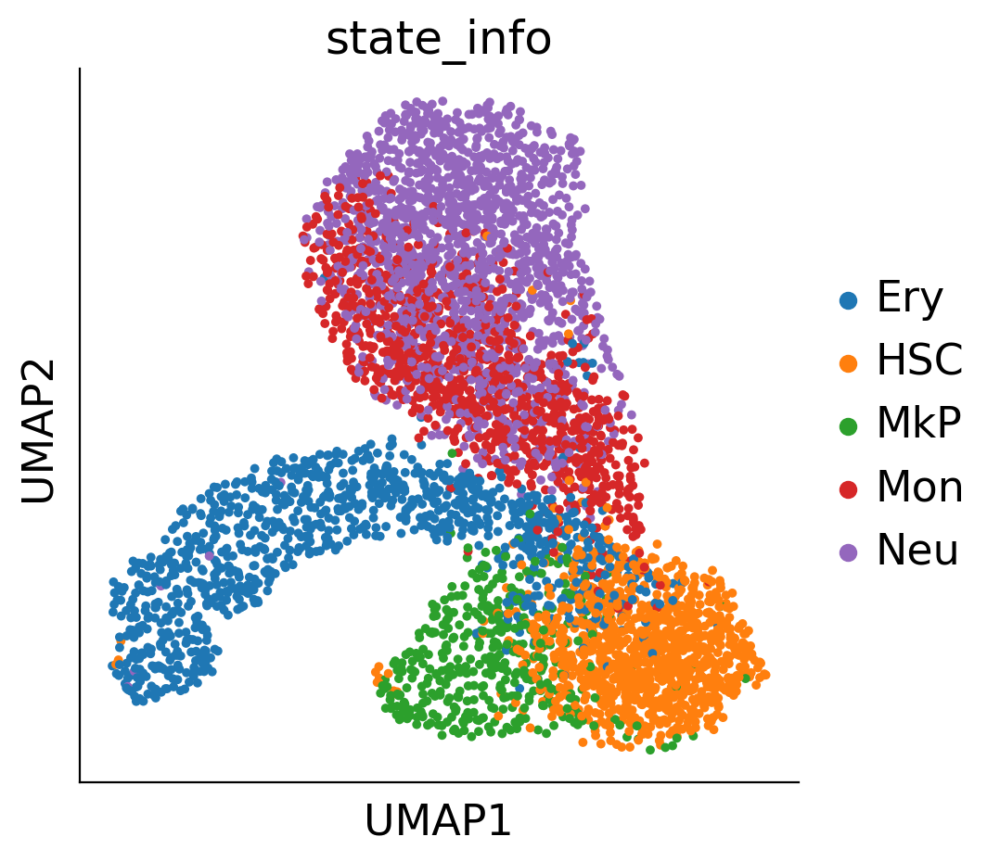

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


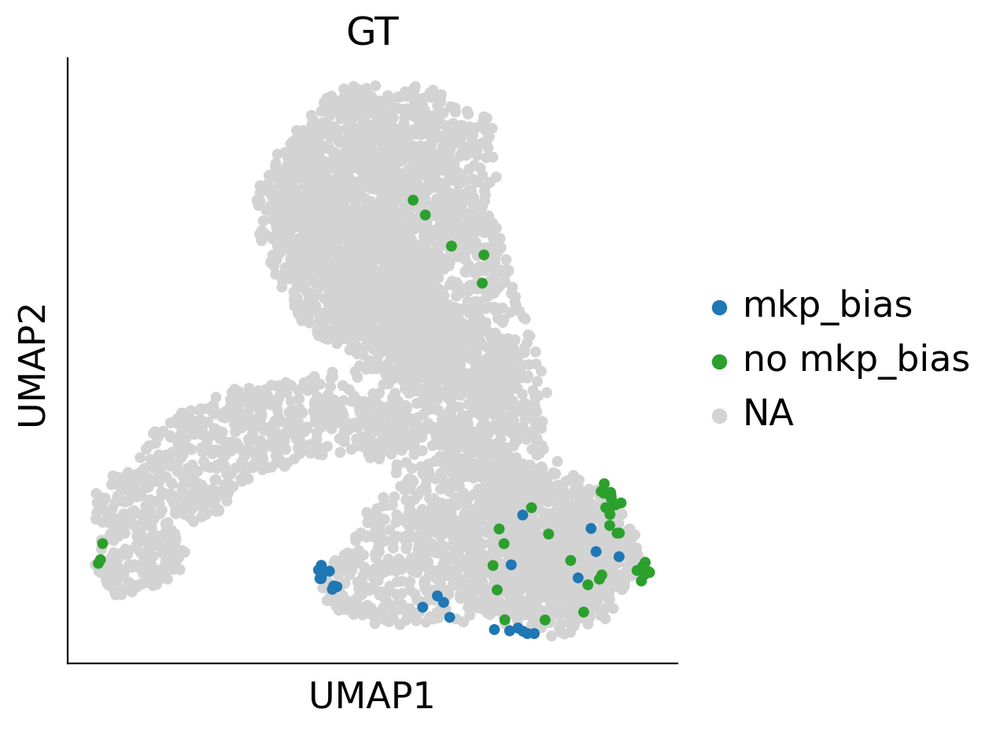

In [609]:
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt

# 创建figure
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)

# 加载数据
n = np.load('/home/zhengtuo/songtao/dynamic2.txt.npz')
n = torch.tensor(n['arr_0'])
n = torch.reshape(n, (4919, 256))
adata3.obsm["X_pca"] = n

# 进行UMAP嵌入
cs.pp.get_X_emb(adata3, n_neighbors=20, umap_min_dist=1)

# 将 'Mon', 'Neu', 'Ery' 定义为 'Non-MkP'
#adata3.obs['state_info'] = adata3.obs['state_info'].replace({'Mon': 'Non-MkP', 'Neu': 'Non-MkP', 'Ery': 'Non-MkP'})

# 定义颜色映射
state_colors = {
    'HSC': '#E6DCD9',   # 蓝色 
    'MkP': '#1f77b4',   # 
    'Non-MkP': '#2ca02c'  # 绿色橙色
}

# 绘制UMAP图
sc.pl.umap(adata3, s=50, color="state_info", ax=ax)

# 将X_pca数据转换为numpy数组
adata3.obsm['X_pca'] = adata3.obsm['X_pca'].cpu().numpy()
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)
# 绘制仅包含'GT'为'0'或'1'的UMAP图
GT_colors= {
    'HSC': '#ff7f0e',   # 蓝色
    'mkp_bias': '#1f77b4',   # 
    'no mkp_bias': '#2ca02c'  # 绿色橙色
}

sc.pl.umap(adata3, color="GT", s=100,ax=ax,palette=GT_colors)
ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_GT_score0.25.pdf', bbox_inches='tight') 


In [ ]:
sc.pl.umap(adata3, s=20, color="state_info")


In [975]:
import sklearn
sklearn.metrics.silhouette_score(
    adata3[adata3.obs['GT'].isin(['mkp_bias','no mkp_bias'])].obsm["X_umap"],
    adata3[adata3.obs['GT'].isin(['mkp_bias','no mkp_bias'])].obs['GT']
)

0.25367096

In [386]:
adata_orig.obs['index']=adata_orig.obs['index'].astype(int)

In [387]:
adata_orig[adata_orig.obs['state_info']=='HSC'].obs['index'].unique()
adata_orig[adata_orig.obs['time_info']=='t1'].obs['state_info'].unique()


['Mon', 'Ery', 'MkP', 'Neu', 'Baso']
Categories (5, object): ['Baso', 'Ery', 'MkP', 'Mon', 'Neu']

array(['nan', '1', '0'], dtype=object)

In [610]:
dic_true={}
for i in range((adata_orig.shape[0])):
    if(adata_orig.obs['GT'][i]=='1'):
        dic_true[adata_orig.obs['index'][i]]=1
    elif(adata_orig.obs['GT'][i]=='0'):
        dic_true[adata_orig.obs['index'][i]]=0
    else:
        dic_true[adata_orig.obs['index'][i]]=2
#all_cell1=list(set(list(traincell1)+list(testcell1)))
#all_cell2=list(set(list(traincell2)+list(testcell2)))
all_cell1=adata_orig[adata_orig.obs['state_info']=='HSC'].obs['index'].unique()
all_cell2=adata_orig[adata_orig.obs['time_info']=='t1'].obs['index'].unique()
all_cell2=list(set(list(traincell2)+list(testcell2)))
from torch.utils.data import Dataset, DataLoader
class UndiffDataset(Dataset):
    # 构造器初始化方法
    def __init__(self,length):
        self.length=length

    # 重写getitem方法用于通过idx获取数据内容
    def __getitem__(self, idx):
        i=int(list((all_cell1))[idx])
        gene=adata_orig.X[i].toarray()
        gene=torch.tensor(gene)
        true_fate=dic_true[i]
        #genetype=dic1[genetype]
        true_fate=torch.tensor(true_fate)
        return gene,true_fate

    # 重写len方法获取数据集大小
    def __len__(self):
        return self.length
class otherDataset(Dataset):
    # 构造器初始化方法
    def __init__(self,length):
        self.length=length

    # 重写getitem方法用于通过idx获取数据内容
    def __getitem__(self, idx):
        i=int(list((all_cell2))[idx])
        gene=adata_orig.X[i].toarray()
        gene=torch.tensor(gene)
        genetype=adata_orig.obs['state_info'][i]
        #genetype=dic[genetype]
        #genetype=torch.tensor(genetype)
        return gene,1

    # 重写len方法获取数据集大小
    def __len__(self):
        return self.length
def dup_rows(a, indx, num_dups=1):
    return np.insert(a,[indx+1]*num_dups,a[indx],axis=0)


unidffdataset = UndiffDataset(len(all_cell1))
otherdataset=otherDataset(len(all_cell2))
Undiffdataloader = DataLoader(unidffdataset, batch_size=len((all_cell1)), num_workers=0, shuffle=False, drop_last=False)
otherdataloader=DataLoader(otherdataset, batch_size=1, num_workers=0, shuffle=False, drop_last=False)

In [611]:
import torch.nn.functional as F
true=0
dic={'Neu':0, 'Ery':0, 'MkP':1, 'Mon':0}
cudaid = 'cuda:5'
# dic={'Monocyte':0, 'Neutrophil':1, 'Lymphoid':2,'Mast':3, 'Ccr7_DC':4,
#        'Baso':5, 'Eos':6}
device2 = torch.device(cudaid)
geneEnc.to(device2)
model.to(device2)
for i, onebatch1 in enumerate(Undiffdataloader):
    cell1=onebatch1[0].to(device2)
    cell1=geneEnc(cell1)
    hang=cell1.shape[0]
    #cell1=torch.reshape(cell1,(hang,256))
    true_labels=onebatch1[1]
    #print(cell1)
    #print(true_labels)
    pre=torch.zeros(hang)
    pre_labels=torch.zeros((hang,3))
    print(i)
    for j, onebatch2 in enumerate(otherdataloader):
        print(j)
        cell2=onebatch2[0].to(device2)
        cell2=geneEnc(cell2)
        cell2=dup_rows(cell2.cpu().detach().numpy(), indx=0,num_dups=hang-1)
        cell2=torch.tensor(cell2).to(device2)
        #genetype=onebatch2[1]
        geneEmbs = torch.cat((cell1, cell2), 2)
        outputs = model(geneEmbs)
        outputs=torch.reshape(outputs,(hang,3))
        #print(outputs)
        outputs=outputs.argmax(-1)
        #print(outputs)
        for num in range(hang):
            if(int(outputs[num])!=2):
                pre_labels[num][int(outputs[num])]+=1
        del outputs,cell2,geneEmbs
        torch.cuda.empty_cache()
    matrix1=pre_labels
    #print(pre_labels)
    #print(pre_labels)
    pre_labels=np.argsort(-pre_labels)
    #print(pre_labels)
    pre_labels=pre_labels.T[0]
    #print(pre_labels)
    true+=np.count_nonzero(pre_labels==true_labels)
    #np.savetxt('/home/songtao/matrix.txt',matrix1)
    del cell1
    torch.cuda.empty_cache()
     


0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59


In [462]:
true_labels=np.array(true_labels)
pre_labels=np.array(pre_labels)

mask = (true_labels != 2)

filtered_true_labels = true_labels[mask]
filtered_pre_labels = pre_labels[mask]

# 统计相等的数量
true = np.count_nonzero(filtered_pre_labels == filtered_true_labels)

print("统计数量:", true)

统计数量: 58


In [612]:
true/len(list(set(list(traincell1)+list(testcell1))))

0.8529411764705882

In [901]:
from scipy.stats import pearsonr
correlation, _ = pearsonr(pre_labels, true_labels)
print(f'Correlation between true labels and predicted labels: {correlation:.4f}')

Correlation between true labels and predicted labels: 0.5448


In [613]:
adata3.obs['index']=adata3.obs['index'].astype(int)
all_cell1=np.array(all_cell1).astype(int)
item=list((all_cell1))
dic_fate={}
dic1={0:'no mkp_bias',1:'mkp_bias',2:None}
#dic1={0:'multilineage',1:'myelo-erythroid restricted'}
for i in range(len(item)):
    dic_fate[item[i]]=dic1[int(pre_labels[i])]
adata3.obs['fate_pred']=None
adata3.obs['fate_pred']=adata3.obs['index'].map(dic_fate)
adata3.obs

,library,batch,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,...,fate,fate_map_transition_map_MkP,fate_map_transition_map_Ery,fate_map_transition_map_Neu,fate_map_transition_map_Mon,Fate_bias,GT,index,clone,fate_pred
0,LL837_skull,1,2182,10000.000000,2182,8330.0,566.0,6.794718,0.043403,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN
1,LL837_skull,1,2247,10000.000000,2247,10328.0,128.0,1.239349,0.048237,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,1,0,NaN
2,LL837_skull,1,4151,9999.999023,4150,29156.0,420.0,1.440527,0.012388,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,2,0,NaN
3,LL837_skull,1,1515,10000.000000,1515,6034.0,146.0,2.419622,0.146524,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,3,0,NaN
4,LL837_skull,1,1782,10000.000000,1782,6942.0,108.0,1.555748,0.022658,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,4,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5480,LL837_skull,1,4018,9999.999023,4018,28538.0,532.0,1.864181,0.019007,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,5480,0,NaN
5481,LL837_skull,1,3561,10000.000000,3561,22548.0,534.0,2.368281,0.015441,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,5481,73,NaN
5482,LL837_skull,1,4073,9999.999023,4073,29120.0,474.0,1.627747,0.019994,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,5482,0,NaN
5483,LL837_skull,1,3697,10000.000977,3697,26760.0,632.0,2.361734,0.016280,0,...,2,NaN,NaN,NaN,NaN,NaN,NaN,5483,412,NaN


In [663]:
adata3.obs['prob']=None
sum=0
for i in all_cell1:
    adata3.obs.loc[adata3.obs['index']==i, 'prob'] = float(matrix1[sum][1]/(matrix1[sum][1]+matrix1[sum][0]))
    sum+=1
# 假设之前的代码已经定义并计算了 prob 和 dic_fate

# 初始化 fate_pred 列

# adata3.obs['fate_pred'] = None

# # 仅在 prob > 0.8 或 prob < 0.2 时更新 fate_pred
# mask_high = adata3.obs['prob'] > 0.8
# mask_low = adata3.obs['prob'] < 0.2

# # 更新 fate_pred
# adata3.obs.loc[mask_high, 'fate_pred'] = adata3.obs['index'].map(dic_fate)
# adata3.obs.loc[mask_low, 'fate_pred'] = adata3.obs['index'].map(dic_fate)


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserW

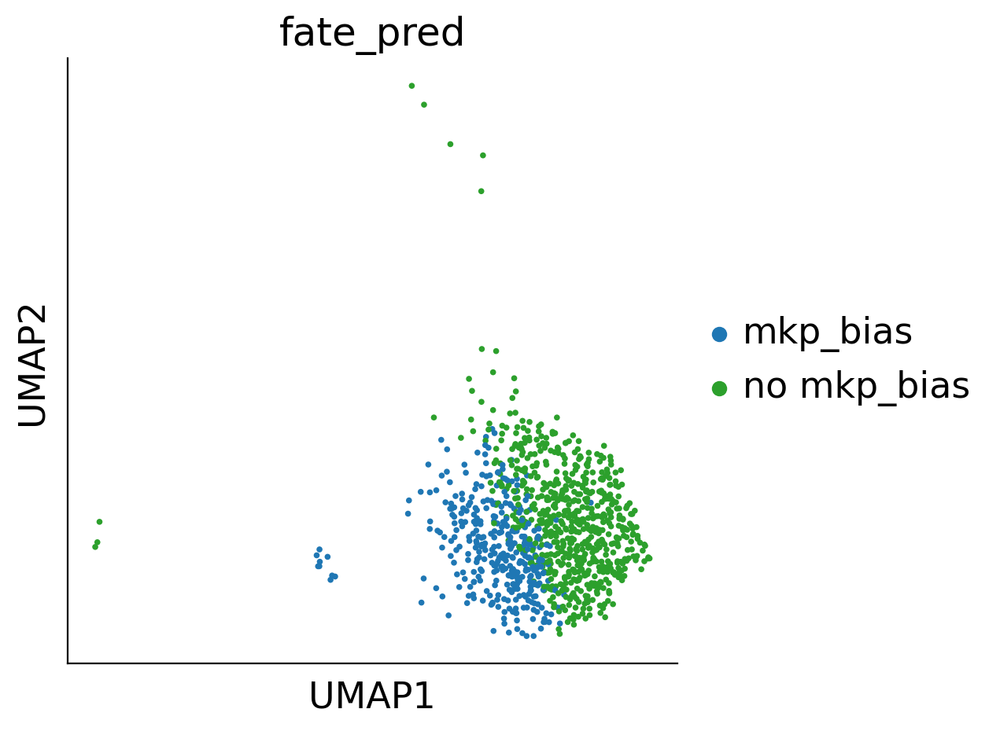

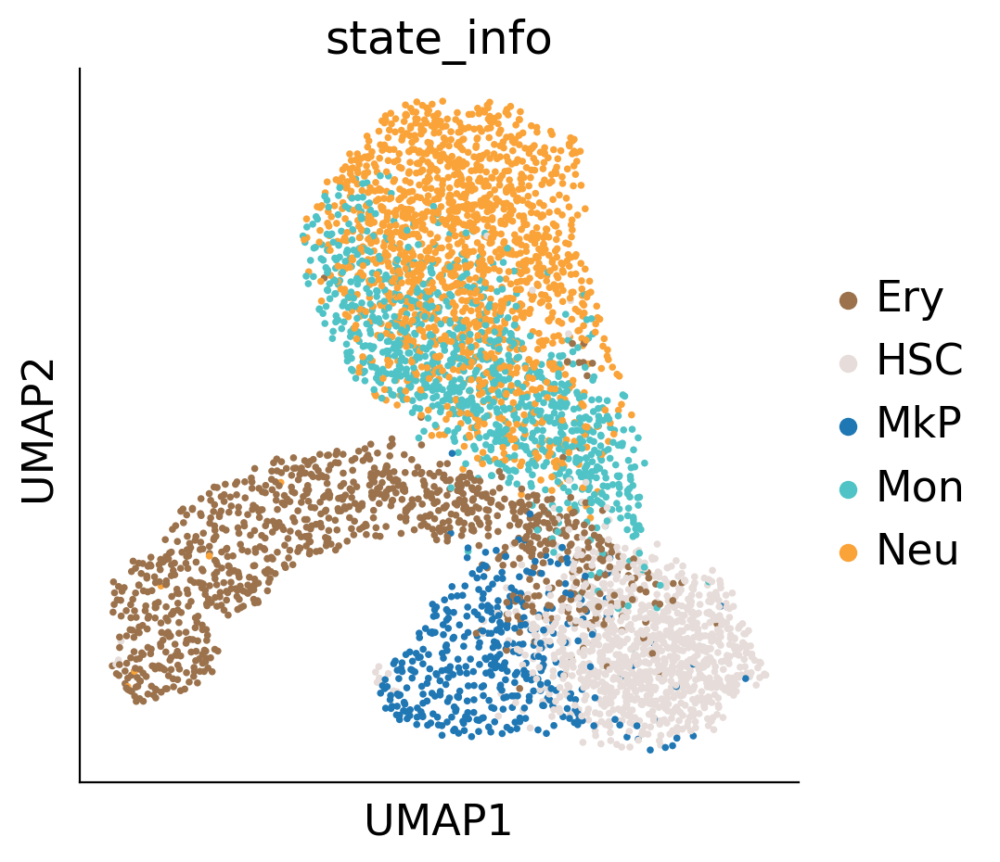

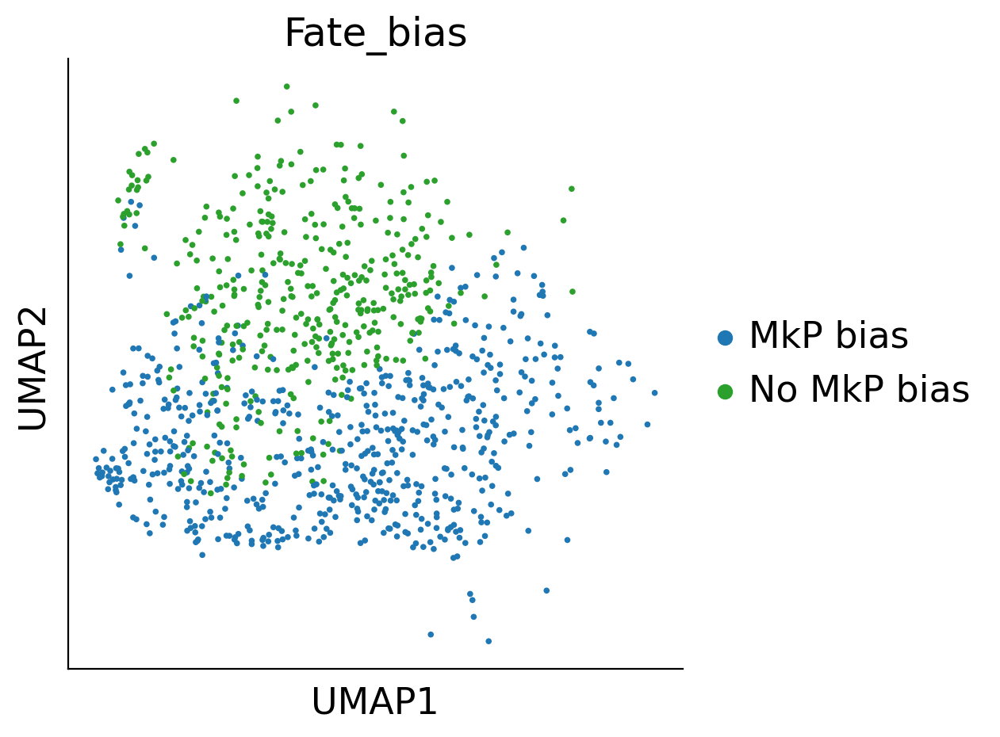

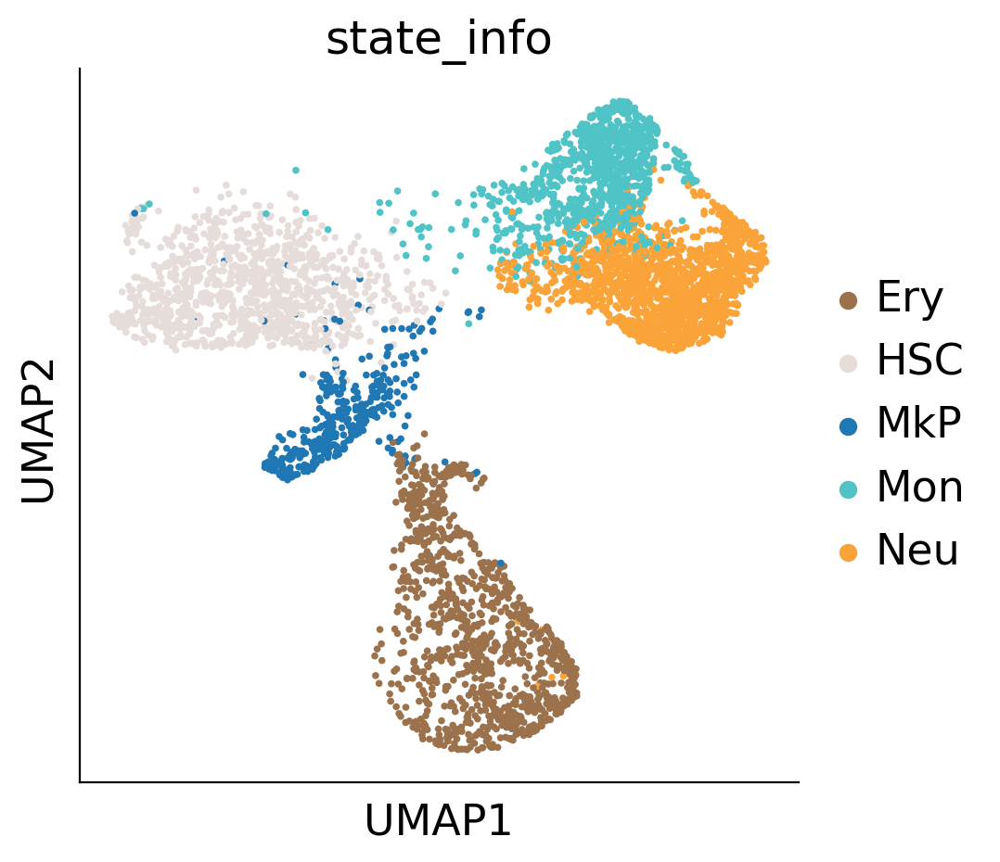

In [682]:
import matplotlib.pyplot as plt
import scanpy as sc
GT_colors= {
    'HSC': '#E6DCD9',   # 蓝色
    'mkp_bias': '#1f77b4',   # 
    'no mkp_bias': '#2ca02c'  # 绿色橙色
}
cospar_colors= {
    'HSC': '#E6DCD9',   # 蓝色
    'MkP bias': '#1f77b4',   # 
    'No MkP bias': '#2ca02c'  # 绿色橙色
}
state_colors = {
    'HSC': '#E6DCD9',   # 蓝色 
    'MkP': '#1f77b4',   # 
    'Ery': '#9B724C' , # 绿色橙色
     'Baso': '#279E8F',
    'Mon':'#50C3C6',
    'Neu':'#FAA339',
}#'#2ca02c','#F7F7F7','#1f77b4'
# 创建figure
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)
adata_plot=adata3[adata3.obs['state_info']=='HSC']
# 绘制UMAP图
sc.pl.umap(adata_plot, color='fate_pred', s=30, show=False, ax=ax, palette=GT_colors)
ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_prd.pdf', bbox_inches='tight') 

# 创建第二个figure
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)

# 绘制UMAP图
sc.pl.umap(adata3, color='state_info', s=30, show=False, ax=ax,palette=state_colors)
ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_clustering.pdf', bbox_inches='tight') 

fig, ax = plt.subplots()
fig.set_size_inches(5, 5)
sc.pl.umap(adata[adata.obs['Fate_bias'].isin(['No MkP bias','MkP bias'])], color='Fate_bias', s=30, show=False, ax=ax,palette=cospar_colors)
ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_pred_cospar.pdf', bbox_inches='tight') 
fig, ax = plt.subplots()
fig.set_size_inches(5, 5)
sc.pl.umap(adata[adata.obs['state_info'].isin(['Neu','Ery','MkP','Mon',"HSC"])], color='state_info', s=30, show=False, ax=ax,palette=state_colors)
ax.figure.savefig('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_clustering_cospar.pdf', bbox_inches='tight') 


In [641]:
# cs.pl.plot_adata_with_prefered_order(adata,'Fate_bias',plot_order=['LMPP','No MkP bias','MkP bias'],
#                               palette={'LMPP':'#d9d9d9','No MkP bias':'#ff7f0e','MkP bias':'#1f77b4','Late MkP bias':'grey'},
#                               linewidth = 0,s=30,background_size=5)

In [670]:
adata.obs['state_info']

LL837_skull_AAACCCAAGAGTCACG     Mon
LL837_skull_AAACCCAAGTGAACAT     Ery
LL837_skull_AAACCCACATCCGTTC     Mon
LL837_skull_AAACCCAGTCCACATA     MkP
LL837_skull_AAACCCAGTGAACGGT     MkP
                                ... 
LL837_skull_TTTGGTTTCATGCCCT     Ery
LL837_skull_TTTGGTTTCGACGTCG     Neu
LL837_skull_TTTGTTGAGCGTTACT    LMPP
LL837_skull_TTTGTTGAGTGATCGG     Neu
LL837_skull_TTTGTTGGTTACAGCT    LMPP
Name: state_info, Length: 5487, dtype: category
Categories (7, object): ['Baso', 'Ery', 'HSC', 'LMPP', 'MkP', 'Mon', 'Neu']

In [621]:
adata3.obs['GT'].value_counts()

no mkp_bias    665
mkp_bias       363
Name: fate_pred, dtype: int64

In [622]:
adata_orig.obs['GT'].value_counts()

nan    5419
0        43
1        25
Name: GT, dtype: int64

In [772]:

adata_orig.obs['fate_pred'] = None

# 将 adata3 中的 fate_pred 值赋给 adata_orig 中对应的细胞
# 假设 adata3.obs 有与 adata_orig.obs 相同的索引
adata_orig.obs.loc[adata3.obs.index, 'fate_pred'] = adata3.obs['fate_pred']

# 显示前几行查看结果
print(adata_orig.obs['fate_pred'].head())


0    None
1    None
2    None
3    None
4    None
Name: fate_pred, dtype: object


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


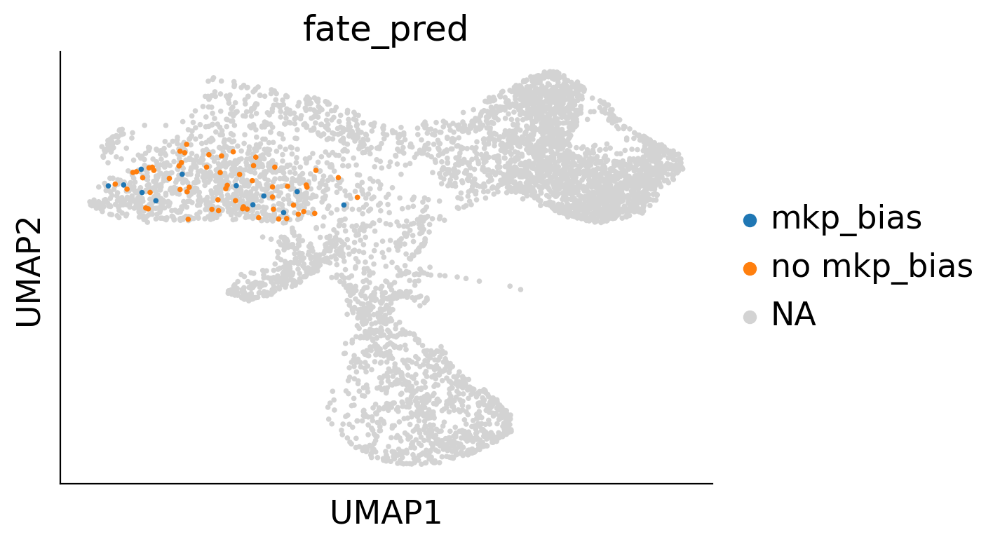

In [773]:
sc.pl.umap(adata_orig,color='GT',s=30)


100%|██████████████████████████████████████████████████████████████████| 4919/4919 [00:16<00:00, 301.85it/s]


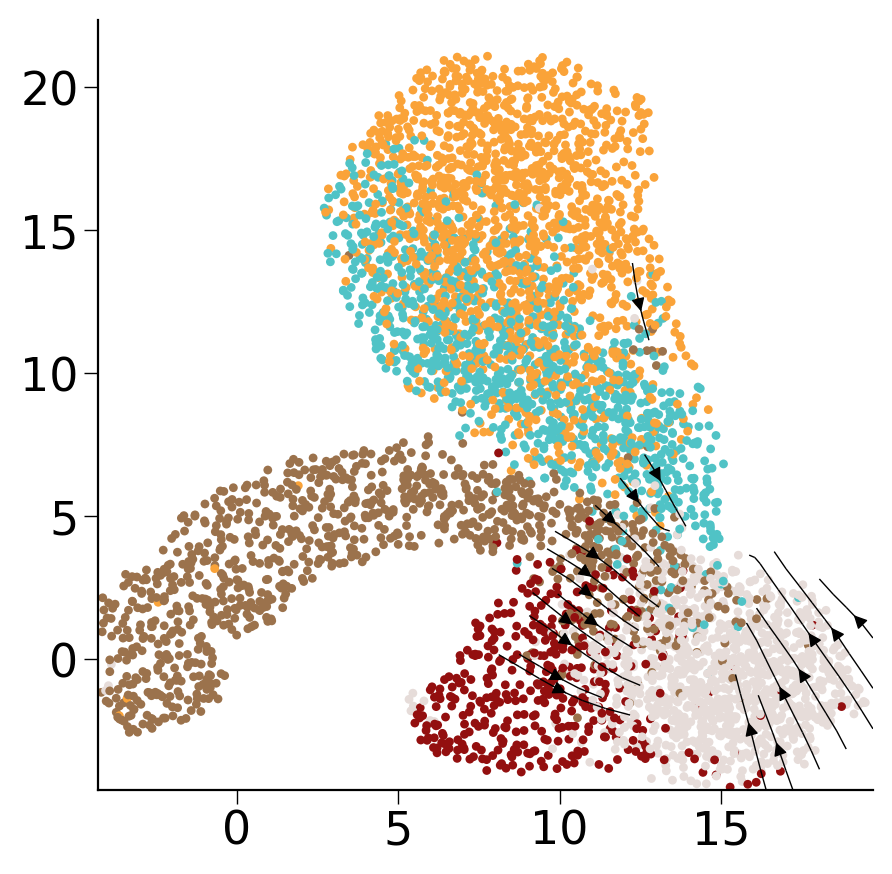

In [673]:
def compute_velocity_on_grid(
    X_emb,
    M_emb,
    density=None,
    smooth=None,
    n_neighbors=None,
    min_mass=None,
    autoscale=True,
    adjust_for_stream=False,
    cutoff_perc=None,
):
    # remove invalid cells
    idx_valid = np.isfinite(X_emb.sum(1) + M_emb.sum(1))
    X_emb = X_emb[idx_valid]
    M_emb = M_emb[idx_valid]

    # prepare grid
    n_obs, n_dim = X_emb.shape
    density = 0.5 if density is None else density
    smooth = 0.5 if smooth is None else smooth

    grs = []
    for dim_i in range(n_dim):
        m, M = np.min(X_emb[:, dim_i]), np.max(X_emb[:, dim_i])
        m = m - 0.01 * np.abs(M - m)
        M = M + 0.01 * np.abs(M - m)
        gr = np.linspace(m, M, int(50 * density))
        grs.append(gr)

    meshes_tuple = np.meshgrid(*grs)
    X_grid = np.vstack([i.flat for i in meshes_tuple]).T

    # estimate grid velocities
    if n_neighbors is None:
        n_neighbors = int(n_obs / 50)
    nn = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=-1)
    nn.fit(X_emb)
    dists, neighs = nn.kneighbors(X_grid)

    scale = np.mean([(g[1] - g[0]) for g in grs]) * smooth
    weight = normal.pdf(x=dists, scale=scale)
    p_mass = weight.sum(1)

    V_grid = (M_emb[neighs] * weight[:, :, None]).sum(1)
    V_grid /= np.maximum(1, p_mass)[:, None]
    if min_mass is None:
        min_mass = 1

    if adjust_for_stream:
        X_grid = np.stack([np.unique(X_grid[:, 0]), np.unique(X_grid[:, 1])])
        ns = int(np.sqrt(len(V_grid[:, 0])))
        V_grid = V_grid.T.reshape(2, ns, ns)

        mass = np.sqrt((V_grid ** 2).sum(0))
        min_mass = 10 ** (min_mass - 6)  # default min_mass = 1e-5
        min_mass = np.clip(min_mass, None, np.max(mass) * 0.9)
        cutoff = mass.reshape(V_grid[0].shape) < min_mass

        if cutoff_perc is None:
            cutoff_perc = 5
        length = np.sum(np.mean(np.abs(M_emb[neighs]), axis=1), axis=1).T
        length = length.reshape(ns, ns)
        cutoff |= length < np.percentile(length, cutoff_perc)

        V_grid[0][cutoff] = np.nan
    else:
        min_mass *= np.percentile(p_mass, 99) / 100
        X_grid, V_grid = X_grid[p_mass > min_mass], V_grid[p_mass > min_mass]

        if autoscale:
            V_grid /= 3 * quiver_autoscale(X_grid, V_grid)

    return X_grid, V_grid

def quiver_autoscale(X_emb, V_emb):
    import matplotlib.pyplot as pl

    scale_factor = np.abs(X_emb).max()  # just so that it handles very large values
    fig, ax = pl.subplots()
    Q = ax.quiver(
        X_emb[:, 0] / scale_factor,
        X_emb[:, 1] / scale_factor,
        V_emb[:, 0],
        V_emb[:, 1],
        angles="xy",
        scale_units="xy",
        scale=None,
    )
    Q._init()
    fig.clf()
    pl.close(fig)
    return Q.scale / scale_factor
import numpy as np
from scipy.stats import norm as normal
from sklearn.neighbors import NearestNeighbors
import tqdm
sc.pp.neighbors(adata3)

X = adata3.obsm['geneEnc'][:,0,:]
M = adata3.obsm['genemap'][:,0,:]
N = adata3.obsp['connectivities']
E = adata3.obsm["X_umap"]
norm = lambda x: (x-min(x))/(max(x)-min(x))
nn = NearestNeighbors(n_neighbors=20)
nn.fit(X)
dE = []


for i in tqdm.trange(N.shape[0]):
    D,I = nn.kneighbors( np.array([M[i]]) )
    dE.append( (E[I][0] - E[i]).mean(0))

dE = np.vstack(dE)
E = E[adata3.obs['cell_type'] == 'HSC']
dE = dE[adata3.obs['cell_type'] == 'HSC']

gE, gdE = compute_velocity_on_grid(E,dE,density=2, adjust_for_stream=True,smooth=True)

fig,ax=createFig(figsize=(5, 5))
fig.set_size_inches(5,5)
palette = sc.pl._tools.scatterplots._get_palette(adata3, 'state_info')
ax.scatter(adata3.obsm["X_umap"][:,0],adata3.obsm["X_umap"][:,1],s=10, linewidths=0,c=list(map(lambda x: palette[x], adata3.obs['state_info'])))
stream_kwargs = {
        "linewidth": 0.5,
        "density": 1,
        "zorder": 3,
        "color": "black",
        "arrowsize":  1,
    
        "arrowstyle": "-|>",
        "maxlength":  10,
        "integration_direction":  "both",
}

ax.streamplot(gE[0],gE[1],gdE[0],gdE[1],**stream_kwargs)
plt.savefig("/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fateflow.pdf")

100%|██████████████████████████████████████████████████████████████████| 4919/4919 [00:16<00:00, 304.39it/s]


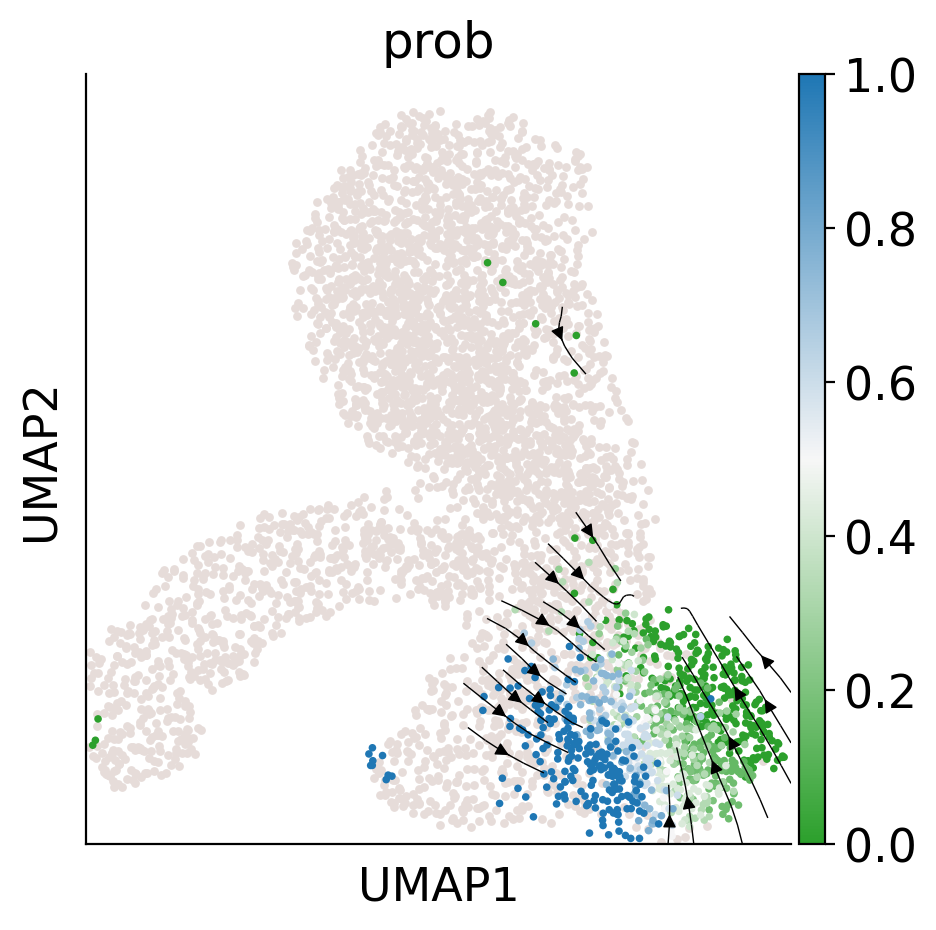

In [723]:
pei_adata=adata3
def compute_velocity_on_grid(
    X_emb,
    M_emb,
    density=None,
    smooth=None,
    n_neighbors=None,
    min_mass=None,
    autoscale=True,
    adjust_for_stream=False,
    cutoff_perc=None,
):
    # remove invalid cells
    idx_valid = np.isfinite(X_emb.sum(1) + M_emb.sum(1))
    X_emb = X_emb[idx_valid]
    M_emb = M_emb[idx_valid]

    # prepare grid
    n_obs, n_dim = X_emb.shape
    density = 0.5 if density is None else density
    smooth = 0.5 if smooth is None else smooth

    grs = []
    for dim_i in range(n_dim):
        m, M = np.min(X_emb[:, dim_i]), np.max(X_emb[:, dim_i])
        m = m - 0.01 * np.abs(M - m)
        M = M + 0.01 * np.abs(M - m)
        gr = np.linspace(m, M, int(50 * density))
        grs.append(gr)

    meshes_tuple = np.meshgrid(*grs)
    X_grid = np.vstack([i.flat for i in meshes_tuple]).T

    # estimate grid velocities
    if n_neighbors is None:
        n_neighbors = int(n_obs / 50)
    nn = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=-1)
    nn.fit(X_emb)
    dists, neighs = nn.kneighbors(X_grid)

    scale = np.mean([(g[1] - g[0]) for g in grs]) * smooth
    weight = normal.pdf(x=dists, scale=scale)
    p_mass = weight.sum(1)

    V_grid = (M_emb[neighs] * weight[:, :, None]).sum(1)
    V_grid /= np.maximum(1, p_mass)[:, None]
    if min_mass is None:
        min_mass = 1

    if adjust_for_stream:
        X_grid = np.stack([np.unique(X_grid[:, 0]), np.unique(X_grid[:, 1])])
        ns = int(np.sqrt(len(V_grid[:, 0])))
        V_grid = V_grid.T.reshape(2, ns, ns)

        mass = np.sqrt((V_grid ** 2).sum(0))
        min_mass = 10 ** (min_mass - 6)  # default min_mass = 1e-5
        min_mass = np.clip(min_mass, None, np.max(mass) * 0.9)
        cutoff = mass.reshape(V_grid[0].shape) < min_mass

        if cutoff_perc is None:
            cutoff_perc = 5
        length = np.sum(np.mean(np.abs(M_emb[neighs]), axis=1), axis=1).T
        length = length.reshape(ns, ns)
        cutoff |= length < np.percentile(length, cutoff_perc)

        V_grid[0][cutoff] = np.nan
    else:
        min_mass *= np.percentile(p_mass, 99) / 100
        X_grid, V_grid = X_grid[p_mass > min_mass], V_grid[p_mass > min_mass]

        if autoscale:
            V_grid /= 3 * quiver_autoscale(X_grid, V_grid)

    return X_grid, V_grid

def quiver_autoscale(X_emb, V_emb):
    import matplotlib.pyplot as pl

    scale_factor = np.abs(X_emb).max()  # just so that it handles very large values
    fig, ax = pl.subplots()
    Q = ax.quiver(
        X_emb[:, 0] / scale_factor,
        X_emb[:, 1] / scale_factor,
        V_emb[:, 0],
        V_emb[:, 1],
        angles="xy",
        scale_units="xy",
        scale=None,
    )
    Q._init()
    fig.clf()
    pl.close(fig)
    return Q.scale / scale_factor
import numpy as np
from scipy.stats import norm as normal
from sklearn.neighbors import NearestNeighbors
import tqdm
sc.pp.neighbors(pei_adata)

X = pei_adata.obsm['geneEnc'][:,0,:]
M = pei_adata.obsm['genemap'][:,0,:]
N = pei_adata.obsp['connectivities']
E = pei_adata.obsm["X_umap"]
norm = lambda x: (x-min(x))/(max(x)-min(x))
nn = NearestNeighbors(n_neighbors=5)
nn.fit(X)
dE = []


for i in tqdm.trange(N.shape[0]):
    D,I = nn.kneighbors( np.array([M[i]]) )
    dE.append( (E[I][0] - E[i]).mean(0))

dE = np.vstack(dE)
E = E[pei_adata.obs['cell_type'] == 'HSC']
dE = dE[pei_adata.obs['cell_type'] == 'HSC']

gE, gdE = compute_velocity_on_grid(E,dE,density=2, adjust_for_stream=True,smooth=True)

fig,ax=createFig(figsize=(5, 5))
fig.set_size_inches(5,5)
palette = sc.pl._tools.scatterplots._get_palette(pei_adata, 'cell_type')
ax.scatter(
    pei_adata[list(map(lambda x: x != 'HSC', pei_adata.obs['cell_type']))].obsm["X_umap"][:,0],
    pei_adata[list(map(lambda x: x != 'HSC', pei_adata.obs['cell_type']))].obsm["X_umap"][:,1],
    s = 10, color='#E6DCD9', linewidth=0
)
sc.pl.umap(
    pei_adata[list(map(lambda x: x == 'HSC', pei_adata.obs['cell_type']))], 
    ax=ax, 
    color='prob', 
    s=30, 
    cmap=make_colormap(['#2ca02c','#F7F7F7','#1f77b4']),
    show=False
)
stream_kwargs = {
        "linewidth": 0.5,
        "density": 1,
        "zorder": 3,
        "color": "black",
        "arrowsize":  1,
    
        "arrowstyle": "-|>",
        "maxlength":  10,
        "integration_direction":  "both",
}

ax.streamplot(gE[0],gE[1],gdE[0],gdE[1],**stream_kwargs)
#plt.savefig("/home/zhengtuo/songtao/DestinyNet/pei_figure/flow.pdf")
plt.savefig("/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_flow.pdf")

In [666]:
data.shape

(1028,)

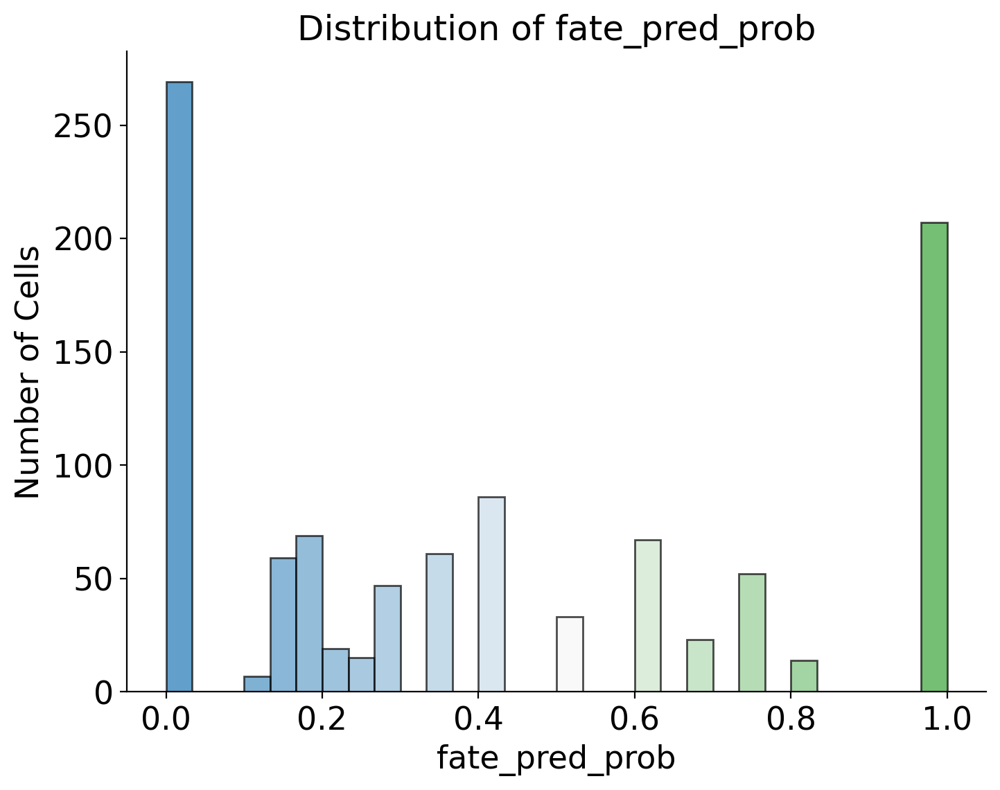

In [684]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from colour import Color
from matplotlib.colors import LinearSegmentedColormap
def make_colormap( colors, show_palette = False ): 
    color_ramp = LinearSegmentedColormap.from_list( 'my_list', [ Color( c1 ).rgb for c1 in colors ] )
    if show_palette:
        plt.figure( figsize = (15,3))
        plt.imshow( [list(np.arange(0, len( colors ) , 0.1)) ] , interpolation='nearest', origin='lower', cmap= color_ramp )
        plt.xticks([])
        plt.yticks([])
    return color_ramp  
pei_adata=adata3.copy()
colormap=make_colormap(['#1f77b4','#F7F7F7','#2ca02c'])
# 获取数据
data = adata3[adata3.obs['cell_type']=='HSC'].obs['prob']

# 创建一个新的figure
plt.figure(figsize=(8, 6))

# 获取直方图的数据
n, bins, patches = plt.hist(data, bins=30, edgecolor='black', alpha=0.7)

# Normalize data to 0-1 range for colormap
norm = plt.Normalize(data.min(), data.max())

# 设置每个bin的颜色
for thisbin, thispatch in zip(bins, patches):
    color = colormap(norm(thisbin))
    thispatch.set_facecolor(color)

# 添加标题和轴标签
plt.title("Distribution of fate_pred_prob")
plt.xlabel("fate_pred_prob")
plt.ylabel("Number of Cells")
plt.savefig("/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fate_hisgram_pei.pdf", bbox_inches='tight')

# 显示图形
plt.show()


In [ ]:
GT_colors= {
    'HSC': '#2ca02c',   # 蓝色
    'mkp bias': '#1f77b4',   # 
    'Non-MkP': '#ff7f0e'  # 绿色橙色
}

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


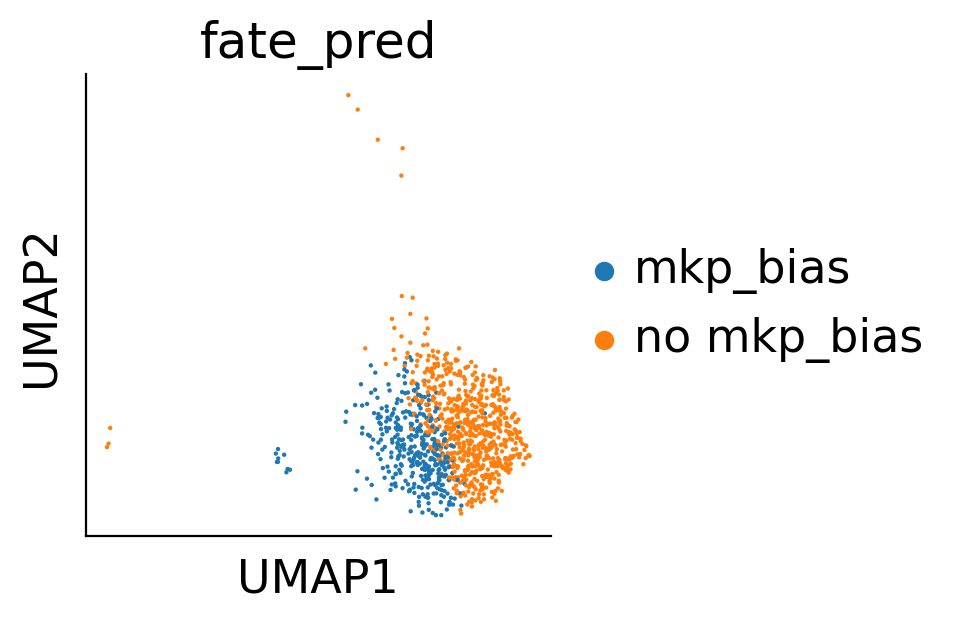

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


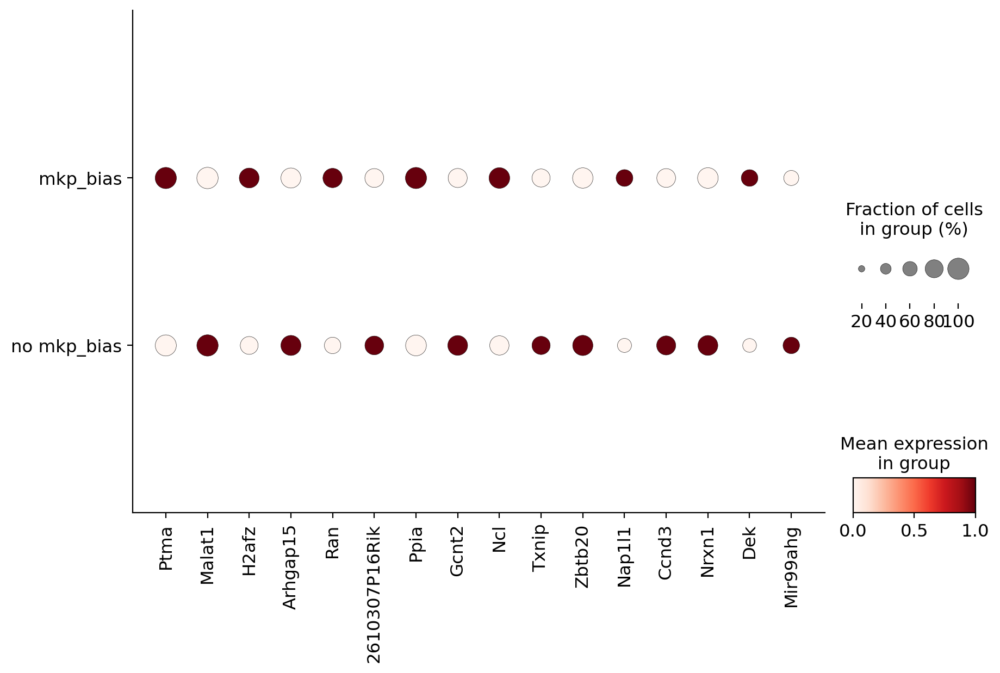

In [686]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# 筛选数据
adata2 = adata3[(adata3.obs['fate_pred'].isin(['mkp_bias', 'no mkp_bias']))].copy()
#adata2 = adata2[adata2.obs['cell_source'] == 'H9']

# 绘制UMAP
plt.rcParams['font.size'] = 14
fig, ax = plt.subplots(figsize=(3, 3))
sc.pl.umap(adata2, color=['fate_pred'], ax=ax, s=10)

# 计算差异表达基因
sc.tl.rank_genes_groups(adata2, groupby='fate_pred', method='t-test_overestim_var',use_raw=False)

min_percentage_threshold = 0.6

# 选择感兴趣的基因
selected_genes = pd.DataFrame(adata2.uns['rank_genes_groups']['names']).to_numpy().flatten()

# 计算每个基因的表达百分比，并在找到16个符合条件的基因后停止
filtered_genes = []
for gene in selected_genes:
    if gene in adata2.var_names:
        gene_expression = adata2[:, gene].X
        expressed_cells_percentage = (gene_expression > 0).sum() / gene_expression.shape[0]
        if expressed_cells_percentage >= min_percentage_threshold:
            filtered_genes.append(gene)
        if len(filtered_genes) >= 16:
            break

# 如果过滤后的基因不足16个，从其他基因中补充
if len(filtered_genes) < 16:
    additional_genes = (gene for gene in adata2.var_names if gene not in filtered_genes)
    filtered_genes.extend(islice(additional_genes, 16 - len(filtered_genes)))

# 使用过滤后的基因绘制 dotplot
sc.pl.dotplot(
    adata2, 
    var_names=filtered_genes, 
    groupby='fate_pred',
    figsize=(10, 6),
    standard_scale='var',
)


In [721]:
pei_adata=adata3.copy()
indices = (np.array(pei_adata.obs['cell_type'] == 'HSC'))
sc.tl.leiden(pei_adata, resolution=0.5)
pei_adata.obs['fate_pred'].cat.add_categories(['-'], inplace=True)

pei_adata.obs['fate_pred'] = pei_adata.obs['fate_pred'].fillna('-')


/tmp/ipykernel_67646/551174476.py:4: FutureWarning: The `inplace` parameter in pandas.Categorical.add_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  pei_adata.obs['fate_pred'].cat.add_categories(['-'], inplace=True)


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


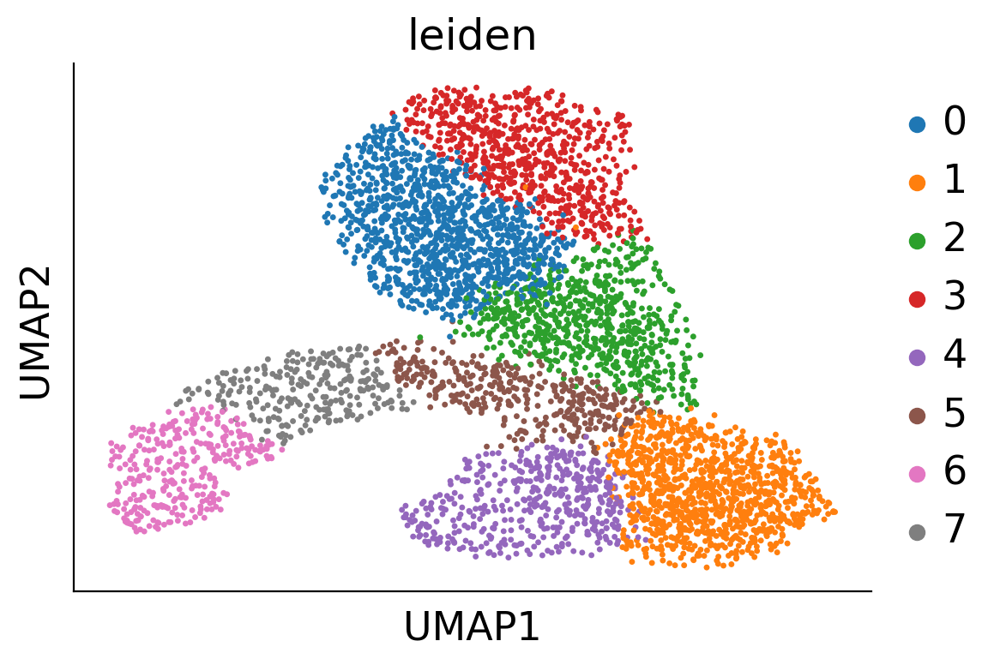

In [722]:
sc.pl.umap(pei_adata,color='leiden')


<AxesSubplot: >

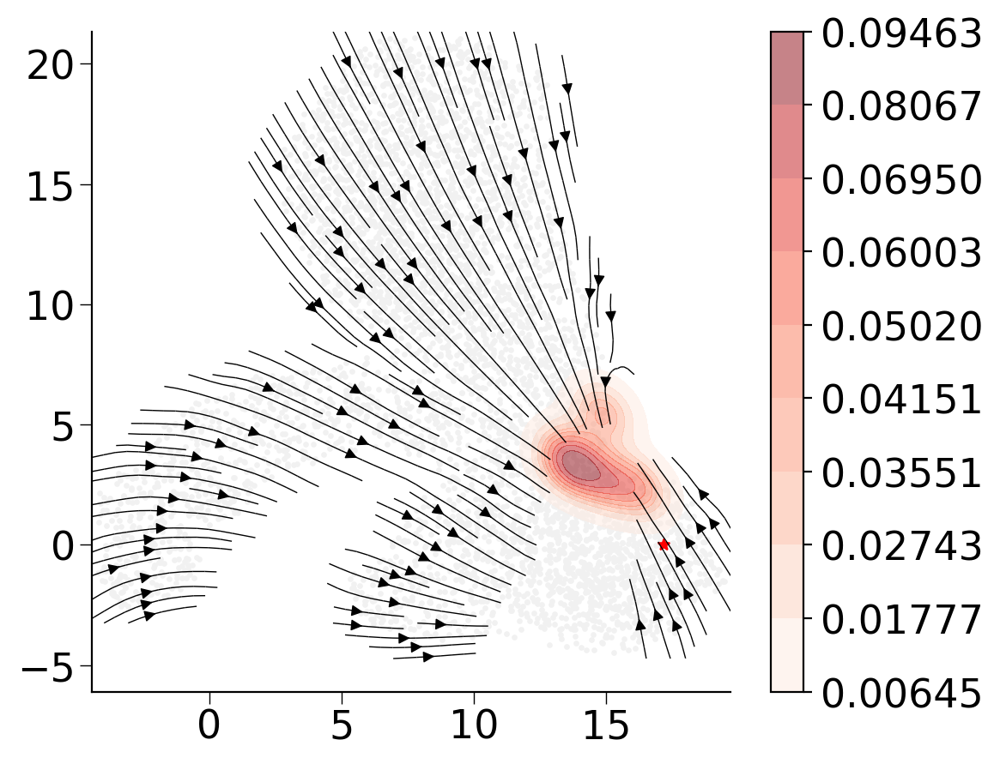

In [720]:
import seaborn as sns

xkey = 'geneEnc'
mkey = 'genemap'
X = pei_adata.obsm['geneEnc'][:,0,:]
M = pei_adata.obsm['genemap'][:,0,:]
N = pei_adata.obsp['connectivities']
E = pei_adata.obsm["X_umap"]



# gE, gdE = biddy_adata.uns['gE'], biddy_adata.uns['gdE']
# gE, gdE = compute_velocity_on_grid(E,dE,density=2, adjust_for_stream=True,smooth=True)
fig,ax=createFig()
fig.set_size_inches(6, 5)
palette={
 'Ery': '#2A9E27',
 'Lymphoid': '#E43E96',
 'Mast': '#B5BD61',
 'My': '#279E9E',
 'Mo': '#50C3C6',
 'Neu': '#FAA339',
 'ME': '#279E8F',
 'Ly': '#E43E96',
 'HSC': '#E6DCD9',
    '-':'#E6DCD9'
}
ax.scatter(E[:,0],E[:,1],s=1, linewidths=0)
# ax.scatter(E[:,0],E[:,1],s=1, linewidths=0,c=list(map(lambda x: sc.pl._tools.scatterplots._get_palette(biddy_adata, 'leiden')[x], biddy_adata.obs['leiden'])))
tmp = pei_adata.obs

def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))
# sc.pl.umap(weinreb_adata, ax=ax, color='Gata2')

i=np.random.choice(list(map(lambda z: z[0], 
                            filter(lambda x: x[1] == '1', 
                                   enumerate(pei_adata.obs['leiden'])))), 1)
i
from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors(n_neighbors=5)
nn.fit(X)
D,I = nn.kneighbors(M[i])
e = E[I][0]


E = pei_adata.obsm["X_umap"]

ax.scatter(
    pei_adata.obsm["X_umap"][:,0],
    pei_adata.obsm["X_umap"][:,1],
    color='#F1F1F1',
    s=2
)

stream_kwargs = {
        "linewidth": 0.5,
        "density": 1.8,
        "zorder": 3,
        "color": "black",
        "arrowsize":  1,
        "arrowstyle": "-|>",
        "maxlength":  10,
        "integration_direction":  "both",
}
ax.streamplot(gE[0],gE[1],gdE[0],gdE[1],**stream_kwargs)

ax.scatter(E[i,0],E[i,1],color='red',s=20,marker='*')
# sns.kdeplot(e[:,0],e[:,1],ax=ax, fill=True, alpha=0.5, cmap='Reds',cbar=True)

sns.kdeplot(x=e[:,0], y=e[:,1], ax=ax, fill=True, alpha=0.5, cmap='Reds', cbar=True)


In [859]:
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_fateflow_hotpot4.pdf') as pdf:
    pdf.savefig(fig, bbox_inches='tight')

In [861]:

# filtered_genes+=DGE_genes
# sc.pl.dotplot(
#     adata2, 
#     var_names=filtered_genes, 
#     groupby='fate_pred',
#     figsize=(10, 6),
#     standard_scale='var',
# )

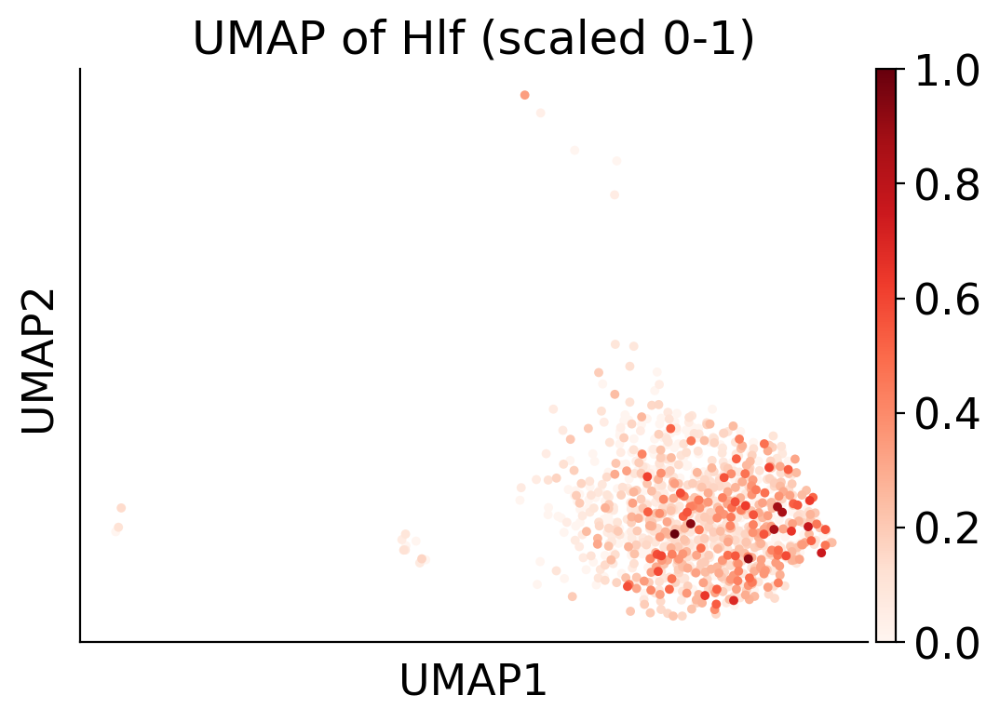

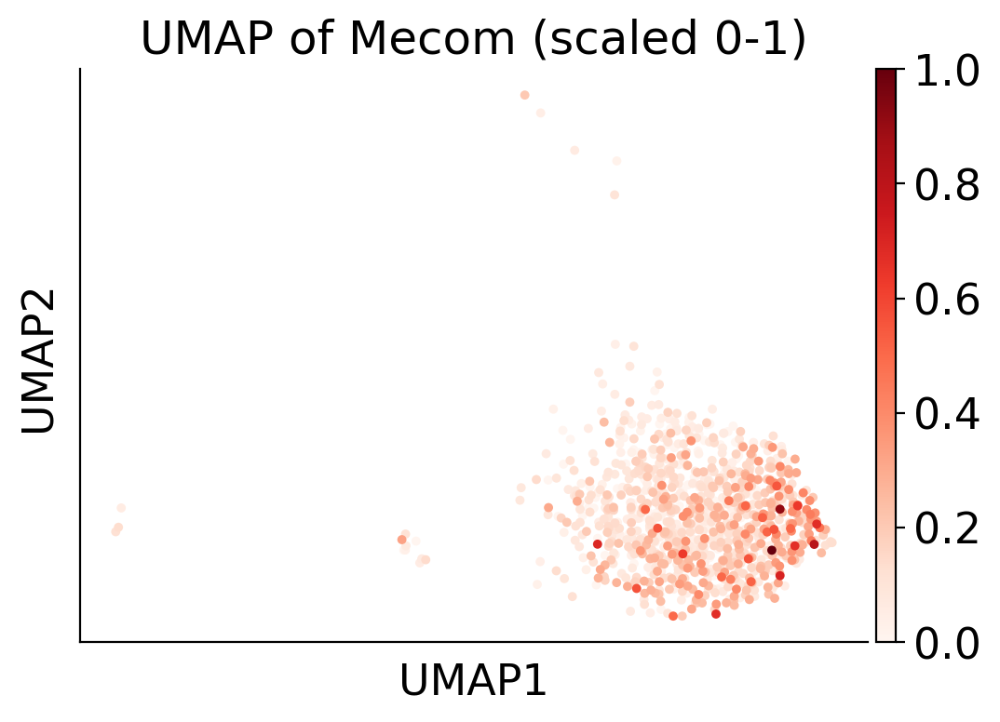

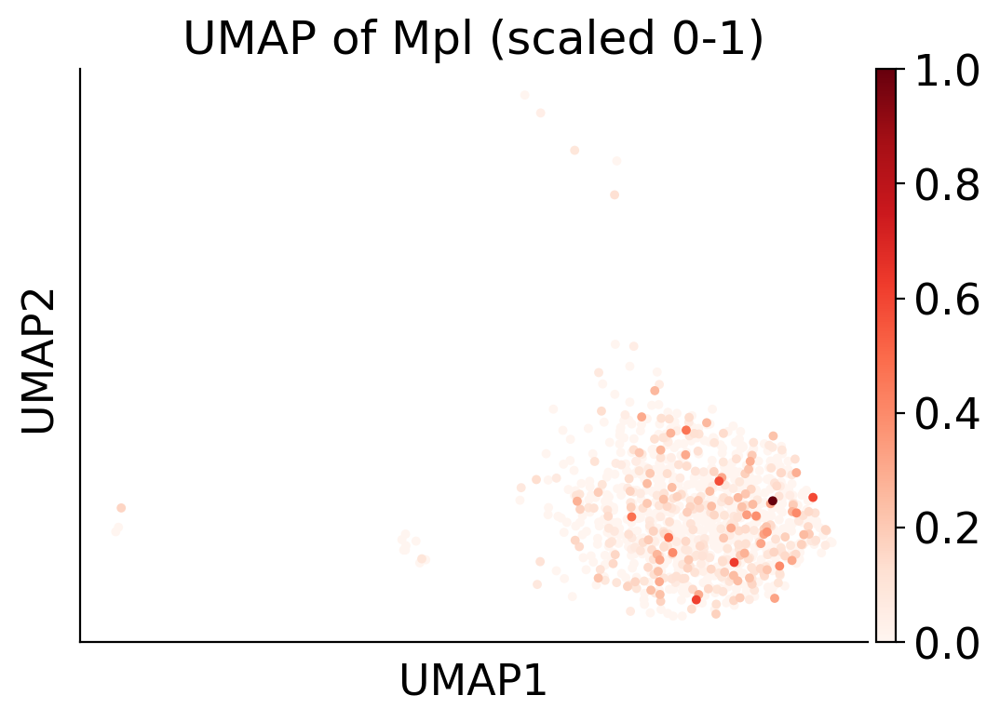

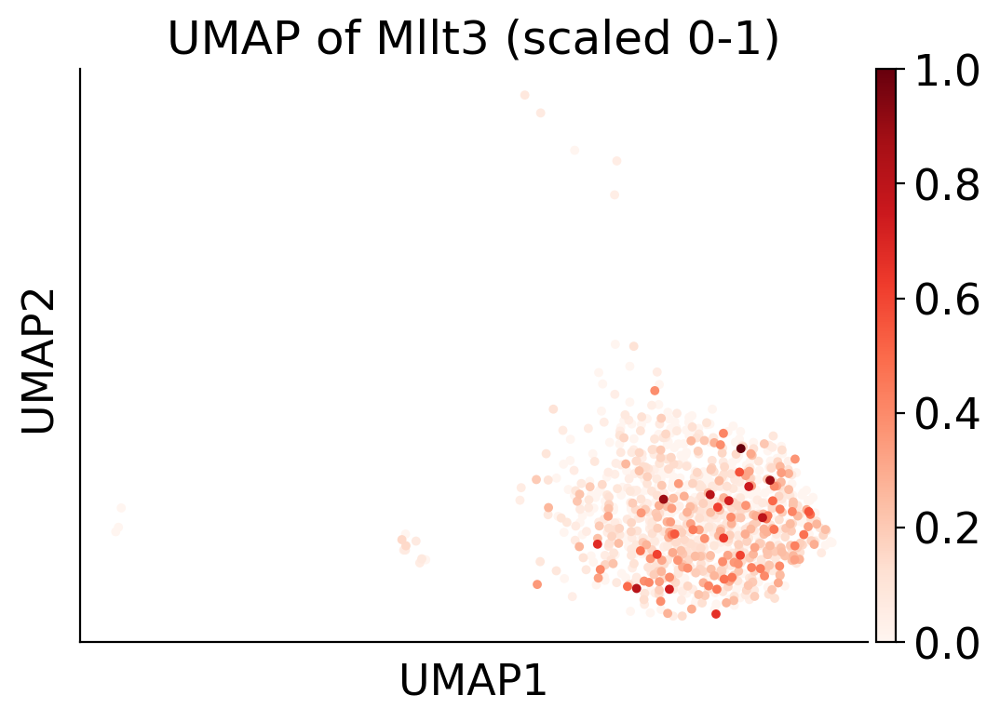

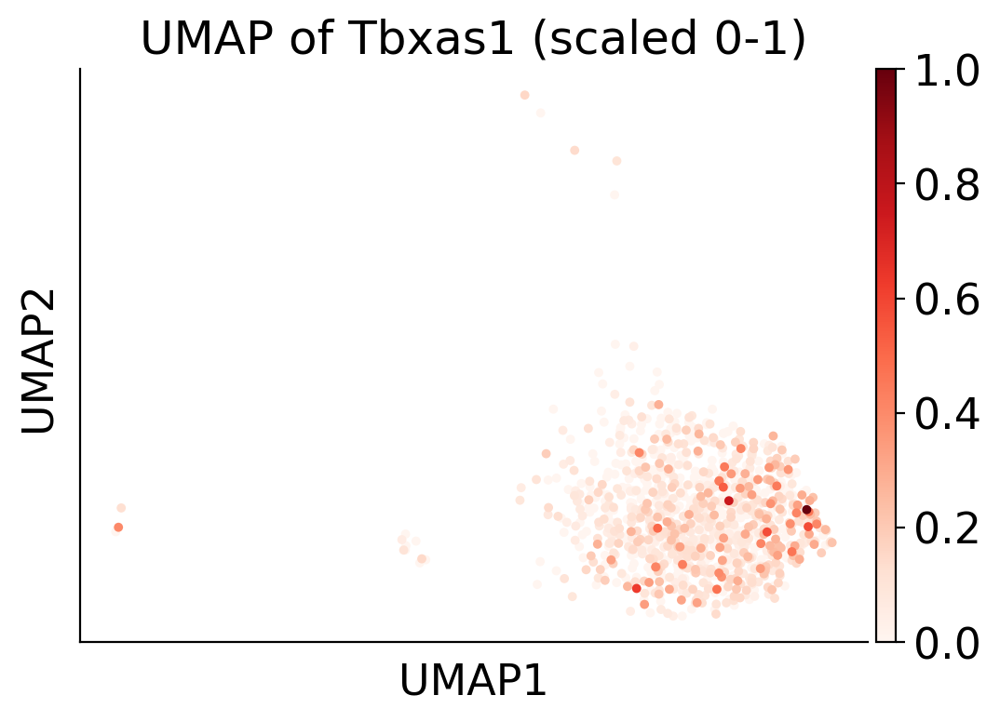

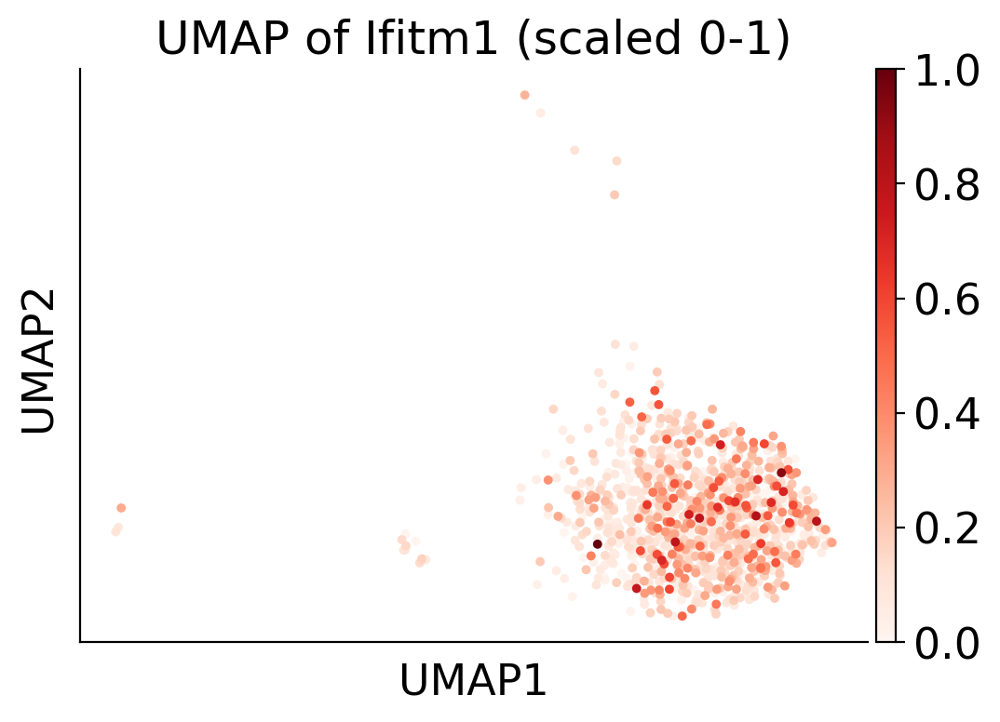

In [687]:
import scanpy as sc
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# 假设 adata3 已经加载到你的环境中

# 选择特定的细胞群体
adata2 = adata3[(adata3.obs['fate_pred'].isin(['mkp_bias', 'no mkp_bias']))].copy()

# 选择展示的基因列表
DGE_genes = ['Hlf', 'Mecom', 'Mpl', 'Mllt3', 'Tbxas1', 'Ifitm1']

# 对数据进行 Z-score 标准化
sc.pp.scale(adata2)

# 对选择的基因表达进行 Min-Max 标准化
scaler = MinMaxScaler()
for gene in DGE_genes:
    if gene in adata2.var_names:
        gene_expression = adata2[:, gene].X
        gene_expression = gene_expression.toarray() if isinstance(gene_expression, np.matrix) else gene_expression  # Convert sparse matrix to dense
        scaled_gene_expression = scaler.fit_transform(gene_expression)
        adata2[:, gene].X = scaled_gene_expression

# 绘制标准化后基因的 UMAP 图
for gene in DGE_genes:
    sc.pl.umap(adata2, color=gene, s=50, title=f'UMAP of {gene} (scaled 0-1)')

# 如果只绘制某一个基因的 UMAP 图
# sc.pl.umap(adata2, color="Hlf", s=50, title='UMAP of Hlf (scaled 0-1)')


In [688]:
import seaborn as sns
import pandas as pd
from torch.utils.data import DataLoader, TensorDataset
from torch.autograd import Variable
import torch.nn as nn

def compute_gradients_for_label(target_label, data, model_encoder, model_decoder):
    mask = data.obs['fate_pred'] == target_label
    filtered_data = data[mask]
    
    geneex_data = torch.tensor(filtered_data.X.toarray(), dtype=torch.float32).to(device2)
    
    dataset = TensorDataset(geneex_data)
    dataloader = DataLoader(dataset, batch_size=256, shuffle=False)
    
    total_gradients = torch.zeros(len_geneExp).to(device2)
    for batch in dataloader:
        geneExp = batch[0]
        geneExp = Variable(geneExp, requires_grad=True)
        output_data = model_encoder(geneExp)
        output_data = model_decoder(output_data)
        
        loss_function = nn.MSELoss()
        loss = loss_function(output_data, geneExp)
        
        model_encoder.zero_grad()
        model_decoder.zero_grad()
        loss.backward()

        total_gradients += geneExp.grad.abs().mean(dim=0)

    average_gradients = total_gradients / len(dataloader)
    
    return average_gradients

labels = ['mkp_bias', 'no mkp_bias']
gradients_per_label = {}

for label in labels:
    gradients_per_label[label] = compute_gradients_for_label(label, adata3, geneEnc, geneDec)


In [689]:
num_key_genes = 100 

key_genes_per_label = {}

for label, gradients in gradients_per_label.items():
    df = pd.DataFrame({
        'gene_ids': adata2.var.index.values,
        'importance': gradients.cpu().detach().numpy()
    })

    sorted_df = df.sort_values(by="importance", ascending=False)
    
    key_genes = sorted_df['gene_ids'].head(num_key_genes).tolist() 
    key_genes_per_label[label] = key_genes

for label, genes in key_genes_per_label.items():
    print(f"Key genes for label {label}:")
    print(', '.join(genes))
    print("\n")


Key genes for label mkp_bias:
Malat1, Eef1a1, Fau, Tpt1, Ptma, Ppia, Rack1, Actb, Fth1, Gm42418, Angpt1, Eef1b2, Naca, Msi2, Npm1, Etv6, Ubb, Ifitm1, Tmsb4x, B2m, H3f3a, Gas5, Nrxn1, Aff3, H2-K1, Stmn1, H2afy, H3f3b, H2afz, Lrmda, Srgn, Ncl, Arhgap15, Adgrl4, Rnf220, Hmgb1, Zbtb20, Mecom, Ftl1, Pabpc1, Foxp1, Eif1, Runx1, Meis1, Ifitm3, Lmo2, Ctla2a, Nedd4, Dapp1, Eif5a, Pfn1, Fut8, Prkg1, Serbp1, Ybx1, Cdk6, Eef2, Anp32b, Elmo1, Cox8a, Actg1, Gpx1, Oaz1, H2-D1, Itm2b, Cox4i1, Ifitm2, Cmtm7, Atp5e, Myl6, Hnrnpa2b1, Ddx5, Akap13, Btf3, Gcnt2, Nme2, Hmgb2, Serf2, Rbm39, Atp5g2, Chchd2, Gapdh, Eif3f, Set, Ran, Eef1g, Mctp1, Rsrp1, Zfp36l2, Mbnl1, Ripor2, Atpif1, Uqcrh, Gng5, Snrpg, Cfl1, Ndufa4, Hnrnpu, Hint1, 2610307P16Rik


Key genes for label no mkp_bias:
Malat1, Eef1a1, Fau, Tpt1, Ptma, Rack1, Ppia, Gm42418, Angpt1, Actb, Etv6, Eef1b2, Msi2, Fth1, Naca, Nrxn1, Ifitm1, Npm1, Lrmda, Ubb, Gas5, Tmsb4x, Adgrl4, B2m, Arhgap15, Aff3, H3f3b, H2-K1, H3f3a, Zbtb20, H2afy, Rnf220, Mecom, Srgn, 

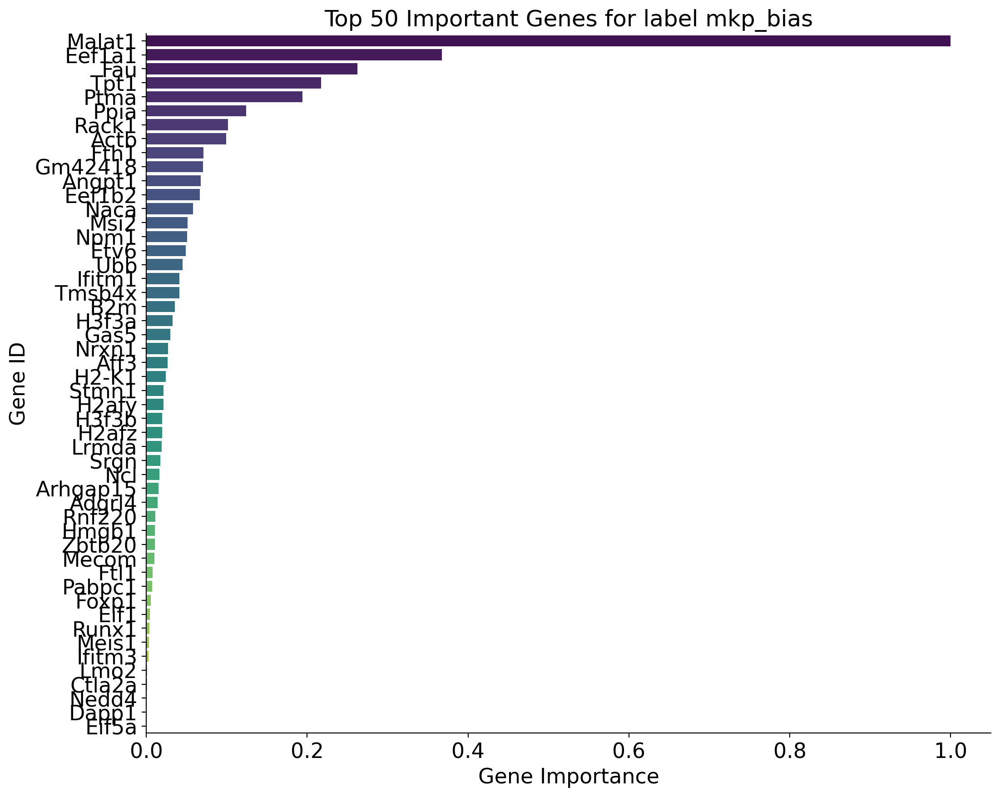

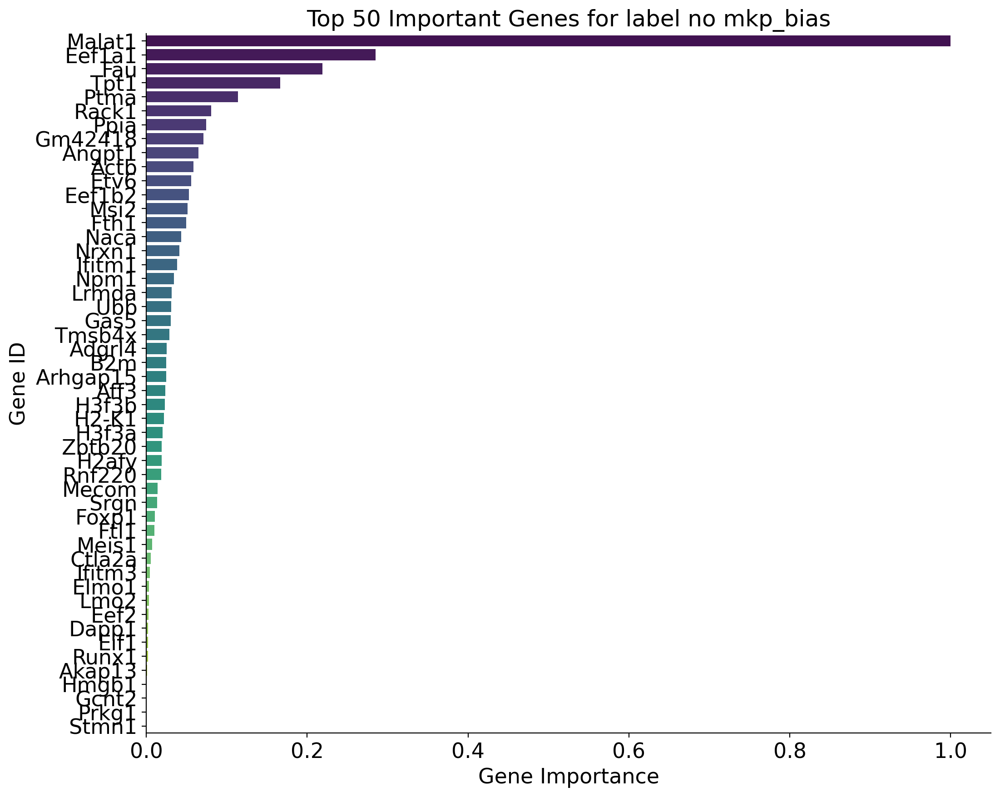

In [690]:
def normalize(array):
    min_val = array.min()
    max_val = array.max()
    return (array - min_val) / (max_val - min_val)

num_key_genes = 50

for label, gradients in gradients_per_label.items():
    df = pd.DataFrame({
        'gene_ids': adata2.var.index.values,
        'importance': gradients.cpu().detach().numpy()
    })

    sorted_df = df.sort_values(by="importance", ascending=False).head(num_key_genes)
    sorted_df['gene_importance'] = normalize(sorted_df['importance'])

    plt.figure(figsize=(12, 10))
    
    sns.barplot(x='gene_importance', y='gene_ids', data=sorted_df, palette='viridis')
    
    plt.title(f"Top {num_key_genes} Important Genes for label {label}")
    plt.xlabel('Gene Importance')
    plt.ylabel('Gene ID')
    plt.show()


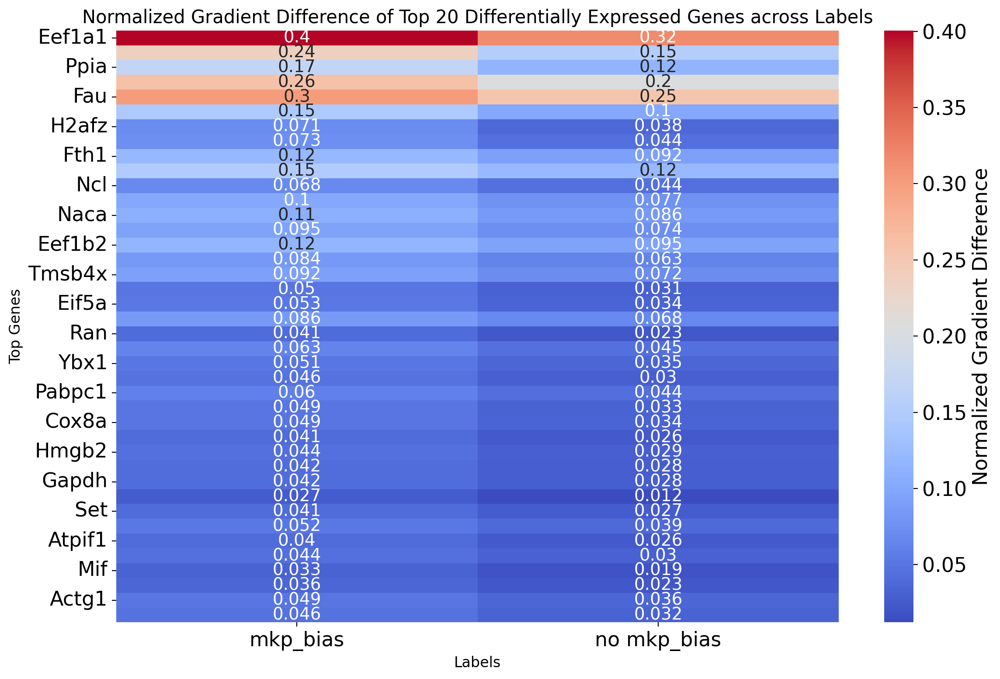

In [691]:
gradient_data = {}
for label, gradients in gradients_per_label.items():
    gradient_data[label] = gradients.cpu().detach().numpy()

df_gradients_all = pd.DataFrame(gradient_data, index=adata2.var.index.values)

def normalize(column):
    """Normalize a pandas column to range between 0 and 1"""
    min_val = column.min()
    max_val = column.max()
    return (column - min_val) / (max_val - min_val)

# Normalize gradients for each label
for label in labels:
    df_gradients_all[label] = normalize(df_gradients_all[label])

# Compute difference between normalized gradients for the two labels
df_gradients_all['diff'] = (df_gradients_all[labels[0]] - df_gradients_all[labels[1]])

# Select the top 20 genes with the largest gradient difference
top_genes = df_gradients_all['diff'].abs().nlargest(40).index

# Extract the normalized gradient values for the top genes
df_gradient_top = df_gradients_all.loc[top_genes, labels]

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df_gradient_top, cmap="coolwarm", annot=True, cbar_kws={'label': 'Normalized Gradient Difference'})
plt.title("Normalized Gradient Difference of Top 20 Differentially Expressed Genes across Labels", fontsize=15)
plt.ylabel('Top Genes', fontsize=12)
plt.xlabel('Labels', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
'mkp_bias': '#1f77b4',   # 
    'no mkp_bias': '#2ca02c'  # 绿色橙色

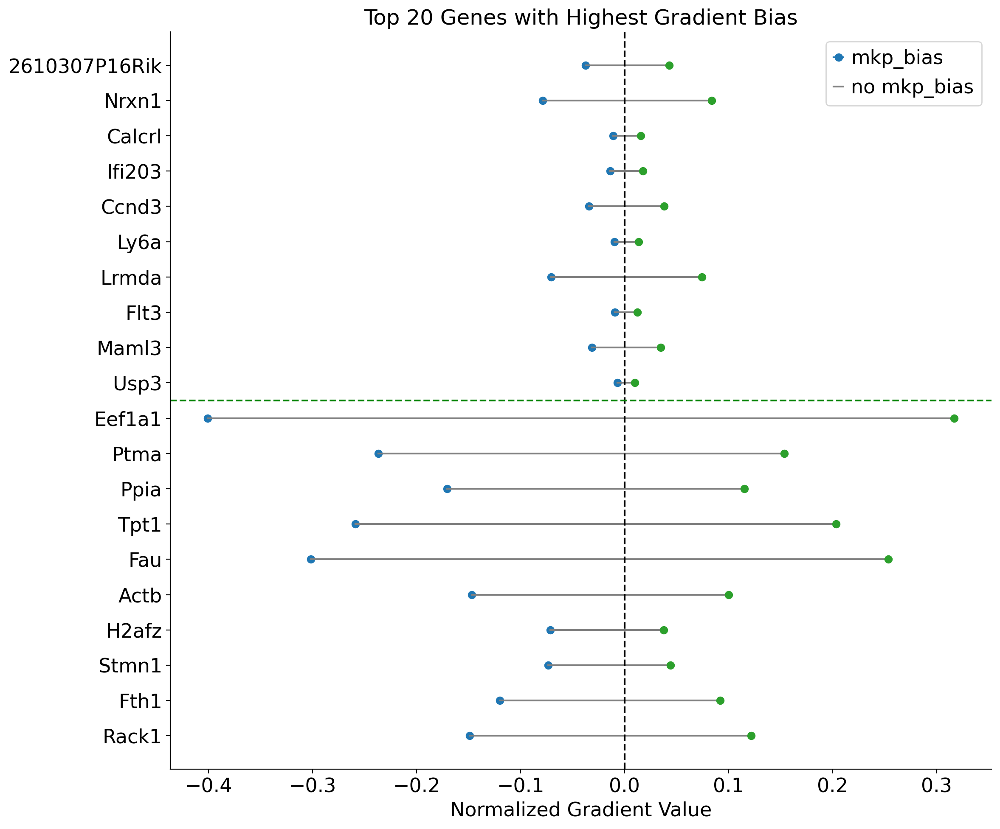

In [698]:
import matplotlib.pyplot as plt
df_gradients_all_normalized = df_gradients_all.copy()
# for label in labels:
#     df_gradients_all_normalized[label] = (df_gradients_all[label] - df_gradients_all[label].min()) / (df_gradients_all[label].max() - df_gradients_all[label].min())

# 将第一个标签的值取为负数
df_gradients_all_normalized[labels[0]] = -df_gradients_all_normalized[labels[0]]

# 计算bias，即归一化后两个标签的梯度值之差
df_gradients_all_normalized['bias'] = df_gradients_all_normalized[labels[1]] + df_gradients_all_normalized[labels[0]]

# 从大到小排序，获取右侧的bias
sorted_df_right_bias = df_gradients_all_normalized.sort_values(by='bias', ascending=False).head(10)
sorted_df_right_bias =sorted_df_right_bias.sort_values(by='bias', ascending=True)

# 从小到大排序，获取左侧的bias
sorted_df_left_bias = df_gradients_all_normalized.sort_values(by='bias').head(10)
sorted_df_left_bias =sorted_df_left_bias.sort_values(by='bias', ascending=False)
# 合并两个排序的数据框，然后重新排序
top_genes_bias = pd.concat([sorted_df_left_bias, sorted_df_right_bias])
#top_genes_bias = top_genes_bias.sort_values(by='bias', key=abs, ascending=False)

fig, ax = plt.subplots(figsize=(12, 10))

# 为每个标签定义颜色
colors = ['#1f77b4', '#2ca02c']

# 为每个基因和每个标签画点和线
for gene in top_genes_bias.index:
    for i, label in enumerate(labels):
        x_value = top_genes_bias.loc[gene, label]
        y_value = list(top_genes_bias.index).index(gene)
        ax.plot(x_value, y_value, marker='o', color=colors[i])
        if i == 0:
            x_values = [top_genes_bias.loc[gene, labels[0]], top_genes_bias.loc[gene, labels[1]]]
            y_values = [y_value, y_value]
            ax.plot(x_values, y_values, linestyle='-', color='grey')

# 画0处的虚线
ax.axvline(0, color='black', linestyle='--')

# 在bias切换方向的地方添加虚线
divider_position = 10
ax.axhline(divider_position - 0.5, color='green', linestyle='--')

ax.set_yticks(range(len(top_genes_bias.index)))
ax.set_yticklabels(top_genes_bias.index)
ax.set_title('Top 20 Genes with Highest Gradient Bias')
ax.set_xlabel('Normalized Gradient Value')
ax.legend(labels, loc='upper right')

plt.tight_layout()
plt.show()
fig.savefig("/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/darlin_lolipop_plot_top50.pdf", dpi=1000)

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


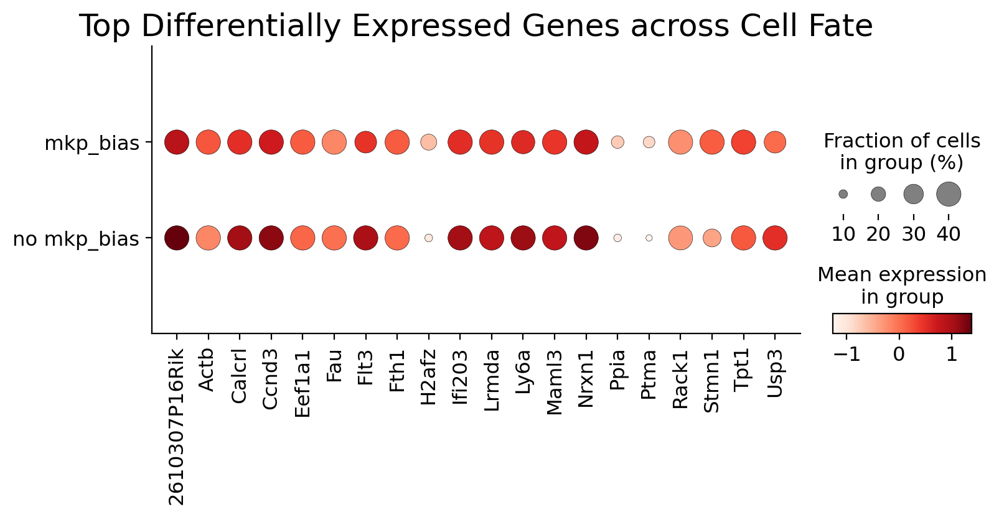

In [730]:
# # 计算两个label之间的差异
# for label in labels:
#     mask = adata.obs['fate_pred'] == label
#     avg_expression = adata[mask].X.mean(axis=0).tolist()
#     expression_data[label] = avg_expression

# # 转为DataFrame
# df_expression_all = pd.DataFrame(expression_data, index=adata.var.index.values)

import anndata
# df_expression_all['diff'] = df_expression_all[labels[0]] - df_expression_all[labels[1]]
#adata_raw = anndata.AnnData(X=adata2.raw.X, var=adata2.raw.var, obs=adata2.obs)
top_genes =  top_genes_bias[::-1].index
top_genes = top_genes.difference(['Prtn3'])
adata3_copy=adata3.copy()
sc.pp.scale(adata3_copy)
sc.pl.dotplot(adata3_copy, 
              var_names=top_genes, 
              groupby='fate_pred', 
              figsize=(8.5, 3), 
              dot_max=0.4, 
              color_map='Reds',
              title="Top Differentially Expressed Genes across Cell Fate",
              #vmin=0.1,
              #vmax=1,
              save='darlin_dotplot_fate2.pdf')
